# Temperature Estimation Function Section

When I started this project, I was not expecting to be detailing how to define and estimate extreme daily temperatures as a function. So one year in and my project has completely shifted from analysing heatwaves to focus on creating a good quality temperature estimation with minimal data points. I understand that for the most part, there are really good estimator of extreme temperatures, and even possibly someone has created a extreme temperature function similar to mine, but I never really got into exploring this element and reading on it due to belibeing this would have been a quick process. 

Whats happened now is that I aim to create a complex temperature estimation function that provides a good estimate on temperature for a particular day in hopes to better undertsand Perth's temperture climate in the 19th century. This in turn should allow me to look at a longer timescale for heatwaves to ensure that heatwaves are captured as best as possible with the limited data we do have. Unfortuantely doing a half donkey job just wouldnt cut quality needed for my heatwave results os hear I am ready to provide a semi decent to decent estimator of extreme temperatures.

It is important to note that most daily extreme estimations are on the basis of multi-nonlinear regression analysis or combining very complex code that trains on a continous temperature plot by looking forward and backwards from the day in focus. Not only that rigourous testing would ensure they capture large scale climate impacts such as frontal systems that ensure its at its highest quality. But with Perth's 19th century dataset this is not the case. Most of the more complex temperature estimations require months of data with 2 or more subdaily data within it to actually function properly, and in fact it was even attempted for this temperatyre dataset by Zac Bailey which he failed to do so. 

This meant I had to think outside the box for this and with discussions with my supervisors we agreed that a multi-linear regression would be the best way to go about this. This stops any sense of checking the date two or three days forward or back in time and no non-linear charactersitics that could pinpoint the maximum temperature and minimum temperature (tmax and tmin) for that day. With my function it also works on individual days provided you trained the data on more recent sub-daily temperature for that same region with more accurate observations. However without sufficient obsevrations throughout a day, if only one observation were to take palce, we may not know if a frotnal system or some other large scale weather pattern would affect teh temperature which would ultimately affect the results. Hence its our best guess.

Not only this, but we have this dataset that may have wrong readings, wrong times it was read at, thermoetoter was broken, someone else read it, these are all the observational errors that we cannot control and Blair Trewin has talked about the issues with observational data in the histroical context in some of his papers. Even the paper associated with this dataset, joelle and Linden, were not able to fully homogneous the data due to missing metadata about where the location was, what thermometer was used. Unfortuneletly we dont have a timemachine to work this out.

Anything besides this we know the data has issues and uncontrollable statistics, but we also know that my function is never perfect, it is a model, regression analysis that is trained on observational data that also may not be perfect and there may be missing data. Furthermore its a linear model to, this means theres no way to get curvature, if a temperature in the sub-daily context rises by 1C, the tmax or tmin will adjust linearly and accordingly by the equations set. This we also have to take into account.

This section will take you through a detailed step by step recount of what the function does, how to use it, and everything else in the alphabet that relates to how I get where I get today.

But first we need to load the packages that we know will be useful for us in this chapter

In [3]:
from bisect import bisect_left
import sys
sys.path.append(r"C:\Users\jarra\Desktop\Masters\Heatwave_Project")
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr
from scipy.stats import spearmanr
from scipy.stats import kendalltau


import scipy
from scipy.optimize import curve_fit
import warnings
warnings.filterwarnings("ignore")
#RMSE 
from sklearn.metrics import mean_squared_error
from math import sqrt
from datetime import datetime
import seaborn as sns
import random
random.seed(int('1CE32819E40', 16))
#Generate random numbers
random_float = random.random()
random_int = random.randint(1, 10)
random_int

8

Now I wont be showing the historical context just yet, but I will be using a comparison that compares the tmax and tmin observational data from the Perth Regional Office of 1942 to 1992 to the estimation of the same period. Lets download these and go from there. The only reason we are limited to that is because the sub-daily temperatures are only avalaible for that period

In [2]:
## Perth Regional Office Daily Extreme Dataset
#Load PRO in
#BOM PERTH REGIONAL OFFICE
MaxT_PRO = pd.read_csv(r"C:\Users\jarra\Desktop\Masters Research\Python\Data\IDCJAC0010_009034_1800_Data.csv")
MinT_PRO = pd.read_csv(r"C:\Users\jarra\Desktop\Masters Research\Python\Data\IDCJAC0011_009034_1800_Data.csv")
MaxT_PRO

,Product code,Bureau of Meteorology station number,Year,Month,Day,Maximum temperature (Degree C),Days of accumulation of maximum temperature,Quality
0,IDCJAC0010,9034,1897,1,1,30.6,NaN,Y
1,IDCJAC0010,9034,1897,1,2,29.4,1.0,Y
2,IDCJAC0010,9034,1897,1,3,27.8,1.0,Y
3,IDCJAC0010,9034,1897,1,4,31.7,1.0,Y
4,IDCJAC0010,9034,1897,1,5,36.7,1.0,Y
...,...,...,...,...,...,...,...,...
34812,IDCJAC0010,9034,1992,4,25,29.6,1.0,Y
34813,IDCJAC0010,9034,1992,4,26,30.0,1.0,Y
34814,IDCJAC0010,9034,1992,4,27,22.4,1.0,Y
34815,IDCJAC0010,9034,1992,4,28,22.7,1.0,Y


In [3]:
#Clean The data
MaxT_PRO['Datetime']= pd.to_datetime(MaxT_PRO[['Year', 'Month', 'Day']])
MinT_PRO['Datetime']= pd.to_datetime(MinT_PRO[['Year', 'Month', 'Day']])

#Delete irrelevent columns
del MaxT_PRO['Product code']
del MaxT_PRO['Bureau of Meteorology station number']
del MaxT_PRO['Year']
del MaxT_PRO['Month']
del MaxT_PRO['Day']
del MaxT_PRO['Days of accumulation of maximum temperature']
del MaxT_PRO['Quality']
del MinT_PRO['Product code']
del MinT_PRO['Bureau of Meteorology station number']
del MinT_PRO['Year']
del MinT_PRO['Month']
del MinT_PRO['Day']
del MinT_PRO['Days of accumulation of minimum temperature']
del MinT_PRO['Quality']

#Change the column name to date
MaxT_PRO= MaxT_PRO.rename(columns={'Datetime':'date'})
MinT_PRO= MinT_PRO.rename(columns={'Datetime':'date'})


#Change the column names
MaxT_PRO= MaxT_PRO.rename(columns={'Maximum temperature (Degree C)':'PRO Max'})
MinT_PRO= MinT_PRO.rename(columns={'Minimum temperature (Degree C)':'PRO Min'})

#Now concat it
MaxT_PRO= MaxT_PRO.set_index('date')
MinT_PRO= MinT_PRO.set_index('date')

MaxT_PRO


,PRO Max
date,
1897-01-01,30.6
1897-01-02,29.4
1897-01-03,27.8
1897-01-04,31.7
1897-01-05,36.7
...,...
1992-04-25,29.6
1992-04-26,30.0
1992-04-27,22.4


In [4]:
MinT_PRO

,PRO Min
date,
1897-01-01,19.4
1897-01-02,17.8
1897-01-03,18.3
1897-01-04,14.4
1897-01-05,16.1
...,...
1992-04-26,19.5
1992-04-27,15.7
1992-04-28,15.7


In [5]:
PRO_DE = pd.merge(left = MaxT_PRO,right  =MinT_PRO,left_index=True,right_index=True  )
PRO_DE

,PRO Max,PRO Min
date,,
1897-01-01,30.6,19.4
1897-01-02,29.4,17.8
1897-01-03,27.8,18.3
1897-01-04,31.7,14.4
1897-01-05,36.7,16.1
...,...,...
1992-04-25,29.6,15.7
1992-04-26,30.0,19.5
1992-04-27,22.4,15.7


What we have is the PRO Max and PRO Min temperatures for the Perth Regional Office, this is the data that will help train my regression model. Now I have to get the sub-daily data for the same location>

In [6]:
#Perth Regional Office 1967 to 1992 sub daily dataset
#'''
#Adjusted 1942, 1943 to 2am DST all others fixed
#r"E:\LIBRARY\UNIVERSITY\Masters Research\Python\Data\perthregionaloffice_subdaily_1942-1992_DST.csv"

#Ajdusted all hours from the DST to match back to 3am, adding 1 hour to all times affected by Daylight Saving,
#questions 1942 and 1943 not sure if its 3am or 4am adjusted.
#r"E:\LIBRARY\UNIVERSITY\Masters Research\Python\Data\perthregionaloffice_subdaily_1942-1992_DST_Removed.csv"
#'''

#Using DST rmeoved otpion
PRO_Sub = pd.read_csv(r"C:\Users\jarra\Desktop\Masters Research\Python\Data\perthregionaloffice_subdaily_1942-1992.csv")
#Had to divide by 10 as it was without decimals
PRO_Sub['date'] = pd.to_datetime(PRO_Sub['date'],dayfirst = True)
PRO_Sub = PRO_Sub.set_index('date')
PRO_Sub =PRO_Sub['temp']/10 

Now, using the metadata online for this location we noticed that around 1967 the thermoter changes locations, so to make sure we the best homogenised dataset we could use, we use the 1967 to 1992 data to train our regression model on, this also includes the extreme temperatures as well.

In [7]:
PRO_Sub_ES6792  = PRO_Sub.loc['1967':'1992']
PRO_DE6792 = PRO_DE.loc['1967':'1992']
PRO_Sub_ES6792 = PRO_Sub_ES6792.reset_index()
PRO_Sub_ES6792

,date,temp
0,1967-01-01 00:00:00,18.3
1,1967-01-01 03:00:00,17.3
2,1967-01-01 06:00:00,17.7
3,1967-01-01 09:00:00,25.1
4,1967-01-01 12:00:00,31.6
...,...,...
73864,1992-04-28 09:00:00,18.0
73865,1992-04-28 15:00:00,22.7
73866,1992-04-29 09:00:00,19.6
73867,1992-04-29 15:00:00,23.0


In [8]:
PRO_DE6792

,PRO Max,PRO Min
date,,
1967-01-01,33.1,16.4
1967-01-02,27.6,20.2
1967-01-03,28.2,18.9
1967-01-04,24.7,17.2
1967-01-05,21.4,16.1
...,...,...
1992-04-25,29.6,15.7
1992-04-26,30.0,19.5
1992-04-27,22.4,15.7


Now we have the data ready, we can begin the process of explaining how much function works.`

# 2.0 Core Function

The shell of the function, or even we can say the backbone of the entire function is comprised of 9 different functions. Also these functions then have their own subset of either functions or things they perform to eventual spit out the final product. We aim to use the information above (PRO_DE6792 and PRO_Sub_ES6792) to train the regression model onto these -datasets. The individual regressed linear models have their own crosscorrelation, their  Y = aX + b which would be [Daily_Max,Daily_Min = a*Sub_daily_Temp + b]. For a dataset of our choosing. Why we elected to go with training the model on the location of the Perth Regional Office is due to the fact that we have an extensive record that dtaes back to 1897 first of all of Max and Min temperatures, and also we are limited in the sub-daily data we recieved which since we do not have access to sub-daily and maximum and minimum data of the Perth Gardens record in the early 20th century we have to work with what we got. Perth Regional Office is fairly similar in location to Perth Gardens, but I believe its a bit more inland which means the sea winds from the fremantle doctor will have less effect or even a later affect on the Perth Regional Office then Perth Gardens. But when I implement the homogenisation then this can be fixed.

The core function has 5 inputs that will utimately spit out a single output which is the temperature estimation. The function itself upon using Temp_Estimation?? in notebooks will explain in detail what the datasets need to look like to esnure full functionality. From there I have developed my code in a way that it does not need any more attention and the columns, rows etc work themselves out and automate everything to ensure that everything works, therefore there is no need for adjustment.

Sub_Daily is the function that we will be estimating the max and min while Sub_Daily_Training and Daily_Extreme_Training are the inputs that are required to make create the linear regression models that will then compute the daily extreme esitmations for the Sub_Daily dataset. Trials is how many trails we want to use as we aim to bootstrap the dataset to get a better idea of the systemic errors in my code and also to a 90% confidence interval on the temperature dataset. \
WHY??  
Sim_Copm is to decide which method of my estimator to use, these will be compared in Chapter 2.9.

So from this point, we will use the number to indicate which function I am talking about:

0. CORE FUNCTION


1. Sub_Daily Splitter


2. Combine the subdaily to the respective Training Max and Min


3. Max and Min with Sub-Daily Month Splitter


4. Closest Hour Function 

    4.1 The Inner Function of the Closest Hour Function


5. Sampling To Dictionary


6. Linear Regression

    6.1 The fitting function for the linear polyfit


7. The MaxMin Vectors

    7.1 Maximum Subdaily Vector
    
    7.2 Minimum Subdaily Vector
    
    
8. Estimating Tmax and Tmin for all times

    8.1 The Estimator
 
 
9. The Daily Estimater

    9.1 The individual simple choice
    
    9.2 The individual complex choice 1
    
    9.3 Complex Variant 2
    
Chapter 2 will discuss all these functions and what they do to make sure they are clear and easily reproducable if needed be in Python or another language.

In [9]:
#Here are the datasets used for the example

Sub_Daily_Training = PRO_Sub_ES6792
Daily_Extreme_Training = PRO_DE6792.reset_index()
Sub_Daily = PRO_Sub.reset_index()

## 2.1 Sub_Daily Splitter

The Sub_Daily Splitter is used on the Sub_Daily_Training Dataset, this is done as the dataset is in one long vector with the date in Year-Month-Day Hours:Seconds:Milliseconds, what we aim to do is to categorise the hours into different columns but still keep the Year-Month-Day together. I also elected that we should have at least 10 years worth of temperature data for that sub-daily column to be relevent in estimating the daily extremes as the less data we have the more uncertain the daily extreme temperature will be and this is something we need to avoid.

In [10]:
Sub_Daily_Training

,date,temp
0,1967-01-01 00:00:00,18.3
1,1967-01-01 03:00:00,17.3
2,1967-01-01 06:00:00,17.7
3,1967-01-01 09:00:00,25.1
4,1967-01-01 12:00:00,31.6
...,...,...
73864,1992-04-28 09:00:00,18.0
73865,1992-04-28 15:00:00,22.7
73866,1992-04-29 09:00:00,19.6
73867,1992-04-29 15:00:00,23.0


Sub-Sub_Daily_Training dataset is a 73869 length dataset that will be used in the demonstration of this function

In [11]:
#Set datetime to date
Data = Sub_Daily_Training

Data_Col = Data.columns
Data = Data.set_index(Data_Col[0])
Data

,temp
date,
1967-01-01 00:00:00,18.3
1967-01-01 03:00:00,17.3
1967-01-01 06:00:00,17.7
1967-01-01 09:00:00,25.1
1967-01-01 12:00:00,31.6
...,...
1992-04-28 09:00:00,18.0
1992-04-28 15:00:00,22.7
1992-04-29 09:00:00,19.6


In [12]:
Data_Col

Index(['date', 'temp'], dtype='object')

The above function sets the date column as the index, this is a vital part of the function as it allows for the loc function to hone in on the subdaily temperatures in order to split the function`

In [13]:
#We need the hours in 24 hour format as a list.
Every_Hour = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]

#Now to create the dictionaries necessary for the splitting.
Sub_Hourly_Dic = {}
# Hours_Avaliable is different to Every_Hour as it finds hours that have data with at least 10 years worth of data.
Hours_Avaliable = []

Since we are looking at the hourly columns, we need to make sure that every hour in the 24hour format is identified, this will be reduced due to the 10 year limit I have also implemented, if we did have hourly data for these datapoints for more then 10 years each, all 24 hours could be used which would actually reduce the error in the estimation however we have to work with what we have.

Now we implenet a for loop that loops through Every_Hour and then checks (len(Single_Hour_Data) >= 3600) to ensure that at if the data is more then 3600 datapoints, it can be accepted. Lets use the example of hour 12

In [14]:

HOUR = 12
#Locate all the data for that hour
Single_Hour_Data = pd.concat([Data[Data.index.hour==HOUR]],axis =0)

#Now to check if the data has at least 10 years worth of Data
if (len(Single_Hour_Data) >= 3600):
    #If it is then append it into the dictionary

    #reset the index to fix the datetime
    Single_Hour_Data = Single_Hour_Data.reset_index()
    #Make sure that datetime is still on the date we used
    Single_Hour_Data[Data_Col[0]] = pd.to_datetime(Single_Hour_Data[Data_Col[0]]).dt.date
    #Set Index back to date, but maybe not if we need to make it for Max and Min
    Single_Hour_Data = Single_Hour_Data.set_index(Data_Col[0]).dropna()

    #Add to Dictionaries and columns
    Sub_Hourly_Dic["Hour" +"_"+ str(HOUR)] = Single_Hour_Data

In [15]:
Sub_Daily_Dictionary_12 = Sub_Hourly_Dic.get('Hour_12').reset_index()
Sub_Daily_Dictionary_12

,date,temp
0,1967-01-01,31.6
1,1967-01-02,25.0
2,1967-01-03,26.9
3,1967-01-04,24.1
4,1967-01-05,19.9
...,...,...
8866,1992-04-06,25.2
8867,1992-04-07,21.5
8868,1992-04-08,24.7
8869,1992-04-09,25.0


In [16]:
print(Sub_Daily_Dictionary_12.loc[0])
Data.loc['1967-01-01 12:00:00']

date    1967-01-01
temp          31.6
Name: 0, dtype: object


temp    31.6
Name: 1967-01-01 12:00:00, dtype: float64

As we can see the Sub_Daily_Dictionary_12 is the extraction of the 12 hour from Data dataset, therefore we see that for the first part of the function that the dictionary acts as a column for each Hour making it easier to extract in the future.

In [17]:
#Set datetime to date
Data = Sub_Daily_Training


#Set datetime to date
Data_Col = Data.columns
Data = Data.set_index(Data_Col[0])

#We need the hours in 24 hour format as a list.
Every_Hour = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]

#Now to create the dictionaries necessary for the splitting.
Sub_Hourly_Dic = {}
# Hours_Avaliable is different to Every_Hour as it finds hours that have data with at least 10 years worth of data.
Hours_Avaliable = []

#Begin the for loop
for HOUR in Every_Hour:

    #Locate all the data for that hour
    Single_Hour_Data = pd.concat([Data[Data.index.hour==HOUR]],axis =0)

    #Now to check if the data has at least 10 years worth of Data
    if (len(Single_Hour_Data) >= 3600):
        #If it is then append it into the dictionary

        #reset the index to fix the datetime
        Single_Hour_Data = Single_Hour_Data.reset_index()
        #Make sure that datetime is still on the date we used
        Single_Hour_Data[Data_Col[0]] = pd.to_datetime(Single_Hour_Data[Data_Col[0]]).dt.date
        #Set Index back to date, but maybe not if we need to make it for Max and Min
        Single_Hour_Data = Single_Hour_Data.set_index(Data_Col[0]).dropna()

        #Add to Dictionaries and columns
        Sub_Hourly_Dic["Hour" +"_"+ str(HOUR)] = Single_Hour_Data

        #This becomes useful in the next section where we get information relative to max and min temperatures.
        Hours_Avaliable.append(HOUR)

In [18]:
Hours_Avaliable

[0, 3, 6, 9, 12, 15, 18, 21]

In [19]:
Hours_Avaliable

[0, 3, 6, 9, 12, 15, 18, 21]

When applying the full function to append the hours into seperate datasets in terms of hours we can see that the Hours_Avaliable so when (len(Single_Hour_Data) >= 3600) are [0, 3, 6, 9, 12, 15, 18, 21], but in the entire sub-daily dataset there are other times that have data but its less then at least 10 years.

Now we need to split this up into the max and min subdaily sections. WHY is this the case, well we know that the Max and Min temperatures are observed throughout different periods of the day, not only this is that choosing different periods actually show different correlations. For example when finding the Maximum temperature on the 2nd of April, this temperautees is not calculated from 12am to 11:59pm, its actually from 9am to 8:59am the next day and this also is similar for the minimum temperature but shifted back one day, so 9am the day before to 8:59am on the day in focus. To understand more context of the choices Chapter 2.6 will dive into the selection choice of this. The reason why the tmin is chosen in this way is because the minimum temperature over a 24hour period is usually at around 3am to 6am for Perth, therefore to be in line with the tmax, it would not be a good idea to use the 9am to 9am temperature the next day for the minimum temperature of the day in focus. The minimum temperature is most likely going to occur in the early hours of the morning with very few exceptions such as a colder day the day before that has a minimum that is lower then the minimum of the early morning of the day in focus.

With this being said there are some pros and cons with this method, the pros are that the tmin is usually based off the characteristcs of the day before more then the next day with 9am on the day in focus still holding the characteristic for the tmin. The day in focus loses that correlation between the tmin after 9am. Now why is this the case? The reason that is possibly behind it is that during the previous day the temperature is influenced by the sun, clouds, wind, pressure systems, rain, and fremantle doctor which cause the temperature to rise at different rates then a sunny day. But overall the sun is the largest driving factor in terms of heating the region. Now as the sun disappears below the surface of the earth, the only controls of the temperature are the fremantle doctor, and blackbody radiaiton and some level of cloud cover. However its a much stable decrease. This means that whatever happens during the day influences what the temperature reaches overnight.

There are some exceptions such as large scale systems changing wind patterns and cooling rates due to whether a high or low pressure system affecting these, but on a normal day without these large scale patterns, the influence of the heating in the day prior will have an effect on the temperature wqhich is carried onto the 9am temperature of the day in focus as wlel. The maths and correlations to support these reasons will be discussed in Chapter 2.6

Below is a discussion found within the function itself.

#######

This is a bit of explanation about the choices I make with what horus I choose for this. So in my previous versions of creating this function I had to choose the times of when I can locate the Tmax and Tmin from. Now what noticed was firstly on the day (+0) the Tmax was generally found between 12pm+0 to 6pm+0. So this meant the likelyhood that the max was between 9am+0 to 9am+1. This actually aligns with what times the Tmax is found between 9am+0 to 9am+1. This means that for this we need to shift the hour values of 0am+1 to 8am+1 to be used on this particular day.

Now there is a trickier part. It is the tmin. Like the tmax, the tmin is calulcated by the BOM from 9am-1 to 9am+0. However within my findings it turns out that the correlation at 9am-1 is much lower then at 9am+0, furthermore the afetrnoon of the prvious day has a higher correlation to what the min will be the next day than the correlation of the day in focus. This has me belive that the min for the day in focus is influenced much more highly by the temperatures of the previous day then the temperature of the day in focus which I will go into further discussion later and read about on papers becasue this is an interesting debate. But to estimate temperature more of this will be explained and explored.

For now, I came to the conculsion that the tmin will be estimated by the 10am-1 to 10am+0 to account for the 9am+0 higher correlation. For tmax it will be like the BOM standard 9am+0 to 9am+1

#######

HOWEVER REWORD CAUSE WE KNOW 9AM the day of is alos higjly correlated to the minimum temperarutre!!!!!!!!

In the code below I will show 3 examples of how this works, one with the day in focus, one with the next day and one with the previous day.

In [20]:
#LOOKING AT MAX 3PM
#Extract the DataFrame for that specific hour
Hourly_Data =  Sub_Hourly_Dic.get('Hour_15')

Hourly_Data

,temp
date,
1967-01-01,28.6
1967-01-02,26.1
1967-01-03,24.1
1967-01-04,24.0
1967-01-05,20.1
...,...
1992-04-25,29.1
1992-04-26,24.9
1992-04-27,21.4


In [21]:
#Lets shift the hours

#MAX
#Remember 0+0 to 8+1
if (15 in range(0,9)):
    #Shift it negative one which means everything is pushed up, so tomorrows temp is now are todays hour.
    Shift_Max = Hourly_Data.shift(-1, axis = 0).dropna()

else:
    Shift_Max = Hourly_Data
Shift_Max

,temp
date,
1967-01-01,28.6
1967-01-02,26.1
1967-01-03,24.1
1967-01-04,24.0
1967-01-05,20.1
...,...
1992-04-25,29.1
1992-04-26,24.9
1992-04-27,21.4


In [22]:
pd.concat([Hourly_Data,Shift_Max],axis = 1)

,temp,temp
date,,
1967-01-01,28.6,28.6
1967-01-02,26.1,26.1
1967-01-03,24.1,24.1
1967-01-04,24.0,24.0
1967-01-05,20.1,20.1
...,...,...
1992-04-25,29.1,29.1
1992-04-26,24.9,24.9
1992-04-27,21.4,21.4


What we see of the 3pm Max temperature is that is it the same, this is because we need it to be the same as its the same day from 9am to 11:59pm. Now what happens to the values after 12am, lets check

In [23]:
#LOOKING AT MAX 3PM
#Extract the DataFrame for that specific hour
Hourly_Data =  Sub_Hourly_Dic.get('Hour_3')

Hourly_Data

,temp
date,
1967-01-01,17.3
1967-01-02,20.4
1967-01-03,19.7
1967-01-04,17.7
1967-01-05,16.7
...,...
1992-04-06,19.3
1992-04-07,18.8
1992-04-08,19.0


In [24]:
#Lets shift the hours

#MAX
#Remember 0+0 to 8+1
if (3 in range(0,9)):
    #Shift it negative one which means everything is pushed up, so tomorrows temp is now are todays hour.
    Shift_Max = Hourly_Data.shift(-1, axis = 0).dropna()

else:
    Shift_Max = Hourly_Data

pd.concat([Hourly_Data,Shift_Max],axis = 1)

,temp,temp
date,,
1967-01-01,17.3,20.4
1967-01-02,20.4,19.7
1967-01-03,19.7,17.7
1967-01-04,17.7,16.7
1967-01-05,16.7,14.4
...,...,...
1992-04-06,19.3,18.8
1992-04-07,18.8,19.0
1992-04-08,19.0,17.8


What we see is that the data is now shifted up by 1 day, so this means 1992-04-10 would be cut off. Why is this the case? Although hihgly unlikely, since the tmax is based off 9am to 9am the next day we need to take this in account when estimating tmax that there is always a posisbility that the max could be at 3am. But we must ensure to aligns with the BOM standard of 9am to 8:59am. So the shift max, is the one on the right has the 3am temperature of the next as part of the day in focus.

Now what about the minimum case.

In [25]:
#LOOKING AT MAX 3PM
#Extract the DataFrame for that specific hour
Hourly_Data =  Sub_Hourly_Dic.get('Hour_15')

if (15 in range(10,23)):
    #Shift it positive one which means everything is pushed down, so yesterdays temp is now are todays temp.
    Shift_Min = Hourly_Data.shift(1, axis = 0).dropna()

else:
    Shift_Min = Hourly_Data
pd.concat([Hourly_Data,Shift_Min],axis = 1)

,temp,temp
date,,
1967-01-01,28.6,NaN
1967-01-02,26.1,28.6
1967-01-03,24.1,26.1
1967-01-04,24.0,24.1
1967-01-05,20.1,24.0
...,...,...
1992-04-25,29.1,27.2
1992-04-26,24.9,29.1
1992-04-27,21.4,24.9


What we see is the opposite happening where it goes from 10am the day before to 10ma of the day in focus. The reason is that the minimum temperature is highly correlated at the 9am temperature for the day in focus compared to the previous day therefore the decision was to shift it forward by 1 hour. This is clear as the second column for the shift at 3pm is shifted so the minimum for the day in focus in calculated from the day before so 1967-01-02 3pm is from 1967-01-01.

So as we can see this is how we begin to get the data ready for temperature estimations.

In [26]:
#Create the dictionaries for max and min
Sub_Max = {}
Sub_Min = {}

#Now for loop with the hours we do have
for HOURS in Hours_Avaliable:
    #Lets shift the hours
    #Since we know the key was "Hour_HOURS"
    #Extract the DataFrame for that specific hour
    Hourly_Data =  Sub_Hourly_Dic.get('Hour_{}'.format(HOURS))

    #MAX
    #Remember 0+0 to 8+1
    if (HOURS in range(0,9)):
        #Shift it negative one which means everything is pushed up, so tomorrows temp is now are todays hour.
        Shift_Max = Hourly_Data.shift(-1, axis = 0).dropna()
        #Append it to max dictionary
        Sub_Max["Hour" +"_"+ str(HOURS)+"+1"] =Shift_Max
    else:
        Shift_Max = Hourly_Data
        #Append it to max dictionary
        Sub_Max["Hour" +"_"+ str(HOURS)+"+0"] = Shift_Max


    #Min

    #Remember 9-1 to 8+0 : IN LINE WITH BOM STANDARDS, SHOULDNT MESS WITH IT

    if (HOURS in range(10,23)):
        #Shift it positive one which means everything is pushed down, so yesterdays temp is now are todays temp.
        Shift_Min = Hourly_Data.shift(1, axis = 0).dropna()
        #Append it to min dictionary
        Sub_Min["Hour" +"_"+ str(HOURS)+"-1"] =Shift_Min
    else:
        Shift_Min = Hourly_Data
        #Append it to max dictionary
        Sub_Min["Hour" +"_"+ str(HOURS)+"+0"] = Shift_Min

    
    
Sub_Max

{'Hour_0+1':             temp
 date            
 1967-01-01  20.6
 1967-01-02  20.9
 1967-01-03  19.0
 1967-01-04  17.1
 1967-01-05  15.8
 ...          ...
 1992-04-05  20.6
 1992-04-06  20.9
 1992-04-07  19.8
 1992-04-08  19.5
 1992-04-09  19.3
 
 [8871 rows x 1 columns],
 'Hour_3+1':             temp
 date            
 1967-01-01  20.4
 1967-01-02  19.7
 1967-01-03  17.7
 1967-01-04  16.7
 1967-01-05  14.4
 ...          ...
 1992-04-05  19.3
 1992-04-06  18.8
 1992-04-07  19.0
 1992-04-08  17.8
 1992-04-09  17.8
 
 [8872 rows x 1 columns],
 'Hour_6+1':             temp
 date            
 1967-01-01  20.4
 1967-01-02  19.9
 1967-01-03  18.1
 1967-01-04  17.2
 1967-01-05  13.2
 ...          ...
 1992-04-05  18.0
 1992-04-06  18.4
 1992-04-07  17.9
 1992-04-08  15.8
 1992-04-09  16.0
 
 [8870 rows x 1 columns],
 'Hour_9+0':             temp
 date            
 1967-01-01  25.1
 1967-01-02  23.9
 1967-01-03  25.4
 1967-01-04  21.7
 1967-01-05  18.4
 ...          ...
 1992-04-26  22.8
 199

In [27]:
Sub_Min

{'Hour_0+0':             temp
 date            
 1967-01-01  18.3
 1967-01-02  20.6
 1967-01-03  20.9
 1967-01-04  19.0
 1967-01-05  17.1
 ...          ...
 1992-04-06  20.6
 1992-04-07  20.9
 1992-04-08  19.8
 1992-04-09  19.5
 1992-04-10  19.3
 
 [8872 rows x 1 columns],
 'Hour_3+0':             temp
 date            
 1967-01-01  17.3
 1967-01-02  20.4
 1967-01-03  19.7
 1967-01-04  17.7
 1967-01-05  16.7
 ...          ...
 1992-04-06  19.3
 1992-04-07  18.8
 1992-04-08  19.0
 1992-04-09  17.8
 1992-04-10  17.8
 
 [8873 rows x 1 columns],
 'Hour_6+0':             temp
 date            
 1967-01-01  17.7
 1967-01-02  20.4
 1967-01-03  19.9
 1967-01-04  18.1
 1967-01-05  17.2
 ...          ...
 1992-04-06  18.0
 1992-04-07  18.4
 1992-04-08  17.9
 1992-04-09  15.8
 1992-04-10  16.0
 
 [8871 rows x 1 columns],
 'Hour_9+0':             temp
 date            
 1967-01-01  25.1
 1967-01-02  23.9
 1967-01-03  25.4
 1967-01-04  21.7
 1967-01-05  18.4
 ...          ...
 1992-04-26  22.8
 199

Now we see the full extent of the function and what is does in detial and why. All the data is presented in the form of dictionaries with the outputs being the Sub_Max, Sub_Min and Hours_Avalaible. Both Sub_Max and Sub_Min are for the respective tmax and tmin estimation

## 2.2 Combine the subdaily to the respective Training Max and Min

The goal of this function is to match tmax and tmin of the training data to the sub-daily data we computed from the previous function with the inputs being Sub_Max,Sub_Min,Hours_Avaliable, DE_values, with DE_values meaning the daily extreme tmax and tmin values.

In [28]:
#Extract the max and min keys
Keys_Mx = list(Sub_Max)
Keys_Mn = list(Sub_Min)

In [29]:
Keys_Mx


['Hour_0+1',
 'Hour_3+1',
 'Hour_6+1',
 'Hour_9+0',
 'Hour_12+0',
 'Hour_15+0',
 'Hour_18+0',
 'Hour_21+0']

In [30]:
Keys_Mn

['Hour_0+0',
 'Hour_3+0',
 'Hour_6+0',
 'Hour_9+0',
 'Hour_12-1',
 'Hour_15-1',
 'Hour_18-1',
 'Hour_21-1']

In [31]:
Sub_Max.get(Keys_Mx[1])

,temp
date,
1967-01-01,20.4
1967-01-02,19.7
1967-01-03,17.7
1967-01-04,16.7
1967-01-05,14.4
...,...
1992-04-05,19.3
1992-04-06,18.8
1992-04-07,19.0


In [32]:
i =1
Sub_Max = Sub_Max

DE_values = Daily_Extreme_Training

DE_values_col = DE_values.columns
DE_values = DE_values.set_index(DE_values_col[0])



#Extract the subdaily data for that hour
Mx_Sub = Sub_Max.get(Keys_Mx[i])
#Combine with Tmax where datetime si the joiner
Combined_Train_Mx = pd.merge(left = Mx_Sub, 
                                right  =DE_values[DE_values_col[1]],
                                left_index=True,right_index=True  )
#Rename to Max
Combined_Train_Mx = Combined_Train_Mx.rename(columns={DE_values_col[1]:'Max'})
Combined_Train_Mx

,temp,Max
date,,
1967-01-01,20.4,33.1
1967-01-02,19.7,27.6
1967-01-03,17.7,28.2
1967-01-04,16.7,24.7
1967-01-05,14.4,21.4
...,...,...
1992-04-05,19.3,27.8
1992-04-06,18.8,27.5
1992-04-07,19.0,21.7


From this example of teh function, the DE_values is based of the training data for the Max and Min which aligns with the dates of the subdaily dataset so Keys_Mx[1] is Hour_3+1, therefore is matching the daily extrmee Max to the subdaily 3am temperature for the day in focus, however since we know its from 9am to 9am, this temperature is actually the next days 3am temperature. This example shows how the BOM 9am to 9am tmax shift and match works for the data.

As we can see combining the two, for 1967-01-01 gets the tmax whihc is 33.1C and the subdaily 3am temperatuew whcih is 20.4C and put these two together in a 8872 length matrix with the temp on one side and the Max on the other, this is then added to a new dictionary that is either for the max and min, this will then be used to identify they correlation and linear regression of the model for this temperature which is in Chapter 2.6

In [33]:
DE_values = Daily_Extreme_Training

DE_values_col = DE_values.columns
DE_values = DE_values.set_index(DE_values_col[0])



#Create the and Min dictionaries
Sub_Mx = {}
Sub_Mn = {}

#Extract the max and min keys
Keys_Mx = list(Sub_Max)
Keys_Mn = list(Sub_Min)

#Go with Tmax
for i in range(len(Keys_Mx)):
    #Extract the subdaily data for that hour
    Mx_Sub = Sub_Max.get(Keys_Mx[i])
    #Combine with Tmax where datetime si the joiner
    Combined_Train_Mx = pd.merge(left = Mx_Sub, 
                                    right  =DE_values[DE_values_col[1]],
                                    left_index=True,right_index=True  )
    #Rename to Max
    Combined_Train_Mx = Combined_Train_Mx.rename(columns={DE_values_col[1]:'Max'})
    #Append to dictioanry 
    Sub_Mx["Hour" +"_"+ str(Hours_Avaliable[i])] = Combined_Train_Mx

#Min follow similar as Max
for j in range(len(Keys_Mn)):
    #Extract the subdaily data for that hour
    Mn_Sub = Sub_Min.get(Keys_Mn[j])
    #Combine with Tmax where datetime si the joiner
    Combined_Train_Mn = pd.merge(left = Mn_Sub, 
                                    right  =DE_values[DE_values_col[2]],
                                    left_index=True,right_index=True  )
    Combined_Train_Mn = Combined_Train_Mn.rename(columns={DE_values_col[2]:'Min'})
    #Append to dictioanry 
    Sub_Mn["Hour" +"_"+ str(Hours_Avaliable[j])] = Combined_Train_Mn

In [34]:
Sub_Mx


{'Hour_0':             temp   Max
 date                  
 1967-01-01  20.6  33.1
 1967-01-02  20.9  27.6
 1967-01-03  19.0  28.2
 1967-01-04  17.1  24.7
 1967-01-05  15.8  21.4
 ...          ...   ...
 1992-04-05  20.6  27.8
 1992-04-06  20.9  27.5
 1992-04-07  19.8  21.7
 1992-04-08  19.5  25.8
 1992-04-09  19.3  26.7
 
 [8871 rows x 2 columns],
 'Hour_3':             temp   Max
 date                  
 1967-01-01  20.4  33.1
 1967-01-02  19.7  27.6
 1967-01-03  17.7  28.2
 1967-01-04  16.7  24.7
 1967-01-05  14.4  21.4
 ...          ...   ...
 1992-04-05  19.3  27.8
 1992-04-06  18.8  27.5
 1992-04-07  19.0  21.7
 1992-04-08  17.8  25.8
 1992-04-09  17.8  26.7
 
 [8872 rows x 2 columns],
 'Hour_6':             temp   Max
 date                  
 1967-01-01  20.4  33.1
 1967-01-02  19.9  27.6
 1967-01-03  18.1  28.2
 1967-01-04  17.2  24.7
 1967-01-05  13.2  21.4
 ...          ...   ...
 1992-04-05  18.0  27.8
 1992-04-06  18.4  27.5
 1992-04-07  17.9  21.7
 1992-04-08  15.8  25.8
 1

In [35]:
Sub_Mn

{'Hour_0':             temp   Min
 date                  
 1967-01-01  18.3  16.4
 1967-01-02  20.6  20.2
 1967-01-03  20.9  18.9
 1967-01-04  19.0  17.2
 1967-01-05  17.1  16.1
 ...          ...   ...
 1992-04-06  20.6  17.0
 1992-04-07  20.9  18.0
 1992-04-08  19.8  17.7
 1992-04-09  19.5  15.1
 1992-04-10  19.3  15.4
 
 [8872 rows x 2 columns],
 'Hour_3':             temp   Min
 date                  
 1967-01-01  17.3  16.4
 1967-01-02  20.4  20.2
 1967-01-03  19.7  18.9
 1967-01-04  17.7  17.2
 1967-01-05  16.7  16.1
 ...          ...   ...
 1992-04-06  19.3  17.0
 1992-04-07  18.8  18.0
 1992-04-08  19.0  17.7
 1992-04-09  17.8  15.1
 1992-04-10  17.8  15.4
 
 [8873 rows x 2 columns],
 'Hour_6':             temp   Min
 date                  
 1967-01-01  17.7  16.4
 1967-01-02  20.4  20.2
 1967-01-03  19.9  18.9
 1967-01-04  18.1  17.2
 1967-01-05  17.2  16.1
 ...          ...   ...
 1992-04-06  18.0  17.0
 1992-04-07  18.4  18.0
 1992-04-08  17.9  17.7
 1992-04-09  15.8  15.1
 1

Now we have our data ready to be inputted into the linear regression model, but before we do this, we mus also assume that the monthly values will change as well, as we know for a sub-tropical region there is a annual cycle with the southern hemisphere having its warmest days in January and coldest in Jul, therefore we must split these into separate months in the next function

 ## 2.3 Max and Min with Sub-Daily Month Splitter

So with our hours available and sub-daily data for that have the max and min, we must split the data into the 12 months of the year.

In [36]:
#Lets get all the monthly arrays sorted   
Month_Number = [1,2,3,4,5,6,7,8,9,10,11,12]
Month_Name = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

In [37]:
Sub_Ext_Max = Sub_Mx
#OUT FOR LOOP
#Extract Max and Min DataFrames, as of the other function we know what the key is for the dictionary
Max_Data = Sub_Ext_Max.get('Hour_3')
Max_Data
                           


,temp,Max
date,,
1967-01-01,20.4,33.1
1967-01-02,19.7,27.6
1967-01-03,17.7,28.2
1967-01-04,16.7,24.7
1967-01-05,14.4,21.4
...,...,...
1992-04-05,19.3,27.8
1992-04-06,18.8,27.5
1992-04-07,19.0,21.7


This is the data that we calculated in the previous function and honestly the two functions can be combined, however realistically a function should generally have one purprose and the purpose of this function compared to the previous are different altogether

In [38]:
#INNER FOR LOOP
#Get the data for the month only
Month_Max_Data = pd.concat([Max_Data[Max_Data.index.month==Month_Number[3]],], axis = 0)
Month_Max_Data

,temp,Max
date,,
1967-04-01,16.6,28.3
1967-04-02,18.3,24.7
1967-04-03,10.8,19.6
1967-04-04,14.7,22.2
1967-04-05,18.9,25.3
...,...,...
1992-04-05,19.3,27.8
1992-04-06,18.8,27.5
1992-04-07,19.0,21.7


What we see is here is now the subset of the hourly data in terms of the month which in this case is March. This is all added to a single dictionary and now is ready to be inputted into Chapter 2.6 Function of the linear regression for eahc monht, and hour

In [39]:
#Lets get all the monthly arrays sorted   
Month_Number = [1,2,3,4,5,6,7,8,9,10,11,12]
Month_Name = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

#Now lets create a monthly dictionary that the subdaily and its associated tmax/tmin can go in
Monthly_Split_Dic = {}

#The months 
Sub_Ext_Max = Sub_Mx
Sub_Ext_Min = Sub_Mn

#Lets begin the loop to extract the subdaily find the hours and append it all together
for i in Hours_Avaliable:
    #Extract Max and Min DataFrames, as of the other function we know what the key is for the dictionary
    Max_Data = Sub_Ext_Max.get('Hour_{}'.format(i))
    Min_Data = Sub_Ext_Min.get('Hour_{}'.format(i))

    #Extract the Month Number and extract the data for that month
    for q in range(len(Month_Number)):
        #Get the data for the month only
        Month_Max_Data = pd.concat([Max_Data[Max_Data.index.month==Month_Number[q]],], axis = 0)
        Month_Min_Data = pd.concat([Min_Data[Min_Data.index.month==Month_Number[q]],], axis = 0)
        #Add to Dictionary
        Monthly_Split_Dic[Month_Name[q] +"_"+ str(i) + "_"+"Mx"] = Month_Max_Data
        Monthly_Split_Dic[Month_Name[q] +"_"+ str(i) +"_"+ "Mn"] = Month_Min_Data

In [40]:
Monthly_Split_Dic

{'Jan_0_Mx':             temp   Max
 date                  
 1967-01-01  20.6  33.1
 1967-01-02  20.9  27.6
 1967-01-03  19.0  28.2
 1967-01-04  17.1  24.7
 1967-01-05  15.8  21.4
 ...          ...   ...
 1991-01-27  26.0  32.0
 1991-01-28  24.7  34.2
 1991-01-29  28.8  40.1
 1991-01-30  28.8  43.2
 1991-01-31  28.0  45.8
 
 [713 rows x 2 columns],
 'Jan_0_Mn':             temp   Min
 date                  
 1967-01-01  18.3  16.4
 1967-01-02  20.6  20.2
 1967-01-03  20.9  18.9
 1967-01-04  19.0  17.2
 1967-01-05  17.1  16.1
 ...          ...   ...
 1991-01-27  21.5  19.6
 1991-01-28  26.0  18.9
 1991-01-29  24.7  22.0
 1991-01-30  28.8  25.1
 1991-01-31  28.8  25.5
 
 [713 rows x 2 columns],
 'Feb_0_Mx':             temp   Max
 date                  
 1967-02-01  26.1  40.6
 1967-02-02  22.2  31.9
 1967-02-03  20.9  28.9
 1967-02-04  23.3  30.9
 1967-02-05  23.1  39.2
 ...          ...   ...
 1991-02-24  17.3  26.5
 1991-02-25  18.3  20.4
 1991-02-26  25.2  26.1
 1991-02-27  25.7  29.

This is the full dictionary of all the data we have for each of the months and hours in terms of the Max and Min

Text(0.5, 1.0, 'Min vs Hour 0 observed')

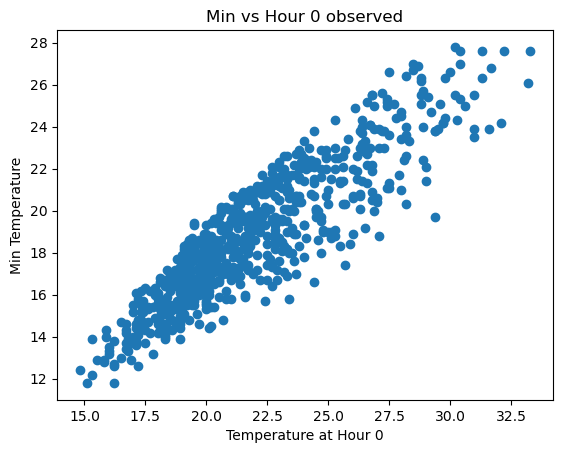

In [41]:
#Plot_Jan
Plot_Jan = Monthly_Split_Dic.get('Jan_0_Mn')
#Plot the scatter of temp and Min
plt.scatter(Plot_Jan['temp'],Plot_Jan['Min'])
plt.xlabel('Temperature at Hour 0')
plt.ylabel('Min Temperature')
plt.title('Min vs Hour 0 observed')





From the Min vs Hour 0 Observed plot we see that there is quite a scatter around the temperature at hour 0 compared to the Min temperature but it is positively correlated where the Min temperature increases with an increase in the observation temperature. With this information without estimating the correlation we can use this for a linear regression line for this temperature which will be discussed in chapter 2.6

## 2.4 Closest Hour Function

Before I implement the linear regression, I want to clean up the data we will actually use to estimate the tmax and tmins. Since we cannot have nice things, there are some issues that I needed to address before I could give this code the green light. This function aims to get data that may not match the Hours_Available to mathc the Hours_Avaliable as best as we can. For example lets say we have a 10am point, we know that in my code we dont have an linear regression for 10am therefore we must fit this to the data we have. Now for a more recent case, we could potential just drop these values hwoever when we look further back in time, this might be the only time we have a temperature value for that day. Furthermore, we need to undertsand that the readings in the 19th century may not have bee accurate, they could say 10am was the reading but they could have potentially have read it at 10:05 or 9:35 or some other time, it is also good to note that there may have been using the sun clock instead of a watch, therefore there is uncertainty around what time they actually read the temperature. Therefore this function will be useful in its ability to match the data to times that are closest to that data.|

In [42]:
Data = Sub_Daily
#lets extract an individual day
Individual_Day = Data.loc[1]
#Extract hour
Individual_Hour = Individual_Day['date'].hour
Individual_Hour

15

So the Individual_Hour is the hour that has come from the individual day that we pulled out, now this is fed into another function which will be discussed in Chapter 2.4.1. Once this is completed in the Chapter 2.4.1 function (take_closest), it will then go thorugh another check which is the 0/24 hour check. Lets say we have a value that takes a value of 24, ot will check if this value thats below 24 is closer or equal to the above 0 value then it will take that hour. This ensured we remain consistent with the hours and that 24 hour = 0 hour.m

In [43]:
#So the cell can work the function take_closest added here and then in 2.4.1 it will be explained
def take_closest(myList, myNumber): 
    """
    Parameter
    --------------
    
    Assumes myList is sorted. Returns closest value to myNumber.

    If two numbers are equally close, return the smallest number.
    
    myList: 
        The values that the data can be closest to
    
    myNumber:
        The raw value that will then be converted to the Closest Hour
        
    Returns
    ---------------
    after/before : Integer
        Value that the hour can be closest to
    """
    pos = bisect_left(myList, myNumber)
    if pos == 0:
        return myList[0]
    if pos == len(myList):
        return myList[-1]
    before = myList[pos - 1]
    after = myList[pos]
    if after - myNumber < myNumber - before:
        return after
    else:
        return before

#Include 24 in the hours avalaible, this is to get it back to 0
Hours_Avaliable_Inc_24 = Hours_Avaliable.copy()
Hours_Avaliable_Inc_24.append(24)
hours = Hours_Avaliable_Inc_24

Data = Sub_Daily
#Get a new array
closest_hour= []

#We want to match to the hour closest to the 3

for i in range(len(Data)):
    #Extract the single day
    Individual_Day = Data.loc[i]

    #Extract hour
    Individual_Hour = Individual_Day['date'].hour

    #Take the closest hour
    Closest_Ind_Hour = take_closest(hours, Individual_Hour)

    #If closest hour is 24, make sure it takes the closest hour on either side with the 23 and lower being favoured
    if (Closest_Ind_Hour == 24):
        Left_Check= abs(24 - hours[len(hours)-2])
        Right_Check = abs(hours[0]-0)


        if Left_Check > Right_Check:
            Closest_Ind_Hour = hours[0]
        else:
            Closest_Ind_Hour = hours[len(hours)-2]


    #Append the closest hour 
    closest_hour.append(Closest_Ind_Hour)

#Add it as a series then combine to make it a dataframe
CL = pd.Series(closest_hour, name = 'Closest Hour')
Dataset_Subdaily = pd.merge(left = Data,right  =CL,left_index=True,right_index=True  )
Dataset_Subdaily    

,date,temp,Closest Hour
0,1942-01-01 09:00:00,23.0,9
1,1942-01-01 15:00:00,26.4,15
2,1942-01-01 21:00:00,21.9,21
3,1942-01-02 09:00:00,24.1,9
4,1942-01-02 15:00:00,25.6,15
...,...,...,...
134523,1992-04-28 09:00:00,18.0,9
134524,1992-04-28 15:00:00,22.7,15
134525,1992-04-29 09:00:00,19.6,9
134526,1992-04-29 15:00:00,23.0,15


As we can see the closest hour has been implemented to the entire subdaily dataset fthat we will use

### 2.4.1 The Inner Function of the Closest Hour Function

This part of the code basically uses that hour and the Hours_Avialable matrix to make a decision on the time it should take, for example lets say the hours vector when 12, 14, 16, it will check to see which side it will take which it will take the lower value of the two, so it will take the 14 hour instead of 16 as displayed below.

This is just how the function works, but why??

In [44]:
take_closest([12,14,16],15)

14

## 2.5 Sampling

Now we have the data to be estimated in the best form possible we will leave that alone for the time being. The goal in chapter is to explain the sampling of my data and why this is needed. So with the data that we have extracted frrom the months and hours, we aim to boostrap our data to produce a confidence intevral on the historical data. Tjis will account for some error that may have been made in the observational data such as accidental 50C recordings which when sampling may be skipped. We also aim to sample the length as the data we have so lets say we have 713 observations for January Hour 0 to compare to the minimum temperature. What we wil do is sample uniformly across this 713 observations 713 times, therefore the possibility of certian dates sampled two or more times is possible but not extreme enough to cause a major affect. Why this is the case is because all observational data for all months is at different lengths, for example February has 28 days compared to Januarys 31, so with the 25 years of data we have from 1967 to 1992, we expect about 70 days less then January. Therefore sampling 713 times for Febraury would mean that the chance for an observation having more then 2 values over 1000 trials would be higher in probability then January. This causes some disportion in the esitmation which may effect the final results. Therefore making sure we keep the samples as long as the observations will ensure theres an equal chance that every observation datapoint will be selected more then twice equally and uniformly.

In [45]:
#Our exmaple case
Example_Resample_Case = Monthly_Split_Dic.get('Jan_0_Mn').dropna()
Example_Resample_Case

,temp,Min
date,,
1967-01-01,18.3,16.4
1967-01-02,20.6,20.2
1967-01-03,20.9,18.9
1967-01-04,19.0,17.2
1967-01-05,17.1,16.1
...,...,...
1991-01-27,21.5,19.6
1991-01-28,26.0,18.9
1991-01-29,24.7,22.0


As we see, for our example case we have 713 rows for the January hour 0 minimum temperature. Exactly like the above. Now lets resample by the length of 713, we dropna as we want values that have number in them

In [46]:
#Get the entire key column
Keys = list(Monthly_Split_Dic)
Keys

['Jan_0_Mx',
 'Jan_0_Mn',
 'Feb_0_Mx',
 'Feb_0_Mn',
 'Mar_0_Mx',
 'Mar_0_Mn',
 'Apr_0_Mx',
 'Apr_0_Mn',
 'May_0_Mx',
 'May_0_Mn',
 'Jun_0_Mx',
 'Jun_0_Mn',
 'Jul_0_Mx',
 'Jul_0_Mn',
 'Aug_0_Mx',
 'Aug_0_Mn',
 'Sep_0_Mx',
 'Sep_0_Mn',
 'Oct_0_Mx',
 'Oct_0_Mn',
 'Nov_0_Mx',
 'Nov_0_Mn',
 'Dec_0_Mx',
 'Dec_0_Mn',
 'Jan_3_Mx',
 'Jan_3_Mn',
 'Feb_3_Mx',
 'Feb_3_Mn',
 'Mar_3_Mx',
 'Mar_3_Mn',
 'Apr_3_Mx',
 'Apr_3_Mn',
 'May_3_Mx',
 'May_3_Mn',
 'Jun_3_Mx',
 'Jun_3_Mn',
 'Jul_3_Mx',
 'Jul_3_Mn',
 'Aug_3_Mx',
 'Aug_3_Mn',
 'Sep_3_Mx',
 'Sep_3_Mn',
 'Oct_3_Mx',
 'Oct_3_Mn',
 'Nov_3_Mx',
 'Nov_3_Mn',
 'Dec_3_Mx',
 'Dec_3_Mn',
 'Jan_6_Mx',
 'Jan_6_Mn',
 'Feb_6_Mx',
 'Feb_6_Mn',
 'Mar_6_Mx',
 'Mar_6_Mn',
 'Apr_6_Mx',
 'Apr_6_Mn',
 'May_6_Mx',
 'May_6_Mn',
 'Jun_6_Mx',
 'Jun_6_Mn',
 'Jul_6_Mx',
 'Jul_6_Mn',
 'Aug_6_Mx',
 'Aug_6_Mn',
 'Sep_6_Mx',
 'Sep_6_Mn',
 'Oct_6_Mx',
 'Oct_6_Mn',
 'Nov_6_Mx',
 'Nov_6_Mn',
 'Dec_6_Mx',
 'Dec_6_Mn',
 'Jan_9_Mx',
 'Jan_9_Mn',
 'Feb_9_Mx',
 'Feb_9_Mn',
 'Mar_9_Mx',

A good way to display what keys you have in your dictionary is useful for the for loops

In [47]:
#Now sample by the length fo the DataFrame and this is done for the first run only 
Example_Run = Example_Resample_Case.reset_index().sample(n=int(len(Example_Resample_Case)),replace=True)
#Drop the date column with Index is 0 to Samples-1
Example_Run = Example_Run.reset_index(drop = True)
Example_Run

,date,temp,Min
0,1988-01-17,23.0,18.7
1,1980-01-12,24.1,22.4
2,1974-01-07,23.7,22.7
3,1976-01-22,23.1,18.5
4,1970-01-08,19.9,17.6
...,...,...,...
708,1986-01-20,27.5,21.1
709,1990-01-20,23.3,21.2
710,1980-01-01,26.4,23.2
711,1976-01-25,28.0,21.0


As we see there are 713 sample that have been uniformly chosen. Although this is the case for one trail the unifrom distubtion would not hold, but average many trials this comes back to the central limit theory where the mean would be where it would be in the observations and the standard devaition would decrease where it would look like a normal distbrution and if you plotting the average selection of every datapoint it would come up as an average of 1.

Text(0.5, 1.0, 'Min vs Hour 0 observed')

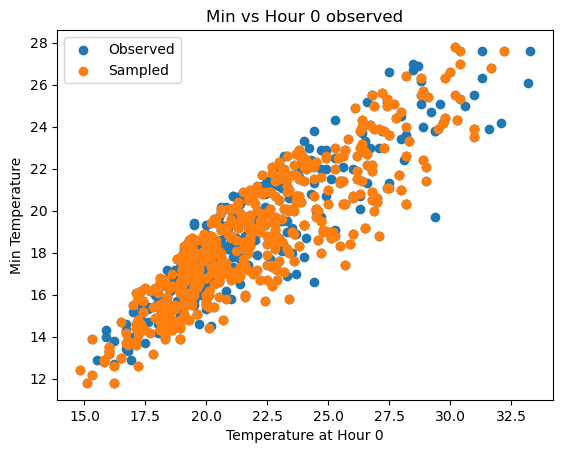

In [48]:
#Plot_Jan
Plot_Jan = Monthly_Split_Dic.get('Jan_0_Mn')
#Plot the scatter of temp and Min
plt.scatter(Plot_Jan['temp'],Plot_Jan['Min'])
plt.scatter(Example_Run['temp'],Example_Run['Min'])
plt.legend(['Observed','Sampled'])
plt.xlabel('Temperature at Hour 0')
plt.ylabel('Min Temperature')
plt.title('Min vs Hour 0 observed')



Overlaying the observed plot over the Sampled we can see thar in the extreme cases, about half of the observations were not selected (27.5>) therefore we expect when we regress this data and find the linear relationship to be different to the observed. It migfht not be by much but it will still be significnat enough to show in my temperature estimations. This will be done for all months and hours and for many trials to have that boostrapping uncertianity range.

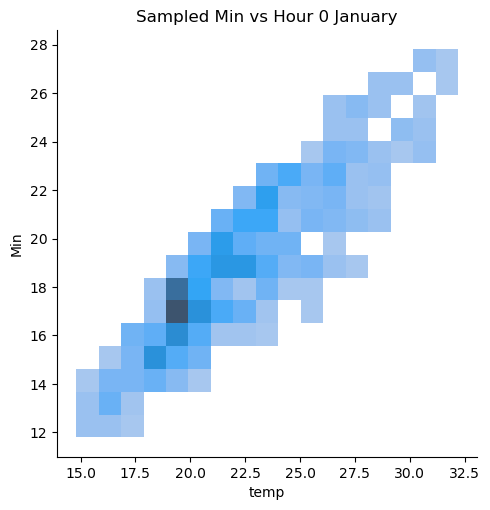

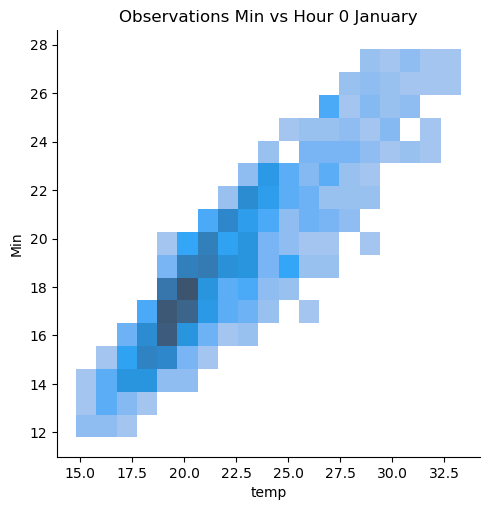

In [49]:
#Plot the distrbution
sns.displot(Example_Run, x="temp",y = 'Min').set(title='Sampled Min vs Hour 0 January')
sns.displot(Plot_Jan, x="temp",y = 'Min').set(title='Observations Min vs Hour 0 January')

In [50]:
Example_Run

,date,temp,Min
0,1988-01-17,23.0,18.7
1,1980-01-12,24.1,22.4
2,1974-01-07,23.7,22.7
3,1976-01-22,23.1,18.5
4,1970-01-08,19.9,17.6
...,...,...,...
708,1986-01-20,27.5,21.1
709,1990-01-20,23.3,21.2
710,1980-01-01,26.4,23.2
711,1976-01-25,28.0,21.0


To further solidy the evidience that it has been extracting these uniformly, we see that around 18C in the Min and 20C for the observation temp, we see the most dense values being extracted, however we see that the observations are more centralised around the Min/Temp of 18C/20C compared to the observations due to that chance that the observations sampled may have 2 or 3 values that have been chosen for this single trial.

(array([102.,  68.,  88.,  40.,  70.,  83.,  57.,  65.,  48.,  92.]),
 array([-1096. ,  -216.4,   663.2,  1542.8,  2422.4,  3302. ,  4181.6,
         5061.2,  5940.8,  6820.4,  7700. ]),
 <BarContainer object of 10 artists>)

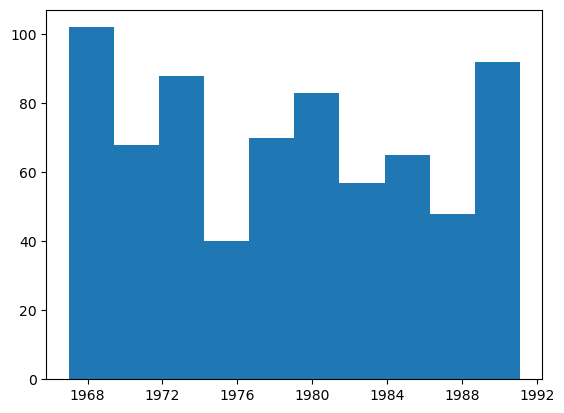

In [51]:
plt.hist(Example_Run['date'])

Overall we see that there is a slight uniform distribution and overtime after many attempts this will even out as a decent uniform disturbiton.

NOTE: This isnt the best way to display that distrubtion, I think the above does it well

Now applying this method for all the months.

In [52]:
#Create the dictionary that all the data will be inputed to
Samples = {}
Data = Monthly_Split_Dic
Trials = 1
#Get the entire key column
Keys = list(Data)

#Now extract the DataFrame from the dictionary for the Key
for keys_used in Keys:
    #Extract and drop NaNs
    Ind_DF = Data.get(keys_used).dropna()
    #Now sample by the length fo the DataFrame and this is done for the first run only 
    Run1_Data = Ind_DF.sample(n=int(len(Ind_DF)),replace=True)
    #Drop the date column with Index is 0 to Samples-1
    Run1_Data = Run1_Data.reset_index(drop = True)

    #Get the columns names
    Col = Run1_Data.columns

    #Now change column name to make it run 1 etc
    Run1_Data= Run1_Data.rename(columns={Col[0]:Col[0] + ' ' +  'Run 1'})
    Run_Data= Run1_Data.rename(columns={Col[1]:Col[1] + ' ' +  'Run 1'})

    #Now develope the for loop but the trials is based off the lenght of Data
    for rns in range(2,Trials+1):
        #This is the now the random sampling for 1000 different samples of 600 
        Individual_Run = Ind_DF.sample(n=int(len(Ind_DF)),replace=True)
        #Drop the date column
        Individual_Run = Individual_Run.reset_index(drop = True)

        #Get the columns names
        Col = Individual_Run.columns

        #Now change column name to make it run 1 etc
        Individual_Run= Individual_Run.rename(columns={Col[0]:Col[0] + ' ' +  'Run {}'.format(rns)})
        Individual_Run= Individual_Run.rename(columns={Col[1]:Col[1] + ' ' +  'Run {}'.format(rns)})

        #Concate with RUNS
        Run_Data = pd.concat([Run_Data, Individual_Run],axis=1)

    #Now add this to a new dictionary
    Samples[keys_used + "_" + "Samp"] = Run_Data
Samples

{'Jan_0_Mx_Samp':      temp Run 1  Max Run 1
 0          26.3       37.0
 1          23.5       33.0
 2          23.7       37.4
 3          20.2       27.8
 4          19.0       24.3
 ..          ...        ...
 708        18.3       24.9
 709        17.2       24.5
 710        19.2       22.5
 711        29.6       42.3
 712        23.7       31.6
 
 [713 rows x 2 columns],
 'Jan_0_Mn_Samp':      temp Run 1  Min Run 1
 0          26.5       19.2
 1          18.3       15.1
 2          20.0       17.8
 3          20.0       16.0
 4          20.3       17.4
 ..          ...        ...
 708        23.3       21.2
 709        19.4       16.0
 710        21.1       19.8
 711        24.5       20.1
 712        25.0       20.3
 
 [713 rows x 2 columns],
 'Feb_0_Mx_Samp':      temp Run 1  Max Run 1
 0          24.7       33.7
 1          26.1       34.3
 2          20.7       29.1
 3          22.5       28.0
 4          21.5       29.3
 ..          ...        ...
 644        18.2       26.0

Now with the samples for the trials finalised we can move onto applying the linear regression.

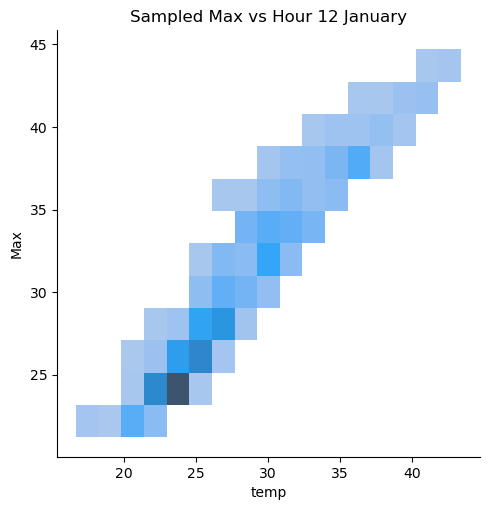

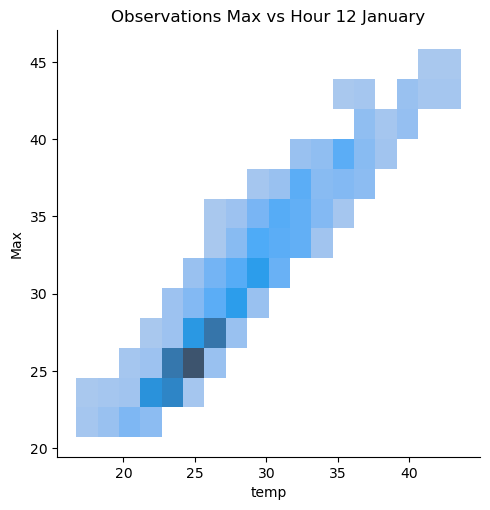

In [53]:
#JUST FOR BLAIR
#Our exmaple case
Plot_Jan = Monthly_Split_Dic.get('Jan_12_Mx')

Example_Resample_Case = Monthly_Split_Dic.get('Jan_12_Mx').dropna()
Example_Resample_Case
#Now sample by the length fo the DataFrame and this is done for the first run only 
Example_Run = Example_Resample_Case.reset_index().sample(n=int(len(Example_Resample_Case)),replace=True)
#Drop the date column with Index is 0 to Samples-1
Example_Run = Example_Run.reset_index(drop = True)
Example_Run
#Plot the distrbution
sns.displot(Example_Run, x="temp",y = 'Max',legend=True,).set(title='Sampled Max vs Hour 12 January')
sns.displot(Plot_Jan, x="temp",y = 'Max',legend=True,).set(title='Observations Max vs Hour 12 January')


## 2.6 The Linear Regression

This is the part where I will begin to estimate my Max and Min temperatures. It is first computed by a linear equation off all the sampled trials for each of the months for every hour. With whatever avalaible hourly data we did have we are able to create the linear regression plots and their correlation with the max and min in this step. What this essentially will do is have a complex system of linear equations that are able to be sorted by their correlations in order to choose the best temperature for that specific day. As we know from earlier, the Minimum Temperautre and Maximum temperature is based on the standards where the Minimum can be anywhere from 10am the previousday to 10am on the day in focus and the maximum is from 9am the day in focus to 9am the next day. But since all this data correction has been completed we do not need to change any data.

The reason why this was the most effective option...

Lets go through a test run of a single dataset and show you how the calculation will work:

In [54]:
TEST26 = Samples.get('Jan_12_Mx_Samp')
TEST26

,temp Run 1,Max Run 1
0,23.9,25.3
1,27.0,27.9
2,23.2,24.2
3,29.8,36.2
4,25.8,29.7
...,...,...
708,24.5,25.6
709,25.5,26.1
710,25.5,30.6
711,23.6,24.0


What we notice in this is from chapter 2.5 we are using many trials, therefore in this function we use the trials but also we know the column names of each of the trials. This ensures when we doing the linear regression and correlation we look at the trials run number as well for that month

In [55]:
# Linear_Regression Explained in 2.6.1
def linear_regression_polyfit(x,y):
    #Find the linear Relationship
    A, B = np.polyfit(x, y, 1)
    #Find the correlation                  
    corr, _ = spearmanr(x, y, nan_policy = 'omit')
    return(A,B,corr)

#Get the linear formula and the correlation of the data
AMn, BMn, corrMn = linear_regression_polyfit(TEST26['temp Run 1'],TEST26['Max Run 1'])
print('{} * Obs_Temperature + {}, Correlation = {}'.format(round(AMn,3), round(BMn,3), round(corrMn,3)))


1.077 * Obs_Temperature + 0.1, Correlation = 0.957


What we see is that for every degree increase in the observed temperature, the Minimum temperature is a facotr of 0.796 with the addition to 1.343 degrees to that observed temperature. So what we expect is that the temperature should be warmer then the minimum temperature. We can also plot this on the histogram

Text(0.5, 1.0, 'Max vs Hour 12 observed')

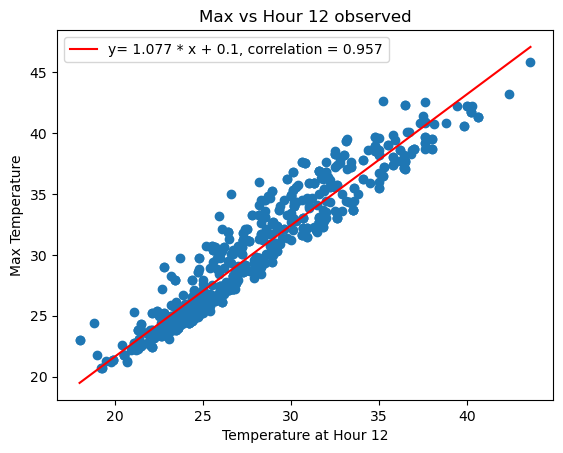

In [56]:
#PLOT
plt.scatter(TEST26['temp Run 1'],TEST26['Max Run 1'])
plt.legend(['Sampled'])
x = np.linspace(TEST26['temp Run 1'].min(),TEST26['temp Run 1'].max(),200)
y = AMn * x + BMn
plt.plot(x, y, '-r', label='y= {} * x + {}, correlation = {}'.format(round(AMn,3), round(BMn,3), round(corrMn,3)))

plt.xlabel('Temperature at Hour 12')
plt.ylabel('Max Temperature')
plt.legend()
plt.title('Max vs Hour 12 observed')

What we see is that the most probable temperature should be going through this linear line. Sure that we expect that overall as the minimum increases the observation is also warmer and we can see that they are quite closely correlated, which under the default rng is 0.899. I will be doing this for all months and all hours to show

This will look different to the function I do use as this will have a plotting function here to showcase all the months and hours and their regressions and correlations

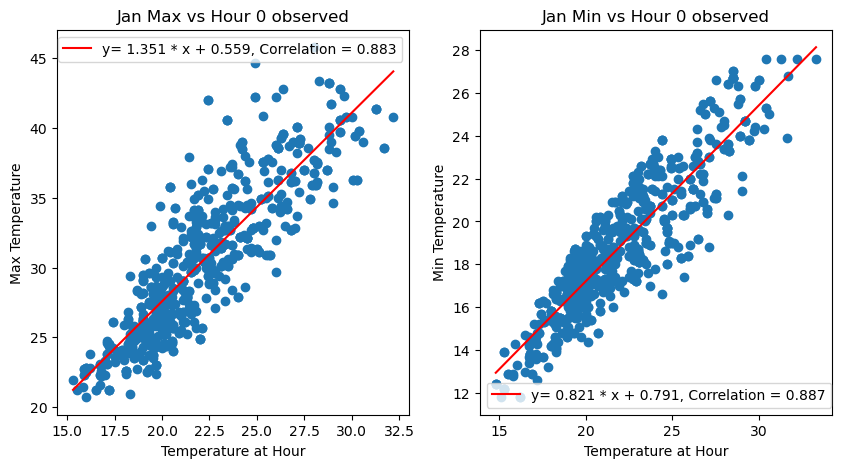

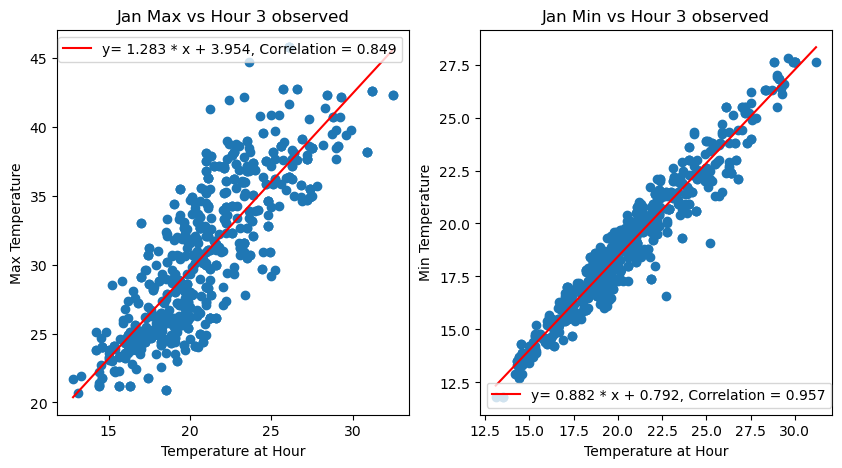

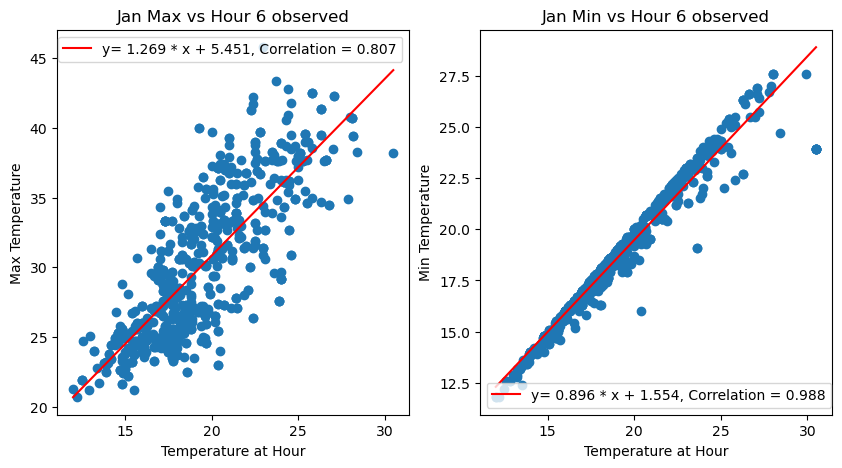

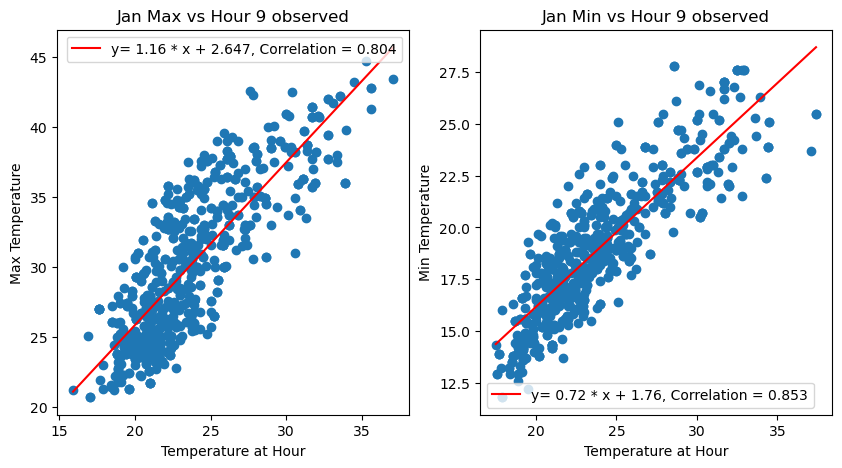

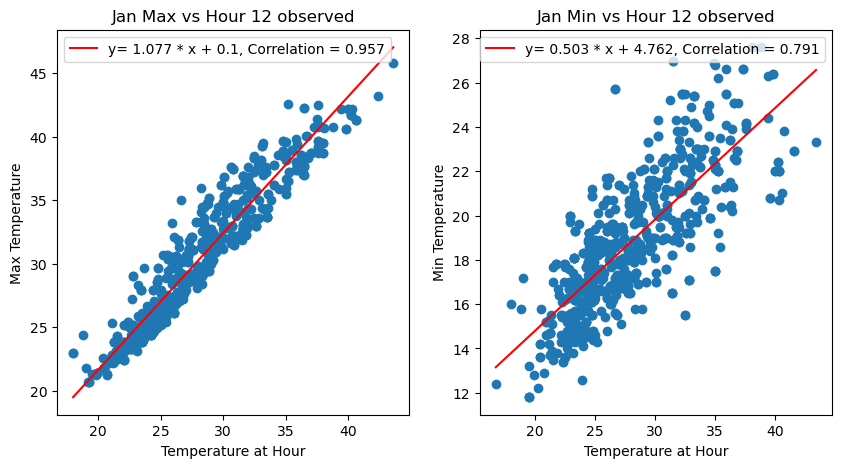

...

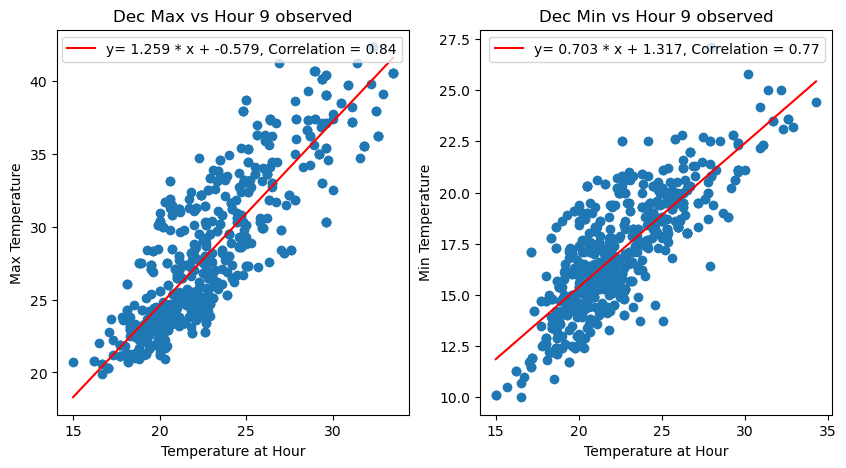

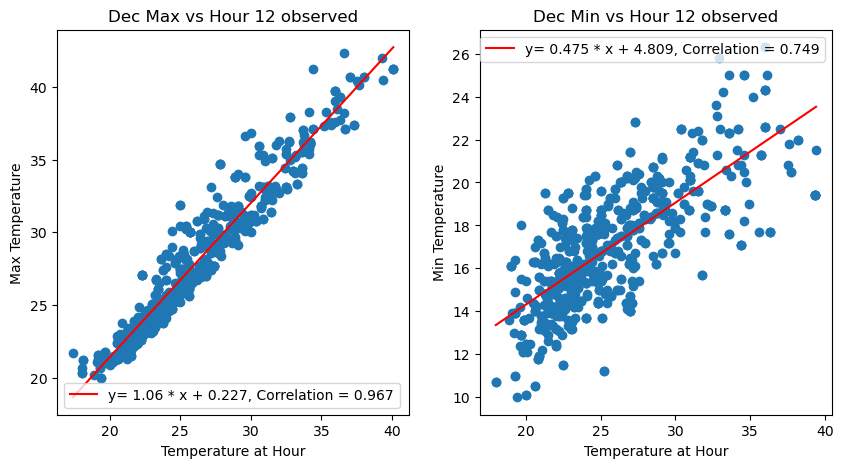

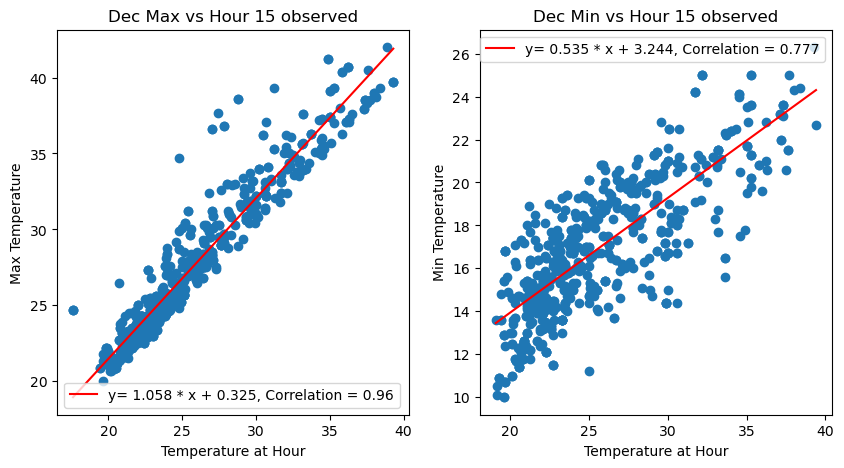

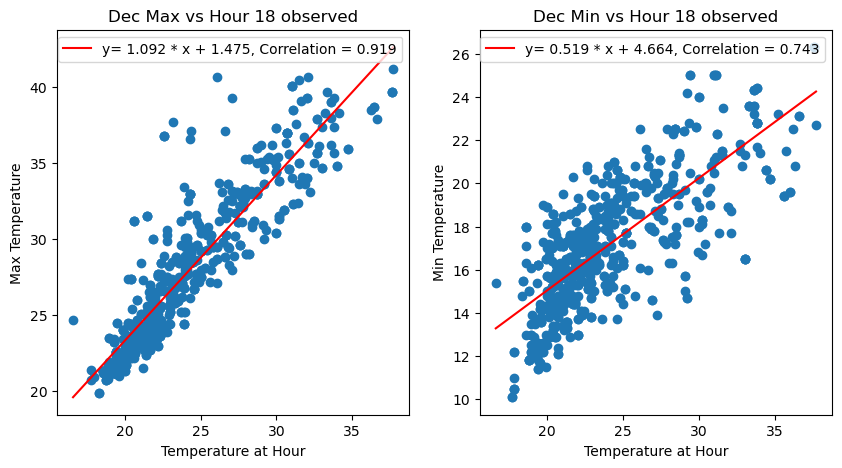

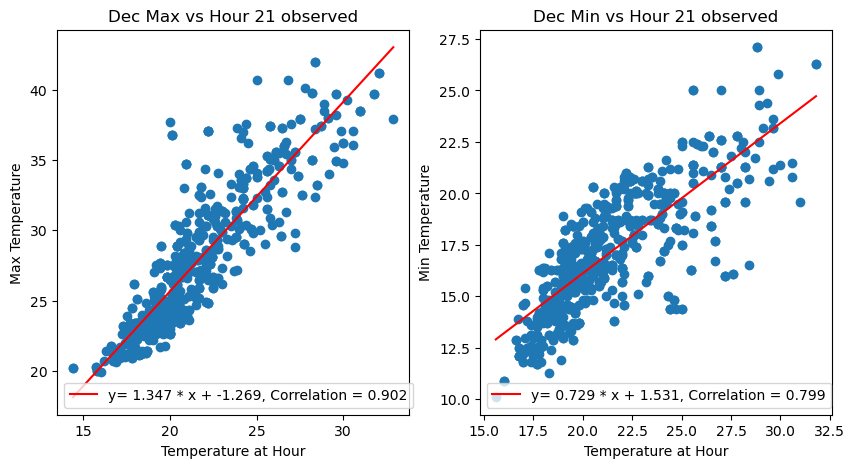

In [57]:
Data = Samples
Trials = 1
hours = [0,3,6,9,12,15,18,21]
#Create dictionaries
Regressed_Trial = {}
lengthKeys = len(list(Data))


#Define the month names
Month_Name = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

#Being the for loop by extracting the month name
for month_num in range(0,12):
    #Extract the month name_
    Month_Str =  Month_Name[month_num]
    #This is useful in the key as it is Aug_9_Mn_Samp where month_hour_mx/mn_samp
    #Now using the trials lets extract the trials within the particular dictionary
    for trial_number in range(1,Trials+1):
        #Now this is all the arrays that will be appended to at the end that include the linear
        #regression line components, A and B and the Correlation by the Pearsonr
        AMx_Total = []
        BMx_Total = []
        CORRMx_Total = []
        Time = []
        AMn_Total = []
        BMn_Total = []
        CORRMn_Total = []
        #Now for loop to extract the data and get the regression
        for i in hours:
            #---MAX---#
            #Extract the maximum data
            Mxt = Data.get('{}_{}_Mx_Samp'.format(Month_Str,i))
            #Get the linear formula and the correlation of the data
            AMx, BMx, corrMx = linear_regression_polyfit(Mxt['temp Run {}'.format(trial_number)],Mxt['Max Run {}'.format(trial_number)])
            #Append it all
            AMx_Total.append(AMx)
            BMx_Total.append(BMx)
            CORRMx_Total.append(corrMx)
            #Repeat for min
            #---MIN---#
            Mnt = Data.get('{}_{}_Mn_Samp'.format(Month_Str,i))
            AMn, BMn, corrMn = linear_regression_polyfit(Mnt['temp Run {}'.format(trial_number)],Mnt['Min Run {}'.format(trial_number)])
            Time.append(int(i)) 
            AMn_Total.append(AMn)
            BMn_Total.append(BMn)
            CORRMn_Total.append(corrMn)
            
            fig, ax = plt.subplots(nrows=1, ncols=2,figsize = (10,5))
            ax[0].scatter(Mxt['temp Run 1'],Mxt['Max Run 1'])
            x = np.linspace(Mxt['temp Run 1'].min(),Mxt['temp Run 1'].max(),200)
            y = AMx * x + BMx
            ax[0].plot(x, y, '-r', label='y= {} * x + {}, Correlation = {}'.format(round(AMx,3), round(BMx,3), round(corrMx,3)))
            ax[0].set_xlabel('Temperature at Hour')
            ax[0].set_ylabel('Max Temperature')
            ax[0].legend()
            ax[0].set_title('{} Max vs Hour {} observed'.format(Month_Str,i))

            ax[1].scatter(Mnt['temp Run 1'],Mnt['Min Run 1'])
            x = np.linspace(Mnt['temp Run 1'].min(),Mnt['temp Run 1'].max(),200)
            y = AMn * x + BMn
            ax[1].plot(x, y, '-r', label='y= {} * x + {}, Correlation = {}'.format(round(AMn,3), round(BMn,3), round(corrMn,3)))
            ax[1].set_xlabel('Temperature at Hour')
            ax[1].set_ylabel('Min Temperature')
            ax[1].legend()
            ax[1].set_title('{} Min vs Hour {} observed'.format(Month_Str,i))
        
        #Add it all into a dataframe
        Time = pd.Series(Time,name = 'Hours')
        AMX = pd.Series(AMx_Total,name = 'A')
        BMX = pd.Series(BMx_Total,name = 'B')
        corrMX = pd.Series(CORRMx_Total,name = 'Correlation')
        ItemsMX = pd.concat([Time,AMX,BMX,corrMX],axis = 1)

        AMN = pd.Series(AMn_Total,name = 'A')
        BMN = pd.Series(BMn_Total,name = 'B')
        corrMN = pd.Series(CORRMn_Total,name = 'Correlation')
        ItemsMN = pd.concat([Time,AMN,BMN,corrMN],axis = 1)
        

        Regressed_Trial["{}".format(Month_Str) + "_" + 'Trial'+ "_" + str(trial_number) + "_" + "Mx"] = ItemsMX
        Regressed_Trial["{}".format(Month_Str) + "_" + 'Trial'+ "_" + str(trial_number) + "_" + "Mn"] = ItemsMN

In [58]:
Regressed_Trial.get('Jan_Trial_1_Mx')

,Hours,A,B,Correlation
0,0,1.351130,0.559134,0.882785
1,3,1.282951,3.954363,0.849110
2,6,1.268994,5.450928,0.807006
3,9,1.160488,2.647481,0.803674
4,12,1.077001,0.100370,0.957100
5,15,1.002601,1.858267,0.964819
6,18,1.100254,1.202685,0.929508
7,21,1.282260,0.019800,0.913513


What we see for an individual month and hour and extreme, is that the first column is the index, the second column is the Hours and the third and fourth column are the linear equation components wirth the final columsn being the Correlation. What we notice is that in Jan the correlation between the Max and the observations happens at around the 12pm to 3pm point, therefore we expect the maximum temperature to most likely occur in this time peirod with 6pm being the third best option. Since the historical data mostly has 9am, 10am, 3pm and 4pm observations, the most likely choice that estimation will come from will be from around 3pm temeprature if the morning and afternoon temperatures are both present. Although it is possible to non-linearly create a way to estimate temperatures, within the timeframe of my masters research it was not possible for me to acheiev this and so this was our best guess for the limited time. Would I like to continue updating this code so it makes it more predictable wit the maximum temperature, I would indeed as there are many flaws with this method.


In [59]:
Regressed_Trial.get('Aug_Trial_1_Mn')

,Hours,A,B,Correlation
0,0,0.929872,-1.721721,0.883861
1,3,0.867795,-0.149951,0.934101
2,6,0.826396,0.896910,0.957456
3,9,0.919406,-2.146649,0.844353
4,12,0.659964,-1.352763,0.551812
5,15,0.491636,1.235825,0.446372
6,18,0.783892,-2.529323,0.608644
7,21,0.982595,-3.701132,0.783809


What we see in the minimum for august is a high correlation up and until 6am and a big drop off at 9am as this would be due to the previous day. HOWEVER if I do decide to take on 10am to 9am, this will have an increased correaltion at the 9am and maybe a better estimate of the minimum temperature for that day then the 9am temperature for the day beforehand. This is yet to be fully decided.

### 2.6.1 Fitting the linear relationship

This is the underlying mechanism behind the regression line. It is useful to note that this equation could also be tweaked in order to best fit the data, so you could essentially change it to fit a non-linear line as we know that in the extreme cases the best fit does not hold as well. We could also impose more complicated checks that may best fit the data liek insetad of correlation we use the RMSE or covariance of the data. The reason why I have elected to choose not only the linear relationship but using the correlation, is because firstly the linear relationsip does hold for most of the monthly datasets as we have been show in the above graphs but also it is the simplest form of regression that can be easily understood by everyone, public or researchers. Now as we go into the correlation, I have decided to choose the correlation as, yes it is also the easiest to undertsand as the Min (y) can be explained by the (x) using the correlation. Furthermore, the more psoitive it becomes the more the indenpent vairable explians the depenedent vairable in a positve direction, so an increase in x leads to an increase in y. Now if it wewre to be negative it would mean the opposite where increase in x leads to a decrease in y. When the correlation becomes non-signifincant then the value can be between -0.2 and 0.2. And classed as strongly correlated when its above 0.7.

Now explaining the choices of the functions within this function used for the statistical regression.

In [60]:
from sklearn.linear_model import LinearRegression

TEST261 = Data.get('Jan_0_Mx_Samp')
TEST261
x1 = TEST261['temp Run 1'].to_numpy().reshape(-1, 1)
y1= TEST261['Max Run 1'].to_numpy()


#I want to compare the polyfit to the linear regression and see which does better
model = LinearRegression()
model.fit(x1, y1)
r_sq = model.score(x1, y1)

print(f"coefficient of determination: {r_sq}")
print(f"intercept: {model.intercept_}")
print(f"slope: {model.coef_}")


x = TEST261['temp Run 1']
y= TEST261['Max Run 1']

#Find the linear Relationship
A, B = np.polyfit(x, y, 1)
#Find the correlation                  
corr, _ = spearmanr(x, y, nan_policy = 'omit')

print(A,B,corr**2)

#Using a shorter version of the code we can determine that the linear regression function is the same as the 
#polyfit

coefficient of determination: 0.756695090940305
intercept: 0.5591335515949538
slope: [1.35112988]
1.351129884882983 0.5591335515949682 0.779308859208423


What we see above is two different fiunctions producing the same set of results. We noticed that overall the speed of which the polyfit function would possibly be faster as it does not require transposing the array or covnerting the data to an array before best fitting to the model. Therefore since we are trying to find a linear i e with A and B, the polyfit function works just as well as the LinearRegression function with a super slight devation 10 decimals down the road therefore I beleiev the polyfit function it an apprpriate method to use in this case.


Now onto the correlation and the covariance, we know that in order to explore whether the variance of Y can be expalined by X we can sqaure the correlation but overall both would work just as well as determining out of the subdaily temperatures which is the subdaily temperature that can explain the max or min the best.

There are several different ways to compute the correlation, these are the pearson, spearmana nd kendall tau correlation functions, they all acy to identify how well the data fits but they are different in their own ways and what you want to acheive out of the results. the first of which is the pearsons r correlation function which is identifying the relationship between the linearly related variables which we know from the graphs is the case. It assumes the variables are normally distributed including linearity and is equally distributed around the regression line.

The Kendall Rank Correlation measures the strength of dependence between twovariables, therefore if the cooler min depneds on a cooler hour 3am temperature then returns a value of 0 where theres no relationship to 1 if there is a relationship and when it is negative you can just remove as it doesnt mean much. The advanatges is that it has better statistical properties for ordinal data.
https://www.statisticshowto.com/kendalls-tau/#:~:text=Kendall's%20Tau%20is%20a%20non,1%20is%20a%20perfect%20relationship.

https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/kendalls-tau-and-spearmans-rank-correlation-coefficient/
https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/correlation-pearson-kendall-spearman/


5he spearman rnak correlation is in a way similar to the Kendall Rnak with its statistics also an advantages is that it does not assume the distrubtion of the data which is appropiate for at least ordinal data.

Now that wer do undertsand the mechanisms behind the three, we can plot a histogram of the data and indentify whteher it is normally distriubted or not. 

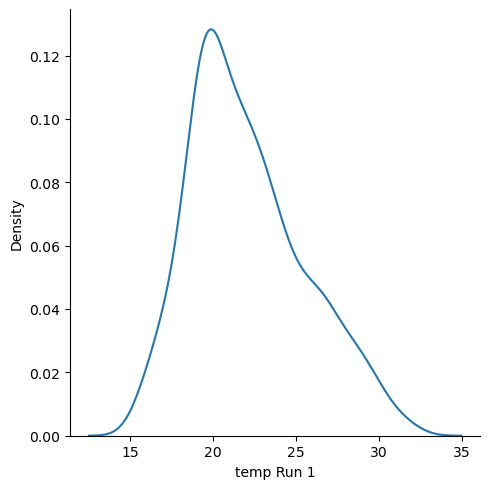

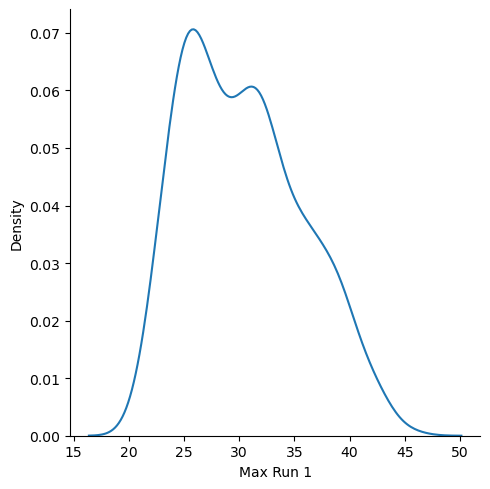

In [61]:
sns.displot(x, kind='kde')
sns.displot(y, kind='kde')

In [62]:
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
from scipy.stats import skew
from scipy.stats import kurtosis
print(skew(x),kurtosis(x))
print(skew(y),kurtosis(y))


0.5842472083860114 -0.27197388655277255
0.41635547079028207 -0.6880058723997182


WHat we see is that the datasets are far from normal with both being singificnatly skewed with a siginficnat kurotisis. this means we cannot assume that the data is normally distributed which for the pearsons r case is what needs to be assumed. We know that there are possible cases where the normal distribtuion may hold, but since that is not the case we will have to remove the possibility that the peasron r correaltion is the ebst case for this. Therefore since the spearman rank does not assume any sort of the normality in the distrbution we can push forward with using this value imstead. Also we will dispaly the difference between the two values below. 

In [63]:
corrp, _ = pearsonr(x, y)
corrs, _ = spearmanr(x, y, nan_policy = 'omit')
corrk, _ = kendalltau(x, y,nan_policy = 'omit', method = 'auto')
print('Pearson = {}'.format(corrp))
print('Spearman = {}'.format(corrs))
print('Kendall = {}'.format(corrk))





Pearson = 0.869882228201212
Spearman = 0.8827847184950717
Kendall = 0.7012029678560879


As we know from above, peasrons r is from -1 to 1 whcih determines the strength assuming the distrbution is normal, spearman is from 0 to 1 which determines the best fit for the graph assuming not knowledghe of the distrbution and Kendall is similar to spearman in how they are defined but there is a major differecne in how they work out the correlation.

From how the data in my research is based off the best correlated value, now I understand that the person r correlation may not be the best, what happens if the correlation was negative, but hgihky correlated. Well that just wpuld be overlooked in how my data is defined, But then again when squared it becomes positive and represents how much does the varaince best fit the two variables.

Overall since the data is non-normal I will have to resort to using the spearman r correlation moving forward.

coeffiencet of determinet of the rank

## 2.7 Sub Data Shifty For Data for the Estimation to Be Applied on

''' Just some background on this matter. Now we have the Subdaily temperature for the estimation, we have the multilinear regression for every month to be used on this temperature now to put it all togetjer and estimation the max and min for the times at each day.

What we know os that the regression analysis works with the Max and Min differently. This means that the Max and Min do NOT use the same times as a normal person would percieve. In my function we have worked out that the correlation of 12pm-1 to 6pm-1 is better for the mininum on the day in foucs then 12m+0 t 6pm+0. Therefore when estimating our minimum on the day in focus we have to start from the previous day after and not including 9am and go to the day in focus at 9am. So to get this part of the function will require some work.

For the Max we will go with the BOM standard whihc starts at 9am of the day in focus to 9am not included the next day.

Now what has hjappend is that the regression analysis already matches these values, therefore if I was to find the minimum from a 12pm temperature, I would have to use the day befores 12pm temperature to estimate it.

With all this information, I hope you understand how this function will work coming up and for myslef I hope to bring this RMSE down from 1.17 for max and min when comparing to the histroical of the Perth Regional Office from 1942 to 1992 lower for the simple variation of the code and hopefully even lower when I apply the more complex version of the code. '''

In [64]:
Dataset_Subdaily.loc[500:512]

,date,temp,Closest Hour
500,1942-05-10 12:00:00,16.8,12
501,1942-05-10 15:00:00,19.6,15
502,1942-05-11 00:00:00,11.7,0
503,1942-05-11 03:00:00,9.4,3
504,1942-05-11 06:00:00,9.4,6
505,1942-05-11 09:00:00,15.2,9
506,1942-05-11 12:00:00,17.7,12
507,1942-05-11 15:00:00,20.0,15
508,1942-05-12 00:00:00,13.2,0
509,1942-05-12 03:00:00,11.7,3


Since we shifted the data based on the how the Max and Minimum daily temperatures are found. It seems fitting that we must shift our subdaily data we are trying to esitmate the Max and Min temperature on also. It wouldnt make sense for the minimum of 15pm from the day before regression estimation to be applied onto the the 3pm tem perature of the day in focus. This would not match the minimum estimation therefore we must take caution into what we do here. Since in chapter 2.1 we have deifned what times the values will be taken from, we can use that to also then shift our sub daily data we are esitmating the tmax and tmin on so that it aligns with the trained data and does not cause any disapairities in the estimation.

In [65]:
TEST_SUBJECT_FOR27 = Dataset_Subdaily.copy()
TEST_SUBJECT_FOR27.loc[500:512]

,date,temp,Closest Hour
500,1942-05-10 12:00:00,16.8,12
501,1942-05-10 15:00:00,19.6,15
502,1942-05-11 00:00:00,11.7,0
503,1942-05-11 03:00:00,9.4,3
504,1942-05-11 06:00:00,9.4,6
505,1942-05-11 09:00:00,15.2,9
506,1942-05-11 12:00:00,17.7,12
507,1942-05-11 15:00:00,20.0,15
508,1942-05-12 00:00:00,13.2,0
509,1942-05-12 03:00:00,11.7,3


In [66]:
#The data from Chapter 2.4 which was the last time we used it.
TEST27 = TEST_SUBJECT_FOR27.copy()
TEST27.loc[500:512]

,date,temp,Closest Hour
500,1942-05-10 12:00:00,16.8,12
501,1942-05-10 15:00:00,19.6,15
502,1942-05-11 00:00:00,11.7,0
503,1942-05-11 03:00:00,9.4,3
504,1942-05-11 06:00:00,9.4,6
505,1942-05-11 09:00:00,15.2,9
506,1942-05-11 12:00:00,17.7,12
507,1942-05-11 15:00:00,20.0,15
508,1942-05-12 00:00:00,13.2,0
509,1942-05-12 03:00:00,11.7,3


We are going to apply this onto the max for the test.

In [67]:
#Get the estimation sorted
# Shift hours 0 to 8 to the previous day's hours for maximum regression of 9am+0 to 8am+1
TEST27['date'] = pd.to_datetime(TEST27['date'])
TEST27.loc[TEST27['date'].dt.hour < 9, 'date'] = TEST27['date'] - pd.offsets.Day(1)
TEST27.loc[500:512]

,date,temp,Closest Hour
500,1942-05-10 12:00:00,16.8,12
501,1942-05-10 15:00:00,19.6,15
502,1942-05-10 00:00:00,11.7,0
503,1942-05-10 03:00:00,9.4,3
504,1942-05-10 06:00:00,9.4,6
505,1942-05-11 09:00:00,15.2,9
506,1942-05-11 12:00:00,17.7,12
507,1942-05-11 15:00:00,20.0,15
508,1942-05-11 00:00:00,13.2,0
509,1942-05-11 03:00:00,11.7,3


So from the TEST27 and Dataset_Subdaily, we can see that when we shift the data, we are shifting all the hours that ARE less than 9am and offsetting it by 1 day backwards. We know in the training data, we shifted the hours back one, so the 0am to 8:59am data was used in the calculation for the previous day, therefore in this function this does exactly that, where using the index as reference, index 502 to 504 have been shifted to the previous day, this is done because when I apply my function in Chapter 9, no shifting is needed and when I extract a partilular day and its linear regression models, the data in here matches up with the trained data. If you need to undertsand how this lines up, reread chapter 2.1 for reference.

In [68]:
# Reorder the data so that the closest hour with the lowest number is first
TEST27 = TEST27.sort_values(['date', 'Closest Hour'])
TEST27 = TEST27.reset_index(drop=True)
TEST27.loc[500:512]

,date,temp,Closest Hour
500,1942-05-10 03:00:00,9.4,3
501,1942-05-10 06:00:00,9.4,6
502,1942-05-10 09:00:00,12.3,9
503,1942-05-10 12:00:00,16.8,12
504,1942-05-10 15:00:00,19.6,15
505,1942-05-11 00:00:00,13.2,0
506,1942-05-11 03:00:00,11.7,3
507,1942-05-11 06:00:00,12.2,6
508,1942-05-11 09:00:00,15.2,9
509,1942-05-11 12:00:00,17.7,12


I think I found the problem, when I rerange back, I was expecting that the entire row is reraanged, so it better. THIS says otherwise, it seems to order them back in the same way as the Dataset_Subdaily which means its wrong and that the estimation is going to be off. So I think its best to leave it alone and dont do reranging and wait utnil the extraction.

1
​

In [69]:
#Get the estimation sorted
Max_For_Est = TEST_SUBJECT_FOR27.copy()
Min_For_Est = TEST_SUBJECT_FOR27.copy()


# Shift hours 0 to 8 to the previous day's hours for maximum regression of 9am+0 to 8am+1
Max_For_Est['date'] = pd.to_datetime(Max_For_Est['date'])
Max_For_Est.loc[Max_For_Est['date'].dt.hour < 9, 'date'] = Max_For_Est['date'] - pd.offsets.Day(1)
Max_For_Est['date'] = Max_For_Est['date'].dt.strftime('%Y-%m-%d %H:%M:%S')



# Shift hours 10 to 23 to the tomorrows day's hours for minimum regression of 10am-1 to 9am+1
Min_For_Est['date'] = pd.to_datetime(Min_For_Est['date'])
Min_For_Est.loc[Min_For_Est['date'].dt.hour > 9, 'date'] = Min_For_Est['date'] + pd.offsets.Day(1)
Min_For_Est['date'] = Min_For_Est['date'].dt.strftime('%Y-%m-%d %H:%M:%S')


In [70]:
Max_For_Est.loc[500:512]

,date,temp,Closest Hour
500,1942-05-10 12:00:00,16.8,12
501,1942-05-10 15:00:00,19.6,15
502,1942-05-10 00:00:00,11.7,0
503,1942-05-10 03:00:00,9.4,3
504,1942-05-10 06:00:00,9.4,6
505,1942-05-11 09:00:00,15.2,9
506,1942-05-11 12:00:00,17.7,12
507,1942-05-11 15:00:00,20.0,15
508,1942-05-11 00:00:00,13.2,0
509,1942-05-11 03:00:00,11.7,3


In [71]:
Min_For_Est.loc[500:512]

,date,temp,Closest Hour
500,1942-05-11 12:00:00,16.8,12
501,1942-05-11 15:00:00,19.6,15
502,1942-05-11 00:00:00,11.7,0
503,1942-05-11 03:00:00,9.4,3
504,1942-05-11 06:00:00,9.4,6
505,1942-05-11 09:00:00,15.2,9
506,1942-05-12 12:00:00,17.7,12
507,1942-05-12 15:00:00,20.0,15
508,1942-05-12 00:00:00,13.2,0
509,1942-05-12 03:00:00,11.7,3


In [72]:
Dataset_Subdaily.loc[500:512]

,date,temp,Closest Hour
500,1942-05-10 12:00:00,16.8,12
501,1942-05-10 15:00:00,19.6,15
502,1942-05-11 00:00:00,11.7,0
503,1942-05-11 03:00:00,9.4,3
504,1942-05-11 06:00:00,9.4,6
505,1942-05-11 09:00:00,15.2,9
506,1942-05-11 12:00:00,17.7,12
507,1942-05-11 15:00:00,20.0,15
508,1942-05-12 00:00:00,13.2,0
509,1942-05-12 03:00:00,11.7,3


Overall, the data is shifted in accordance to the shift in Chapter 2.1 to get the most accurate results. and in  line with the trained dataset

## 2.8 Estimating Tmax and Tmin for all subdaily times

Now we are onto the final stages of the estimation code,this part combines all my datasets I ahve created, the trials I have conducted into one single function here which will then spit out a semi final product. This possubly could estimate the max and min temperatures as well if you averaged the data out by correlation weight and computed the final product this way??:????? Anyhow, for each of the day we have a number of subdaily temperatures ranging from a single esitmation to 8 times in the day or even more, which I have not implemented yet but will need to. This function aims to go thorugh each of the different Max and Mins for the estimation case and used the trained rtegression model to esitmate the tmax and tmin for each day, each hour, each month and each trial.

I HAVENT CONSIDERED SUBDAILY TEMPS RECORDED AT LIKE 8AM 9AM AND 10AM in this incase theres is the same closest hour for 3??? that is a check I need to do, always 9am first, then 10am for Max and 8am for Min

In [73]:
#To apply for 2.8 explained in 2.8.1
def The_Estimator(MONTH, Hour, Temp, DATA_4_EST, Trial_Number, Max):
    Month_Name = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
    
    
    if (Max == True):
        #Estimate the Max Temp
        #Extract data from the linear regression dictionary
        Info = DATA_4_EST.get('{}_Trial_{}_Mx'.format(Month_Name[MONTH-1],Trial_Number))
        Info = Info.set_index('Hours')
        Info = Info.loc[int(Hour)]
        #Estimate the Max based off this information
        Est_Max = Info['A']*Temp + (Info['B'])
        #Find the Corr for this day and hour
        Corr_Max =  Info['Correlation']
        return(Est_Max,Corr_Max)
    else:
        #Estimate the Min Temp
        #Extract data from the linear regression dictionary
        Info = DATA_4_EST.get('{}_Trial_{}_Mn'.format(Month_Name[MONTH-1],Trial_Number))
        Info = Info.set_index('Hours')
        Info = Info.loc[int(Hour)]        #Estimate the Max based off this information
        Est_Min = Info['A']*Temp + (Info['B'])
        #Find the Corr for this day and hour
        Corr_Min =  Info['Correlation']
        return(Est_Min,Corr_Min)
    
#These are the three dataset that will be used
Max_Dataset = Max_For_Est.copy()
Min_Dataset = Min_For_Est.copy()
Linear_Model = Regressed_Trial.copy()    

#Using the Max as the test
Test28 = Max_Dataset.copy()
Test28

  

,date,temp,Closest Hour
0,1942-01-01 09:00:00,23.0,9
1,1942-01-01 15:00:00,26.4,15
2,1942-01-01 21:00:00,21.9,21
3,1942-01-02 09:00:00,24.1,9
4,1942-01-02 15:00:00,25.6,15
...,...,...,...
134523,1992-04-28 09:00:00,18.0,9
134524,1992-04-28 15:00:00,22.7,15
134525,1992-04-29 09:00:00,19.6,9
134526,1992-04-29 15:00:00,23.0,15


So from chapters 2.6 and 2.7 we have all the necessary data to estimate the maximums from subdaily temperatures or the possible maximums, this will go through individual rows and estimate the max

In [74]:
Historical_Max_Col = Test28.columns

Historical_Max_Col

Index(['date', 'temp', 'Closest Hour'], dtype='object')

Now there is a double for loop, the first for loop runs thorugh each trial while the second more inner for loop then goes through the index of eacg row and estimates the Maximum temperature and its associated correlation. We will use index of 5600 for the example in this case.

In [75]:
Day_Data_Max = Test28.loc[5600]
Day_Data_Max

date            1944-05-25 18:00:00
temp                           13.9
Closest Hour                     18
Name: 5600, dtype: object

In [76]:
#Extract these values : closest hour, month, temp
Month_V_Max = datetime.strptime(Day_Data_Max[Historical_Max_Col[0]], '%Y-%m-%d %H:%M:%S').month
Hour_Max = Day_Data_Max[Historical_Max_Col[2]]
Temperature_Max = Day_Data_Max[Historical_Max_Col[1]]
print('Month: {}, Hour: {}, Temperature:  {}C'.format(Month_V_Max,Hour_Max,Temperature_Max))

Month: 5, Hour: 18, Temperature:  13.9C


Now we have isolate the month, hour and temperature from the individual rows we can gthen apply the linear regression based on the Month and Hour using the observed temperature for the Max (Min) linear model. For this case we are applying the linear model to the max temperature. In the function spoken aboput in Chapter 2.8.1

In [77]:
#Now we begin with the final dictionary
#Write a all data didctionary
All_Data_Est = {}
# data 
Historical_Max= Max_Dataset
Historical_Min = Min_Dataset
Linear = Linear_Model
T = 1

#Columns for data 
Historical_Max_Col = Max_Dataset.columns
Historical_Min_Col = Min_Dataset.columns

#Lets begin with the for loop for the trials of the linear
for T in range(1,Trials+1):
    #Set all the arrays for the information to be added into it
    Est_Max = []
    Est_Min = []
    Max_Corr = []
    Min_Corr = []


    #Now lets begin with Mx
    for indexed in range(len(Historical_Max)):
        #Extract the initial data
        Day_Data_Max = Historical_Max.loc[indexed]



        #Extract these values : closest hour, month, temp
        Month_V_Max = datetime.strptime(Day_Data_Max[Historical_Max_Col[0]], '%Y-%m-%d %H:%M:%S').month
        Hour_Max = Day_Data_Max[Historical_Max_Col[2]]
        Temperature_Max = Day_Data_Max[Historical_Max_Col[1]]

        #Now using another function we can sift through the trial and month to find the estimation,
        Mx_Temp, Corr_Mx = The_Estimator(Month_V_Max, Hour_Max, Temperature_Max, Linear, T, True)

        Est_Max.append(Mx_Temp)
        Max_Corr.append(Corr_Mx)


    #Add the data to the dates again
    Est_Max = pd.Series(Est_Max,name = 'Max Temp Estimation')
    Max_Corr = pd.Series(Max_Corr,name = 'Correlation Max T')

    Dataset_Max = pd.concat([Historical_Max, Est_Max, Max_Corr],axis=1)

    #Now lets begin with Mx
    for indexed in range(len(Historical_Min)):
        #Extract the initial data
        Day_Data_Min = Historical_Min.loc[indexed]

        #Extract these values : closest hour, month, temp
        Month_V_Min = datetime.strptime(Day_Data_Min[Historical_Min_Col[0]], '%Y-%m-%d %H:%M:%S').month
        Hour_Min = Day_Data_Min[Historical_Min_Col[2]]
        Temperature_Min = Day_Data_Min[Historical_Min_Col[1]]

        #Now using another function we can sift through the trial and month to find the estimation,
        Mn_Temp, Corr_Mn = The_Estimator(Month_V_Min, Hour_Min, Temperature_Min, Linear, T, False)

        Est_Min.append(Mn_Temp)
        Min_Corr.append(Corr_Mn)


    #Add the data to the dates again
    Est_Min = pd.Series(Est_Min,name = 'Min Temp Estimation')
    Min_Corr = pd.Series(Min_Corr,name = 'Correlation Min T')

    Dataset_Min = pd.concat([Historical_Min, Est_Min, Min_Corr],axis=1)


    #Add to a Trial Dictionary
    All_Data_Est['Trial' + '_' + str(T) + "_Mx"] = Dataset_Max
    All_Data_Est['Trial' + '_' + str(T) + "_Mn"] = Dataset_Min

In [78]:
All_Data_Est.get('Trial_1_Mx').head(6)

,date,temp,Closest Hour,Max Temp Estimation,Correlation Max T
0,1942-01-01 09:00:00,23.0,9,29.338710,0.803674
1,1942-01-01 15:00:00,26.4,15,28.326931,0.964819
2,1942-01-01 21:00:00,21.9,21,28.101294,0.913513
3,1942-01-02 09:00:00,24.1,9,30.615247,0.803674
4,1942-01-02 15:00:00,25.6,15,27.524850,0.964819
5,1942-01-02 21:00:00,19.1,21,24.510966,0.913513


In [79]:
print(PRO_DE.loc['1942-01-01'], PRO_DE.loc['1942-01-02'])

PRO Max    30.3
PRO Min    18.6
Name: 1942-01-01 00:00:00, dtype: float64 PRO Max    26.8
PRO Min    18.5
Name: 1942-01-02 00:00:00, dtype: float64


Shedding some light on the estimations of 1942-01-01 and 1942-01-02. We can see that for the 1st the 9am temperature best represents the Maximum, however it has a moderate coefficient, as discussed in more detail in Chapter 2.9,, this temperature value will not be chosen and it will actually be the hour 15 temperature that will be chosen which is 2C off the estimation, to the eye this does not seem good enough, but if we then take into account the 2nd, we can see that for the 9am temperature is it 4C warmer then what was acheived on that day whereas the 3pm temperature does well to hone in on the esrimated by only being 0.6C off what is possible. I know in the very historical period, we are liekly to get a larger variacne and spread of errors due to a limited amount of subdaily datapoints ofr eahc day, which in a lot of cases is just the one which may be at 9am, therefore we need to understand the uncertainty around this single lonely subdaily point compared to a subdialy point that has friends to help it out in figuring out the estimated temperature for that day.

It does beg the question whether we keep the 10am to 11:59pm the dya before for esitmatin g the minimum, but I believe there is an agrument to be made here. We know that for the most part, the memory within the previous days temperature tyopcially remains throughout the night which is possibly due to more stability at night when the the sun goes down also that at 12pm and 3pm, there is still a high significance that the minimum temperautre can be predicted for the next morning. However we need to account the uncertiantiy if large scale climate factors such as frontal systems intrude in the late afternoon after 12pm temperature is taken will lead to a significnat increase in the error as the memory for that particular day just disappears. It is unfortunate that the is less correlaiton bewteen temperatures of the day in focus for the minimum, it seems to be as the sun rises again the memory for the night temperatures ofor the morning just seem to disappear as other factors begin to affect the climate like sunlight, cloud and climate vairability.

Before I can really conclude whether to retian this and maybe do a 9pm to 9pm instead as it will capture the minimum temperature and also include the days of focus temperature and limit the affects of frontal systems from the previous day, this is a major cornerstone to turn. Furthermore, from the results in my version 6 of the temperature estimation may have that massive disapprity between the estimation min and observed min because of this. More to disucss with Blair and to ponder about here>

### 2.8.1 The estmator

We have the data extracted out of the row for the index of 5600, now we can apply the linear model onto this data point in this estimator function. Its split into Max and Min as I intended to keep them separate in case there are issues with having them together. It is alwats better to be safe rather then sorry

In [80]:
Month_Name = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
#Estimate the Max Temp
#Extract data from the linear regression dictionary

#These are the data points and the month name
Month_V_Max
Hour_Max
Temperature_Max


Info = Linear_Model.get('{}_Trial_{}_Mx'.format(Month_Name[Month_V_Max-1],1))
Info


,Hours,A,B,Correlation
0,0,1.026345,6.869748,0.750898
1,3,0.939265,9.520561,0.731655
2,6,0.801011,12.413356,0.652297
3,9,0.952827,7.282107,0.709738
4,12,1.009817,1.765286,0.955442
5,15,0.970365,1.919933,0.959920
6,18,1.187544,-0.237372,0.930221
7,21,1.186812,2.211114,0.862741


his has extracted the linear model for this particaulr month which in this case is Mays linear model.

In [81]:
Info = Info.set_index('Hours')
Info = Info.loc[int(Hour_Max)]
Info

A              0.952827
B              7.282107
Correlation    0.709738
Name: 9, dtype: float64

Now using the 18th hour of the 24 hour period, and what I have explained in chaopter 2.1 and 2.7, we can see that this is for the Hour of the particular May day for determining the maximum, we can see for this example the A is the gradient where for every degree increase in the observed temperature at 6pm there is a 1.006C increase, which is basically a 1 to 1 relationship here, with a 2.2C from if the observed temperature and min were to pass (0C,0C). Furthermore at least 80 percent of the variance in the 6pm observed temperature can explain the relaitonshiop with the Maximum temperature in May whcih is quite singifincatly high. This is how you would intepret every single datapoint to understand hwo the statisictcs line up with what comes out for the estimation.m

In [82]:
#Estimate the Max based off this information
Est_Max = Info['A']*Temperature_Max + (Info['B'])
#Find the Corr for this day and hour
Corr_Max =  Info['Correlation']
print(Est_Max,Corr_Max)

23.956582156114976 0.7097381086543285


Overall we see that with the temperature of 13.9C and the coefficient of determination of 0.8 as expalined in detial of how to get in chapter 2.6.1, we see that for this partilular day in 1944-05-25.

How close is this to the actual observed Maximum for this day tho?

Well we can check this cause for the examples I have been discussing have come from the same dataset that the linear regression and modelling have been used with. Therefore we can extract the Maximum for this day and compare it

In [83]:
PRO_DE.loc['1944-05-25']

PRO Max    17.0
PRO Min    10.9
Name: 1944-05-25 00:00:00, dtype: float64

What do you know, this particular estimation was 0.1C off the observed Maximum for this day, therefore there is strong evidence that my estimation is doing as it should be doing and providing a good enough esitmate of the daily extremes for each day.

## Chapter 2.9 The Daily Estimator

This is the part in my estimation function that now identifies the possible daily extreme temperatures from those subdialy temperatures on a particular day. As long as there is 1subdaily value avlaiable and without the need of more then a single days worth of data like other temperature estimation functions need, it will produce a temperature. However we need to understand that this method is a bery simple method compared to more omplex and non-linear methods which may have a better reductiomn in error and more viable temperatures that may resemble what the temperature may look like in these historical regions. Therefore my method is useful but not the best at estimating temperature and for my own knoweledge I need to acknowledge that this part of the project was only so we can find a estimation of possible heat extremes in these historical contexts and if these heat extremes end up lining up with records and other datasets that may indicate a heatwave. We cannot always rely on just what this esitmator outputs for a potential heatwave. This is just a way to help with further identifying possible heatwave events in the historical past. In this section we will explore three different ways to estimate the temperature and I will provide the best method that will be used to finalise the tmax and tmin temperature for Perth from 1830 to 1875.

What we have on hand is the estimated data that has estimated the probable maximum and minimum temperatures for a single trial. To esnure I acknowledge some error in the model, I use a bootstrap methid which I explain in Chapter 2.5 whne I sample my observed trained data by the same number of datapoints as the observed dataset uniformly.

In [84]:
Test29 = All_Data_Est.get('Trial_1_Mx').copy()
Test29

,date,temp,Closest Hour,Max Temp Estimation,Correlation Max T
0,1942-01-01 09:00:00,23.0,9,29.338710,0.803674
1,1942-01-01 15:00:00,26.4,15,28.326931,0.964819
2,1942-01-01 21:00:00,21.9,21,28.101294,0.913513
3,1942-01-02 09:00:00,24.1,9,30.615247,0.803674
4,1942-01-02 15:00:00,25.6,15,27.524850,0.964819
...,...,...,...,...,...
134523,1992-04-28 09:00:00,18.0,9,24.432996,0.709738
134524,1992-04-28 15:00:00,22.7,15,23.947219,0.959920
134525,1992-04-29 09:00:00,19.6,9,25.957519,0.709738
134526,1992-04-29 15:00:00,23.0,15,24.238329,0.959920


In [85]:
#Lets extract the columns as well, this will be useful.
#Get Columns
Max_C = Test29.columns

#Make the data datetime 
#Convert date to datetime
Test29[Max_C[0]] = pd.to_datetime(Test29[Max_C[0]])


#Delete the hour out of the date
Test29[Max_C[0]] = Test29[Max_C[0]].dt.date 

#Now we want to see only the individual dates only
Unique_dates_Max = Test29[[Max_C[0]]].drop_duplicates()
Unique_dates_Max =  Unique_dates_Max.reset_index(drop = True)

#Redo datetime because for some reason when removing the hour it resets the date
Test29[Max_C[0]] = pd.to_datetime(Test29[Max_C[0]])

In [86]:
Unique_dates_Max

,date
0,1942-01-01
1,1942-01-02
2,1942-01-03
3,1942-01-04
4,1942-01-05
...,...
18378,1992-04-26
18379,1992-04-27
18380,1992-04-28
18381,1992-04-29


Unique dates dataset is extracting all the dates that we have avalaible subdaily data, this will be used when identifying the estimated tmax or tmin. With the other coding parts within this is to clean the data up and remove the hours out of the datetime column to ensure unique dates works properly.

Now we enter a for loop, what this for loop does is go through every single date we have avalaible and then use the estimater functions that ensure we choose the correct temperature based of correlation and estimated temperature values. These estimator functions are the inner workings of this overall Chapter 2.9 function. Ultimately once the estimation is down it will merge all the data together and merge with missing datapounts to esnrue it all aligns up which will be the final product that has the estimated tmax and tmin temperatures.

### Chapter 2.9.1 The Simple Estimator Variation

The simple estimator variation is as it says, a simple variation which can become much more complex with many different quality checks and more. But for my esimtations, I value the correlation (coefficent of determination) the highest over any other check that can be used. This means that the temperature with a high correlation will be chosen first and in this case is the only choice for the temperature estimation to work. Now this then begs the question of what happens if the temperatures from the highest correlation are lower then an observed temperature elsewhere? These will be addressed in Chapter 2.9.2 and 2.9.3 with the more complex versions but this is one of the major downsides of this version compared to others.

In this fucntion we have an if else statement, if there is just a single temperature that day then this value is automatically chosen. Whereas the second variation is for a day with 2 or more subdaily values present. The estimated tmax or tmin temperature chosen is the highest correlated temperature.

In [87]:
#Date Choice based on index
i = 802
loc_date_Mx = Test29.loc[Test29[Max_C[0]] == '{}-{}-{}'.format(Unique_dates_Max[Max_C[0]][i].year,Unique_dates_Max[Max_C[0]][i].month,Unique_dates_Max[Max_C[0]][i].day)]

loc_date_Mx

,date,temp,Closest Hour,Max Temp Estimation,Correlation Max T
5086,1944-03-13,31.5,9,38.412337,0.728758
5087,1944-03-13,37.3,12,39.994721,0.926222
5088,1944-03-13,33.4,15,34.510361,0.956206
5089,1944-03-13,29.8,18,33.847559,0.906589
5090,1944-03-13,26.4,0,34.968940,0.836523
5091,1944-03-13,24.4,3,34.599569,0.801051
5092,1944-03-13,22.8,6,33.877404,0.782001


In [88]:
PRO_DE.loc['1944-03-13']

PRO Max    38.2
PRO Min    25.0
Name: 1944-03-13 00:00:00, dtype: float64

From this date (1944-03-13) this is from the maximum temperature estiamtion branch, so we see that we have 7 subdaily values out our disposal and this loc_date_Mx subdaily value will be used for Chapter 2.9.2 and 2.9.3 as well. What we know on this particular day is that for this sampled trial, the highest correlation is 0.96, but if you look at the observed maximum for this day, the tmeperature reached 38.2C and the esitmated tmax from this correlation vlaue was 34.7C which is 3.5C cooler then the observed. So for this case using this esitmation, we would see an underestimation of the tmax temperature, hwoever in most cases the tmax temperature usually happens at around 3pm whcih is why the correlation for this time is so high, so in general we should expect for this particular location in Perth without any change in site that the temperature maximum is most likely going to occur at 3pm for March. This is an ideal case as any changes to the site which in 1942 to 1967 whcih is befor ethe trained period there was a chnage, this will affect the temperature estimation. This will be explained more in Chpater 2.9.4 when I compare the three variations.

In [89]:
data = loc_date_Mx 
if (len(data) == 1):
    #This finds the values required for a length of 1 data

    data = data.reset_index(drop = True)
    Estimated_Max = data['Max Temp Estimation'].loc[0]
    Correlation_Max = data['Correlation Max T'].loc[0]
    print(Estimated_Max,Correlation_Max)


else:
    #--------- MAX ------------#
    #Doing something more complicated
    #First lets find the max of the correlation for the max and min

    #nOW FOR TWO INDICES
    #First we choose the highest correlation as the initial condition
    Mx_o_Mx_Corr = data.loc[data['Correlation Max T'] == data['Correlation Max T'].max()]
    Mx_o_Mx_Corr = Mx_o_Mx_Corr.reset_index(drop = True)
    Estimated_Max = Mx_o_Mx_Corr['Max Temp Estimation'].loc[0]
    Correlation_Max = Mx_o_Mx_Corr['Correlation Max T'].loc[0]
    print(Estimated_Max,Correlation_Max)


34.510360804660635 0.9562064982682588


As we can see that the estimated tmax is 34.7C with a correlation of 0.96 but we know that generally this correlation is a look at the variance and that we should not solely rely on the correlation value. This is where the other two vairations now become involved in the esitmation process.

### Chapter 2.9.2 The Complex Estimator Variation

This is on the extreme opoosite side of the simple variation, this is how we can optimise the correlation temperature with comparison checks of the estimated temperatures with the observed. In a sense, this helps us undertsnad whether frontal systems or any other major player in hpw the atmopshere affects Perths climate could ultimately interrupt the tmax and tmin temperatures of the historical period. Frontal systems will cause a great cooling event in the space of an hour which in some cases it will cause a massive disparity in a 3 hour window. Therefore this was a way to get around this. Unfortunately for this variation, if for a case like in the example I am using, it is overestimating the tmax or tmin temperature due to some sort of weather event effecting the outcome of subdaily temperature after 12pm, this may lead to some large errors. This means it is not perfect and if I had the time, I would be developing a code that makes sure we are optimising the days subdaily data whether it does day a 9am compared to a 3pm tmax estimated temperature. But unfortuntely due to limited time in my Masters I would not be able to further code this and make it more complex then this.

In this function, for days with subdialy datapoints of 1 or 2, the function works like the simple variation. Now when there is more then 2 subdaily observations present, this is where the functions begins.

So if you want to know the first if and elif part of this function reread Chapter 2.9.1 on what happens. However the only tweak from Chapter 2.9.1 function is that when choosing the temperature it will look at the observed temperature as well and check to see if this observed temperature is lower then the estimated. If this is the case, the highest correlated estimated temperature is chosen, else the other temperature is chosen.

In [90]:
loc_date_Mx

,date,temp,Closest Hour,Max Temp Estimation,Correlation Max T
5086,1944-03-13,31.5,9,38.412337,0.728758
5087,1944-03-13,37.3,12,39.994721,0.926222
5088,1944-03-13,33.4,15,34.510361,0.956206
5089,1944-03-13,29.8,18,33.847559,0.906589
5090,1944-03-13,26.4,0,34.968940,0.836523
5091,1944-03-13,24.4,3,34.599569,0.801051
5092,1944-03-13,22.8,6,33.877404,0.782001


Using the same date as Chapter 2.9.1, this function will actually expect the estimated temperature to show 40.5 degrees which we lnow for a fact that it is an overestimated of the temperature by 2.3C but compared to the simple case its 1.2C better at estimating this temperature with an error. However in most cases in the hostorical record of the 19th century subdialy temperature, we may not have all this information avalible, we at most might have 9am and 3pm temperatures therefore this will show some error similar to this case due to the limited data we have avaliable.

But lets say we are using the first check as the correlation value, we would choose the initial etmax (estimated tmeperature) to be 34.7C. Now from here we will then go and check to see if any observed temperature in the temp column are wamrer then 34.7C, in this case the 12pm temperature at 37.3C is warmer the the etmax, but in some cases there may be 2 or more tmeperatures warmer the the etmax. If this is the case, like a recursive function, it will ciontinue to choose the highest correlation out of the subset of subdaily dataponts and then repeat the checking process until there is one single estimation left. For this case it would be 40.5C. Now there may be times where issues arise in the data which may cause this recursive loop to continue, if this is the case then I have implemented a stop value that dates the last chosen etmax.

This ensures that the correlation is the number one choice for the estimation to stop any weakly correlated values from being chosen and causing a larger error then should be.

In [91]:
#Single Case: Most simple
data = loc_date_Mx 
Max = True


if (len(data) == 1):
    '''2.'''
    #This finds the values required for a length of 1 data
    if(Max ==True):
        data = data.reset_index(drop = True)
        Estimated_Max = data['Max Temp Estimation'].loc[0]
        Correlation_Max = data['Correlation Max T'].loc[0]
        print(Estimated_Max,Correlation_Max)
    else:
        data = data.reset_index(drop = True)
        Estimated_Min = data['Min Temp Estimation'].loc[0]
        Correlation_Min = data['Correlation Min T'].loc[0]


        print(Estimated_Min,Correlation_Min)
    '''2.'''

#The only 2 datavalues choices
elif (len(data) == 2):
    #Begin with Max
    if(Max == True):
        #Gets the value of the highest correlation first
        Highest_Correlation =  data.loc[data['Correlation Max T'] == data['Correlation Max T'].max()]
        Highest_Correlation = Highest_Correlation.reset_index(drop = True)

        #Now lets check if maximum estimation is the highest maximum value of the day
        Estimated_Temp = Highest_Correlation['Max Temp Estimation'].loc[0]
        #Lets see if the highest temperature is hiher then the estimated temp
        Highest_Actual_Temperature = data.loc[data['temp'] == data['temp'].max()]
        Highest_Actual_Temperature = Highest_Actual_Temperature.reset_index(drop =True)
        if(Estimated_Temp > Highest_Actual_Temperature['temp'].loc[0]):
            #Keep estimated temp
            print(Estimated_Temp, Highest_Correlation['Correlation Max T'].loc[0])
        else:
            #Choose the estimated highest actual temperature
            print(Highest_Actual_Temperature['Max Temp Estimation'].loc[0],Highest_Actual_Temperature['Correlation Max T'].loc[0])


    else:
        #Gets the value of the highesr correlation first
        Highest_Correlation =  data.loc[data['Correlation Min T'] == data['Correlation Min T'].max()]
        Highest_Correlation = Highest_Correlation.reset_index(drop = True)
        #Now lets check if minimum estimation is lower then the lowest minimum value of the day
        Estimated_Temp = Highest_Correlation['Min Temp Estimation'].loc[0]
        #Lets see if the highest temperature is hiher then the estimated temp
        Lowest_Actual_Temperature = data.loc[data['temp'] == data['temp'].min()]
        Lowest_Actual_Temperature = Lowest_Actual_Temperature.reset_index(drop =True)    

        if(Estimated_Temp < Lowest_Actual_Temperature['temp'].loc[0]):
            #Keep estimated temp
            print(Estimated_Temp, Highest_Correlation['Correlation Min T'].loc[0])
        else:
            #Choose the estimated lowest actual temperature
            print(Lowest_Actual_Temperature['Min Temp Estimation'].loc[0],Lowest_Actual_Temperature['Correlation Min T'].loc[0])

else:
    #This is for 3 or more variables
    '''
    So the criteria that works for this one I believe
    1. We begin by finidng the highest correlated temperature value
    2. From this value we will then check whether at least 1 observational max is above or min is below the 
    estimated value
    3.a If None are keep the value of the highest correlated temp
    3.b If there are, extract all the temperatures that are above or below the estimated temp for max and min 
    respectively
    4. Choose the highest correlated value and repeat steps 2 and 3 until the lowesy value of the correlated value
    is chosen
    '''
    #Decide is chosing max or min
    if(Max == True):
        #Gets the value of the highest correlation first
        Highest_Correlation =  data.loc[data['Correlation Max T'] == data['Correlation Max T'].max()]
        Highest_Correlation = Highest_Correlation.reset_index(drop = True)

        #Now lets check if there are more values that are hotter observationally then this
        Estimated_Temp = Highest_Correlation['Max Temp Estimation'].loc[0]

        #Lets see if the highest temperature is hiher then the estimated temp
        Highest_Actual_Temperature = data.loc[data['temp'] == data['temp'].max()]
        Highest_Actual_Temperature = Highest_Actual_Temperature.reset_index(drop = True) ##

        #Now do the checking function or step 2
        if(Estimated_Temp < Highest_Actual_Temperature['temp'].loc[0]):
            #Extract all values that have temperatures higher then this
            Highest_Actual_Temperature = data.loc[data['temp'] >= Estimated_Temp]
            Highest_Actual_Temperature = Highest_Actual_Temperature.reset_index(drop = True) ##

            #Check if there is more then  one varibale 
            if (len(Highest_Actual_Temperature) > 1):
                #Do the recursive for loop


                while (len(Highest_Actual_Temperature) > 1):
                    #Now repeat steps 2 and 3
                    #Gets the value of the highest correlation first
                    Highest_Correlation =  Highest_Actual_Temperature.loc[Highest_Actual_Temperature['Correlation Max T'] == Highest_Actual_Temperature['Correlation Max T'].max()]##hIGHEST CORRE TO HIGHEST ACTU
                    Highest_Correlation = Highest_Correlation.reset_index(drop = True)


                    #Now lets check if there are more values that are hotter observationally then this
                    Estimated_Temp = Highest_Correlation['Max Temp Estimation'].loc[0]
                    #Lets see if the highest temperature is hiher then the estimated temp
                    Highest_Actual_Temperature = Highest_Actual_Temperature.loc[Highest_Actual_Temperature['temp'] == Highest_Actual_Temperature['temp'].max()] ##hIGHEST CORRE TO HIGHEST ACTU
                    Highest_Actual_Temperature = Highest_Actual_Temperature.reset_index(drop = True) ##

                    #Now do the checking function or step 2
                    if(Estimated_Temp < Highest_Actual_Temperature['temp'].loc[0]):
                        #Step Highest_Actual_Temperature to the date
                        #If not choose the other correlation and go through the loop again

                        #Extract all values that have temperatures higher then this
                        Highest_Actual_Temperature = Highest_Actual_Temperature.loc[Highest_Actual_Temperature['temp'] >= Estimated_Temp]
                        Highest_Actual_Temperature = Highest_Actual_Temperature.reset_index(drop = True) ##
                        #Remove the estimation value if theres an issue
                        Highest_Actual_Temperature = Highest_Actual_Temperature[Highest_Actual_Temperature['Max Temp Estimation'] != Estimated_Temp]
                        #Use the safety option
                        if (len(Highest_Actual_Temperature) == 0):
                            Estimated_value = Estimated_value.reset_index(drop = True)
                            print(Estimated_value['Max Temp Estimation'].loc[0], Estimated_value['Correlation Max T'].loc[0])
                    else:
                        Highest_Actual_Temperature = Highest_Correlation
                Estimated_value  = Highest_Actual_Temperature
                print(Estimated_value['Max Temp Estimation'].loc[0], Estimated_value['Correlation Max T'].loc[0])
            else:
                #Now choose the other variable that is onlky length 1
                print(Highest_Actual_Temperature['Max Temp Estimation'].loc[0],Highest_Actual_Temperature['Correlation Max T'].loc[0])
        else:
            print(Estimated_Temp,Highest_Correlation)

    else:
        #Gets the value of the highest correlation first
        Highest_Correlation =  data.loc[data['Correlation Min T'] == data['Correlation Min T'].max()]
        Highest_Correlation = Highest_Correlation.reset_index(drop = True)

        #Now lets check if there are more values that are hotter observationally then this
        Estimated_Temp = Highest_Correlation['Min Temp Estimation'].loc[0]

        #Lets see if the highest temperature is hiher then the estimated temp
        Lowest_Actual_Temperature = data.loc[data['temp'] == data['temp'].min()]
        Lowest_Actual_Temperature = Lowest_Actual_Temperature.reset_index(drop = True) ##

        #Now do the checking function or step 2
        if(Estimated_Temp > Lowest_Actual_Temperature['temp'].loc[0]):
            #Extract all values that have temperatures higher then this
            Lowest_Actual_Temperature = data.loc[data['temp'] <= Estimated_Temp]
            Lowest_Actual_Temperature = Lowest_Actual_Temperature.reset_index(drop = True) ##
            #Check if there is more then  one varibale 
            if (len(Lowest_Actual_Temperature) > 1):
                #Do the recursive for loop


                while (len(Lowest_Actual_Temperature) > 1):
                    #Now repeat steps 2 and 3
                    #Gets the value of the highest correlation first
                    Highest_Correlation =  Lowest_Actual_Temperature.loc[Lowest_Actual_Temperature['Correlation Min T'] == Lowest_Actual_Temperature['Correlation Min T'].max()]##hIGHEST CORRE TO HIGHEST ACTU
                    Highest_Correlation = Highest_Correlation.reset_index(drop = True)


                    #Now lets check if there are more values that are hotter observationally then this
                    Estimated_Temp = Highest_Correlation['Min Temp Estimation'].loc[0]
                    #Lets see if the highest temperature is hiher then the estimated temp
                    Lowest_Actual_Temperature = Lowest_Actual_Temperature.loc[Lowest_Actual_Temperature['temp'] == Lowest_Actual_Temperature['temp'].min()] ##hIGHEST CORRE TO HIGHEST ACTU
                    Lowest_Actual_Temperature = Lowest_Actual_Temperature.reset_index(drop = True) ##

                    #Now do the checking function or step 2
                    if(Estimated_Temp > Lowest_Actual_Temperature['temp'].loc[0]):
                        #Step Highest_Actual_Temperature to the date
                        #If not choose the other correlation and go through the loop again

                        #Extract all values that have temperatures higher then this
                        Lowest_Actual_Temperature = Lowest_Actual_Temperature.loc[Lowest_Actual_Temperature['temp'] <= Estimated_Temp]
                        Lowest_Actual_Temperature = Lowest_Actual_Temperature.reset_index(drop = True) ##
                        #Safety check
                        Safety = Lowest_Actual_Temperature
                        #Make sure that the temp of the estimated already done is gone, 
                        Lowest_Actual_Temperature = Lowest_Actual_Temperature[Lowest_Actual_Temperature['Min Temp Estimation'] != Estimated_Temp]
                        
                        #Use the safety option
                        if (len(Lowest_Actual_Temperature) == 0):
                            Estimated_value = Estimated_value.reset_index(drop = True)
                            print(Estimated_value['Min Temp Estimation'].loc[0], Estimated_value['Correlation Min T'].loc[0])
                    else:
                        Lowest_Actual_Temperature = Highest_Correlation

                Estimated_value  = Lowest_Actual_Temperature
                Estimated_value = Estimated_value.reset_index(drop = True)
                print(Estimated_value['Min Temp Estimation'].loc[0], Estimated_value['Correlation Min T'].loc[0])
            else:
                #Now choose the other variable that is onlky length 1
                print(Lowest_Actual_Temperature['Min Temp Estimation'].loc[0],Lowest_Actual_Temperature['Correlation Min T'].loc[0])
        else:
            print(Estimated_Temp,Highest_Correlation)

39.994720528667095 0.9262221033815703


As we can see the function prints 40.2C with the correlation of 0.93.

### Chapter 2.9.3 The Complex Expansion on the Simple Estimator Estimator Variation

This variation was more of a guess then making it really complex. Basically in this variation it still pedastalises the correlation but does take into account if the observations were more extreme then the tmax or tmin estimations onkly once and not mutliple times like in Chapter 2.9.2. This uses a criteria on the correlation of the value being above a correlation of 0.85 and choosing the tmax/tmin based on this criteria. If for some reason the correlation was below 0.85 then it would automatically choose the highest correlated tmax/tmin for that day under this 0.85, I believe this ensures some sort of complexity and also quality checking on the data to ensure that the estimated tmax/tmin is still within reasonable limits. Therefore it is useful to trust this process if it indeed does improve on the Simple Estimator Variation described in Chapter 2.9.1.

In [92]:
data = loc_date_Mx 

#Single Case: Length of 1
if (len(data) == 1):
    '''2.'''
    #This finds the values required for a length of 1 data
    if(Max ==True):
        data = data.reset_index(drop = True)
        Estimated_Max = data['Max Temp Estimation'].loc[0]
        Correlation_Max = data['Correlation Max T'].loc[0]
        print(Estimated_Max,Correlation_Max)
    else:
        data = data.reset_index(drop = True)
        Estimated_Min = data['Min Temp Estimation'].loc[0]
        Correlation_Min = data['Correlation Min T'].loc[0]


        print(Estimated_Min,Correlation_Min)

#The only 2 datavalues choices
elif (len(data) == 2):
    #Begin with Max
    if(Max == True):
        #Gets the value of the highest correlation first
        Highest_Correlation =  data.loc[data['Correlation Max T'] == data['Correlation Max T'].max()]
        Highest_Correlation = Highest_Correlation.reset_index(drop = True)

        #Now lets check if maximum estimation is the highest maximum value of the day
        Estimated_Temp = Highest_Correlation['Max Temp Estimation'].loc[0]
        #Lets see if the highest temperature is hiher then the estimated temp
        Highest_Actual_Temperature = data.loc[data['temp'] == data['temp'].max()]
        Highest_Actual_Temperature = Highest_Actual_Temperature.reset_index(drop =True)
        if(Estimated_Temp > Highest_Actual_Temperature['temp'].loc[0]):
            #Keep estimated temp
            print(Estimated_Temp, Highest_Correlation['Correlation Max T'].loc[0])
        else:
            #Choose the estimated highest actual temperature
            print(Highest_Actual_Temperature['Max Temp Estimation'].loc[0],Highest_Actual_Temperature['Correlation Max T'].loc[0])


    else:
        #Gets the value of the highesr correlation first
        Highest_Correlation =  data.loc[data['Correlation Min T'] == data['Correlation Min T'].max()]
        Highest_Correlation = Highest_Correlation.reset_index(drop = True)
        #Now lets check if minimum estimation is lower then the lowest minimum value of the day
        Estimated_Temp = Highest_Correlation['Min Temp Estimation'].loc[0]
        #Lets see if the highest temperature is hiher then the estimated temp
        Lowest_Actual_Temperature = data.loc[data['temp'] == data['temp'].min()]
        Lowest_Actual_Temperature = Lowest_Actual_Temperature.reset_index(drop =True)    

        if(Estimated_Temp < Lowest_Actual_Temperature['temp'].loc[0]):
            #Keep estimated temp
            print(Estimated_Temp, Highest_Correlation['Correlation Min T'].loc[0])
        else:
            #Choose the estimated lowest actual temperature
            print(Lowest_Actual_Temperature['Min Temp Estimation'].loc[0],Lowest_Actual_Temperature['Correlation Min T'].loc[0])





else:
    #This is for 3 or more variables
    '''
    So the criteria for this one is:
    1. We begin by choosing the temperature of highest correlation known
    2. From this value we will then check whether at least 1 observational max is above or min is below the 
    estimated value        
    3.a If None are keep the value of the highest correlated temp
    3.b If there are extract those values
    4. Using 3.b check whether the correlation of any are above 0.85 then choose the highest one and keep that
    only

    '''
    #Decide is chosing max or min
    if(Max == True):
        #Gets the value of the highest correlation first
        Highest_Correlation =  data.loc[data['Correlation Max T'] == data['Correlation Max T'].max()]
        Highest_Correlation = Highest_Correlation.reset_index(drop = True)

        #Now lets check if there are more values that are hotter observationally then this
        Estimated_Temp = Highest_Correlation['Max Temp Estimation'].loc[0]

        #Lets see if the highest temperature is hiher then the estimated temp
        Highest_Actual_Temperature = data.loc[data['temp'] == data['temp'].max()]
        Highest_Actual_Temperature = Highest_Actual_Temperature.reset_index(drop = True) ##
        #Now do the checking function or step 2
        if(Estimated_Temp < Highest_Actual_Temperature['temp'].loc[0]):
            #Extract all values that have temperatures higher then this
            Highest_Actual_Temperature = data.loc[data['temp'] >= Estimated_Temp]
            #Drop any with a correlation of less then 0.85
            Highest_Actual_Temperature = Highest_Actual_Temperature.loc[Highest_Actual_Temperature['Correlation Max T'] >= 0.85]

            Highest_Actual_Temperature = Highest_Actual_Temperature.reset_index(drop = True) ##

            #Check if there is more then  one varibale 
            if (len(Highest_Actual_Temperature) >= 1):
                #Choose the highest correlated value
                Highest_Correlation_Temp =  Highest_Actual_Temperature.loc[Highest_Actual_Temperature['Correlation Max T'] == Highest_Actual_Temperature['Correlation Max T'].max()]##hIGHEST CORRE TO HIGHEST ACTU
                Highest_Correlation_Temp = Highest_Correlation_Temp.reset_index(drop = True)
                print(Highest_Correlation_Temp['Max Temp Estimation'].loc[0],Highest_Correlation_Temp['Correlation Max T'].loc[0])
                

            else: 
                #Return the estimated one from before
                print(Estimated_Temp,Highest_Correlation['Correlation Max T'].loc[0])
        else:
            print(Estimated_Temp,Highest_Correlation['Correlation Max T'].loc[0])

    else:
        #Gets the value of the highest correlation first
        Highest_Correlation =  data.loc[data['Correlation Min T'] == data['Correlation Min T'].max()]
        Highest_Correlation = Highest_Correlation.reset_index(drop = True)

        #Now lets check if there are more values that are hotter observationally then this
        Estimated_Temp = Highest_Correlation['Min Temp Estimation'].loc[0]

        #Lets see if the highest temperature is hiher then the estimated temp
        Lowest_Actual_Temperature = data.loc[data['temp'] == data['temp'].min()]
        Lowest_Actual_Temperature = Lowest_Actual_Temperature.reset_index(drop = True) ##

       #Now do the checking function or step 2
        if(Estimated_Temp > Lowest_Actual_Temperature['temp'].loc[0]):
            #Extract all values that have temperatures higher then this
            Lowest_Actual_Temperature = data.loc[data['temp'] >= Estimated_Temp]
            #Drop any with a correlation of less then 0.85
            Lowest_Actual_Temperature = Lowest_Actual_Temperature.loc[Lowest_Actual_Temperature['Correlation Min T'] >= 0.85]

            Lowest_Actual_Temperature = Lowest_Actual_Temperature.reset_index(drop = True) ##

            #Check if there is more then  one varibale 
            if (len(Lowest_Actual_Temperature) >= 1):
                #Choose the highest correlated value
                Highest_Correlation_Temp =  Lowest_Actual_Temperature.loc[Lowest_Actual_Temperature['Correlation Min T'] == Lowest_Actual_Temperature['Correlation Min T'].max()]##hIGHEST CORRE TO HIGHEST ACTU
                Highest_Correlation_Temp = Highest_Correlation_Temp.reset_index(drop = True)
                print(Highest_Correlation_Temp['Min Temp Estimation'].loc[0],Highest_Correlation_Temp['Correlation Min T'].loc[0])
            else: 
                #Return the estimated one from before
                print(Estimated_Temp,Highest_Correlation['Correlation Min T'].loc[0])

        else:
            print(Estimated_Temp,Highest_Correlation['Correlation Min T'].loc[0])

39.994720528667095 0.9262221033815703


So ultimately if there are more then 2 subdaily tempature and for some reason one or more are above/below the estimated tmax/tmin temperatures, then we can check how probable they are at being better then the original estimated tmax/tmin based on the highest correlation. If we understand that the less correlated they become the more variance and error we end up must acknowledge in the uncertainty of the estimated tmax/tmin. Therefore this tries to keep the highest quality of data avalaible to us with acknowledging that sometimes there may not be this high quality data and it must revert to its original tmax/tmin guess. For the test case, we see that the 40.2C was chosen due to the observation on this hour sstill being relevent enough (above a correlation of 0.85) to be chosen as the estimated tmax value for this partcilualr day.

### Chapter 2.9.4 The Comparison.

This is where I will compare each of the methods to determine what is the most appropiate method to use going forward during my research with the aim of capturing the most probably heatwaves for the 1830 to 1875 period. We know there will be a considerbale amount of uncertainty therefore the boostrapiing method with all the other qualtiy checks I have explained throughout this chapter will hopefull relax peiple about the final product of this function. I will esnure to keep the other vairaitons avaliable within this code as if other researchers would like to use, fix or build on it I storngly encourage it.

In [93]:
def Simple_Est(data, MAX):    
    #Single Case: Most simple
    if (len(data) == 1):
        #This finds the values required for a length of 1 data
        if(MAX ==True):
            data = data.reset_index(drop = True)
            Estimated_Max = data['Max Temp Estimation'].loc[0]
            Correlation_Max = data['Correlation Max T'].loc[0]
            return(Estimated_Max,Correlation_Max)
        else:
            data = data.reset_index(drop = True)
            Estimated_Min = data['Min Temp Estimation'].loc[0]
            Correlation_Min = data['Correlation Min T'].loc[0]


                
            return(Estimated_Min,Correlation_Min)


    else:
        if(MAX ==True):
            #--------- MAX ------------#
            #Doing something more complicated
            #First lets find the max of the correlation for the max and min
    
            #nOW FOR TWO INDICES
            #First we choose the highest correlation as the initial condition
            Mx_o_Mx_Corr = data.loc[data['Correlation Max T'] == data['Correlation Max T'].max()]
            Mx_o_Mx_Corr = Mx_o_Mx_Corr.reset_index(drop = True)
            Estimated_Max = Mx_o_Mx_Corr['Max Temp Estimation'].loc[0]
            Correlation_Max = Mx_o_Mx_Corr['Correlation Max T'].loc[0]
            return(Estimated_Max,Correlation_Max)
    
        else:
            #--------- MIN ------------#
            #Doing something more complicated
            #First lets find the max of the correlation for the max and min
    
            #nOW FOR TWO INDICES
            #First we choose the highest correlation as the initial condition
            Mx_o_Mn_Corr = data.loc[data['Correlation Min T'] == data['Correlation Min T'].max()]
            Mx_o_Mn_Corr = Mx_o_Mn_Corr.reset_index(drop = True)   
            Estimated_Min = Mx_o_Mn_Corr['Min Temp Estimation'].loc[0]
            Correlation_Min = Mx_o_Mn_Corr['Correlation Min T'].loc[0]

            return(Estimated_Min,Correlation_Min)
  

In [94]:
def Complex_Est(data, Max):
    '''1.'''
    #Single Case: Most simple
    if (len(data) == 1):
        '''2.'''
        #This finds the values required for a length of 1 data
        if(Max ==True):
            data = data.reset_index(drop = True)
            Estimated_Max = data['Max Temp Estimation'].loc[0]
            Correlation_Max = data['Correlation Max T'].loc[0]
            return(Estimated_Max,Correlation_Max)
        else:
            data = data.reset_index(drop = True)
            Estimated_Min = data['Min Temp Estimation'].loc[0]
            Correlation_Min = data['Correlation Min T'].loc[0]
           
                
            return(Estimated_Min,Correlation_Min)
        '''2.'''
    
    #The only 2 datavalues choices
    elif (len(data) == 2):
        #Begin with Max
        if(Max == True):
            #Gets the value of the highest correlation first
            Highest_Correlation =  data.loc[data['Correlation Max T'] == data['Correlation Max T'].max()]
            Highest_Correlation = Highest_Correlation.reset_index(drop = True)
                
            #Now lets check if maximum estimation is the highest maximum value of the day
            Estimated_Temp = Highest_Correlation['Max Temp Estimation'].loc[0]
            #Lets see if the highest temperature is hiher then the estimated temp
            Highest_Actual_Temperature = data.loc[data['temp'] == data['temp'].max()]
            Highest_Actual_Temperature = Highest_Actual_Temperature.reset_index(drop =True)
            if(Estimated_Temp > Highest_Actual_Temperature['temp'].loc[0]):
                #Keep estimated temp
                return(Estimated_Temp, Highest_Correlation['Correlation Max T'].loc[0])
            else:
                #Choose the estimated highest actual temperature
                return(Highest_Actual_Temperature['Max Temp Estimation'].loc[0],Highest_Actual_Temperature['Correlation Max T'].loc[0])

                
        else:
            #Gets the value of the highesr correlation first
            Highest_Correlation =  data.loc[data['Correlation Min T'] == data['Correlation Min T'].max()]
            Highest_Correlation = Highest_Correlation.reset_index(drop = True)
            #Now lets check if minimum estimation is lower then the lowest minimum value of the day
            Estimated_Temp = Highest_Correlation['Min Temp Estimation'].loc[0]
            #Lets see if the highest temperature is hiher then the estimated temp
            Lowest_Actual_Temperature = data.loc[data['temp'] == data['temp'].min()]
            Lowest_Actual_Temperature = Lowest_Actual_Temperature.reset_index(drop =True)    
                
            if(Estimated_Temp < Lowest_Actual_Temperature['temp'].loc[0]):
                #Keep estimated temp
                return(Estimated_Temp, Highest_Correlation['Correlation Min T'].loc[0])
            else:
                #Choose the estimated lowest actual temperature
                return(Lowest_Actual_Temperature['Min Temp Estimation'].loc[0],Lowest_Actual_Temperature['Correlation Min T'].loc[0])
    
    else:
        #This is for 3 or more variables
        '''
        So the criteria that works for this one I believe
        1. We begin by finidng the highest correlated temperature value
        2. From this value we will then check whether at least 1 observational max is above or min is below the 
        estimated value
        3.a If None are keep the value of the highest correlated temp
        3.b If there are, extract all the temperatures that are above or below the estimated temp for max and min 
        respectively
        4. Choose the highest correlated value and repeat steps 2 and 3 until the lowesy value of the correlated value
        is chosen
        '''
        #Decide is chosing max or min
        if(Max == True):
            #Gets the value of the highest correlation first row
            Highest_Correlation_Row =  data.loc[data['Correlation Max T'] == data['Correlation Max T'].max()]
            Highest_Correlation_Row = Highest_Correlation_Row.reset_index(drop = True)
            
            #Now lets check if there are more values that are hotter observationally then this
            Estimated_Temp = Highest_Correlation_Row['Max Temp Estimation'].loc[0] 

            
            #Lets see if the highest temperature is hiher then the estimated temp
            Highest_Observed_Temperature_Row = data.loc[data['temp'] == data['temp'].max()]
            Highest_Observed_Temperature_Row = Highest_Observed_Temperature_Row.reset_index(drop = True) ##

            #Now do the checking function or step 2
            if(Estimated_Temp < Highest_Observed_Temperature_Row['temp'].loc[0]):
                
                #Extract all values that have temperatures higher then this
                Above_Estimated_Matrix = data.loc[data['temp'] >= Estimated_Temp]
                Above_Estimated_Matrix = Above_Estimated_Matrix.reset_index(drop = True) ##

                
                
                #Check if there is more then  one varibale 
                if (len(Above_Estimated_Matrix) > 1):
                    #Do the recursive for loop

                    while (len(Above_Estimated_Matrix) > 1):
                        #Now repeat steps 2 and 3
                        #Gets the value of the highest correlation first
                        Highest_Correlation_Row =  Above_Estimated_Matrix.loc[Above_Estimated_Matrix['Correlation Max T'] == Above_Estimated_Matrix['Correlation Max T'].max()]##hIGHEST CORRE TO HIGHEST ACTU
                        Highest_Correlation_Row = Highest_Correlation_Row.reset_index(drop = True)


                        #Now lets check if there are more values that are hotter observationally then this
                        Estimated_Temp = Highest_Correlation_Row['Max Temp Estimation'].loc[0]
                        
                        
                        #Lets see if the highest temperature is hiher then the estimated temp
                        Highest_Observed_Temperature_Row = Above_Estimated_Matrix.loc[Above_Estimated_Matrix['temp'] == Above_Estimated_Matrix['temp'].max()] ##hIGHEST CORRE TO HIGHEST ACTU
                        Highest_Observed_Temperature_Row = Highest_Observed_Temperature_Row .reset_index(drop = True) ##

                        #Now do the checking function or step 2
                        if(Estimated_Temp < Highest_Observed_Temperature_Row['temp'].loc[0]):
                            safety = Highest_Correlation_Row
                            #Step Highest_Actual_Temperature to the date
                            #If not choose the other correlation and go through the loop again

                            #Extract all values that have temperatures higher then this
                            Above_Estimated_Matrix = Above_Estimated_Matrix.loc[Above_Estimated_Matrix['temp'] >= Estimated_Temp]
                            Above_Estimated_Matrix = Above_Estimated_Matrix.reset_index(drop = True) ##
                            #Remove the estimation value if theres an issue
                            Above_Estimated_Matrix = Above_Estimated_Matrix[Above_Estimated_Matrix['Max Temp Estimation'] != Estimated_Temp]
                            #Use the safety option
                            if (len(Above_Estimated_Matrix) == 0):
                                return(safety['Max Temp Estimation'].loc[0], safety['Correlation Max T'].loc[0])
                        
                        else:
                            Above_Estimated_Matrix = Highest_Correlation_Row
                    Estimated_value  = Highest_Correlation_Row
                    return(Estimated_value['Max Temp Estimation'].loc[0], Estimated_value['Correlation Max T'].loc[0])
                else:
                    #Now choose the other variable that is onlky length 1
                    #Use the safety option
                    if (len(Above_Estimated_Matrix) == 0):
                        return(Highest_Observed_Temperature_Row['Max Temp Estimation'].loc[0], Highest_Observed_Temperature_Row['Correlation Max T'].loc[0])
                    else:
                        return(Above_Estimated_Matrix['Max Temp Estimation'].loc[0],Above_Estimated_Matrix['Correlation Max T'].loc[0])
            else:
                return(Estimated_Temp,Highest_Correlation_Row['Correlation Max T'].loc[0])

        else:
            #Gets the value of the highest correlation first
            Highest_Correlation_Row =  data.loc[data['Correlation Min T'] == data['Correlation Min T'].max()]
            Highest_Correlation_Row = Highest_Correlation_Row.reset_index(drop = True)

            #Now lets check if there are more values that are hotter observationally then this
            Estimated_Temp = Highest_Correlation_Row['Min Temp Estimation'].loc[0]

            #Lets see if the highest temperature is hiher then the estimated temp
            Lowest_Observed_Temperature_Row = data.loc[data['temp'] == data['temp'].min()]
            Lowest_Observed_Temperature_Row = Lowest_Observed_Temperature_Row.reset_index(drop = True) ##

            #Now do the checking function or step 2
            if(Estimated_Temp > Lowest_Observed_Temperature_Row['temp'].loc[0]):
                #Extract all values that have temperatures higher then this
                Below_Estimated_Matrix = data.loc[data['temp'] <= Estimated_Temp]
                Below_Estimated_Matrix = Below_Estimated_Matrix.reset_index(drop = True) ##
                #Check if there is more then  one varibale 
                if (len(Below_Estimated_Matrix) > 1):
                    #Do the recursive for loop


                    while (len(Below_Estimated_Matrix) > 1):
                        #Now repeat steps 2 and 3
                        #Gets the value of the highest correlation first
                        Highest_Correlation_Row =  Below_Estimated_Matrix.loc[Below_Estimated_Matrix['Correlation Min T'] == Below_Estimated_Matrix['Correlation Min T'].max()]##hIGHEST CORRE TO HIGHEST ACTU
                        Highest_Correlation_Row = Highest_Correlation_Row.reset_index(drop = True)


                        #Now lets check if there are more values that are hotter observationally then this
                        Estimated_Temp = Highest_Correlation_Row['Min Temp Estimation'].loc[0]
                        #Lets see if the highest temperature is hiher then the estimated temp
                        Lowest_Observed_Temperature_Row = Below_Estimated_Matrix.loc[Below_Estimated_Matrix['temp'] == Below_Estimated_Matrix['temp'].min()] ##hIGHEST CORRE TO HIGHEST ACTU
                        Lowest_Observed_Temperature_Row = Lowest_Observed_Temperature_Row.reset_index(drop = True) ##

                        #Now do the checking function or step 2
                        if(Estimated_Temp > Lowest_Observed_Temperature_Row['temp'].loc[0]):
                            safety = Highest_Correlation_Row

                            #Step Highest_Actual_Temperature to the date
                            #If not choose the other correlation and go through the loop again

                            #Extract all values that have temperatures higher then this
                            Below_Estimated_Matrix = Below_Estimated_Matrix.loc[Below_Estimated_Matrix['temp'] <= Estimated_Temp]
                            Below_Estimated_Matrix = Below_Estimated_Matrix.reset_index(drop = True) ##
                
                            #Make sure that the temp of the estimated already done is gone, 
                            Below_Estimated_Matrix = Below_Estimated_Matrix[Below_Estimated_Matrix['Min Temp Estimation'] != Estimated_Temp]
                            #Use the safety option
                            if (len(Below_Estimated_Matrix) == 0):
                                return(safety['Min Temp Estimation'].loc[0], safety['Correlation Min T'].loc[0])
                                
                            
                        else:
                            Below_Estimated_Matrix = Highest_Correlation_Row

                    Estimated_value  = Below_Estimated_Matrix
                    Estimated_value = Estimated_value.reset_index(drop = True)
                    return(Estimated_value['Min Temp Estimation'].loc[0], Estimated_value['Correlation Min T'].loc[0])
                else:
                    if (len(Below_Estimated_Matrix) == 0):
                        return(Lowest_Observed_Temperature_Row['Min Temp Estimation'].loc[0], Lowest_Observed_Temperature_Row['Correlation Min T'].loc[0])
                    else:
                        return(Below_Estimated_Matrix['Min Temp Estimation'].loc[0],Below_Estimated_Matrix['Correlation Min T'].loc[0])

            else:
                return(Estimated_Temp,Highest_Correlation_Row['Correlation Min T'].loc[0])


In [95]:
def Complex_Est2(data, Max):
    '''
    
    
    
    '''

    '''
    Lets work on the Max only version, this should be like in temp est v4 
    
    So like complex est 2 it has 3 modes, the lenth 1, 2 or more
    
    the first two options are the same as complex v2 but if there are 3 or more then thats when we start diverging 
    from the estimation complex variant 1
    
    More weight on the initial correlation and temp estimation
    
    '''

    #Single Case: Length of 1
    if (len(data) == 1):
        '''2.'''
        #This finds the values required for a length of 1 data
        if(Max ==True):
            data = data.reset_index(drop = True)
            Estimated_Max = data['Max Temp Estimation'].loc[0]
            Correlation_Max = data['Correlation Max T'].loc[0]
            return(Estimated_Max,Correlation_Max)
        else:
            data = data.reset_index(drop = True)
            Estimated_Min = data['Min Temp Estimation'].loc[0]
            Correlation_Min = data['Correlation Min T'].loc[0]
           
                
            return(Estimated_Min,Correlation_Min)

    #The only 2 datavalues choices
    elif (len(data) == 2):
        #Begin with Max
        if(Max == True):
            #Gets the value of the highest correlation first
            Highest_Correlation =  data.loc[data['Correlation Max T'] == data['Correlation Max T'].max()]
            Highest_Correlation = Highest_Correlation.reset_index(drop = True)
                
            #Now lets check if maximum estimation is the highest maximum value of the day
            Estimated_Temp = Highest_Correlation['Max Temp Estimation'].loc[0]
            #Lets see if the highest temperature is hiher then the estimated temp
            Highest_Actual_Temperature = data.loc[data['temp'] == data['temp'].max()]
            Highest_Actual_Temperature = Highest_Actual_Temperature.reset_index(drop =True)
            if(Estimated_Temp > Highest_Actual_Temperature['temp'].loc[0]):
                #Keep estimated temp
                return(Estimated_Temp, Highest_Correlation['Correlation Max T'].loc[0])
            else:
                #Choose the estimated highest actual temperature
                return(Highest_Actual_Temperature['Max Temp Estimation'].loc[0],Highest_Actual_Temperature['Correlation Max T'].loc[0])

                
        else:
            #Gets the value of the highesr correlation first
            Highest_Correlation =  data.loc[data['Correlation Min T'] == data['Correlation Min T'].max()]
            Highest_Correlation = Highest_Correlation.reset_index(drop = True)
            #Now lets check if minimum estimation is lower then the lowest minimum value of the day
            Estimated_Temp = Highest_Correlation['Min Temp Estimation'].loc[0]
            #Lets see if the highest temperature is hiher then the estimated temp
            Lowest_Actual_Temperature = data.loc[data['temp'] == data['temp'].min()]
            Lowest_Actual_Temperature = Lowest_Actual_Temperature.reset_index(drop =True)    
                
            if(Estimated_Temp < Lowest_Actual_Temperature['temp'].loc[0]):
                #Keep estimated temp
                return(Estimated_Temp, Highest_Correlation['Correlation Min T'].loc[0])
            else:
                #Choose the estimated lowest actual temperature
                return(Lowest_Actual_Temperature['Min Temp Estimation'].loc[0],Lowest_Actual_Temperature['Correlation Min T'].loc[0])
    
    
    
    
    
    else:
        #This is for 3 or more variables
        '''
        So the criteria for this one is:
        1. We begin by choosing the temperature of highest correlation known
        2. From this value we will then check whether at least 1 observational max is above or min is below the 
        estimated value        
        3.a If None are keep the value of the highest correlated temp
        3.b If there are extract those values
        4. Using 3.b check whether the correlation of any are above 0.85 then choose the highest one and keep that
        only
        
        '''
        #Decide is chosing max or min
        if(Max == True):
            #Gets the value of the highest correlation first
            Highest_Correlation =  data.loc[data['Correlation Max T'] == data['Correlation Max T'].max()]
            Highest_Correlation = Highest_Correlation.reset_index(drop = True)

            #Now lets check if there are more values that are hotter observationally then this
            Estimated_Temp = Highest_Correlation['Max Temp Estimation'].loc[0]

            #Lets see if the highest temperature is hiher then the estimated temp
            Highest_Actual_Temperature = data.loc[data['temp'] == data['temp'].max()]
            Highest_Actual_Temperature = Highest_Actual_Temperature.reset_index(drop = True) ##

            #Now do the checking function or step 2
            if(Estimated_Temp < Highest_Actual_Temperature['temp'].loc[0]):
                #Extract all values that have temperatures higher then this
                Highest_Actual_Temperature = data.loc[data['temp'] >= Estimated_Temp]
                #Drop any with a correlation of less then 0.85
                Highest_Actual_Temperature = Highest_Actual_Temperature.loc[Highest_Actual_Temperature['Correlation Max T'] >= 0.85]
                
                Highest_Actual_Temperature = Highest_Actual_Temperature.reset_index(drop = True) ##
                
                #Check if there is more then  one varibale 
                if (len(Highest_Actual_Temperature) >= 1):
                    #Choose the highest correlated value
                    Highest_Correlation_Temp =  Highest_Actual_Temperature.loc[Highest_Actual_Temperature['Correlation Max T'] == Highest_Actual_Temperature['Correlation Max T'].max()]##hIGHEST CORRE TO HIGHEST ACTU
                    Highest_Correlation_Temp = Highest_Correlation_Temp.reset_index(drop = True)
                    return(Highest_Correlation_Temp['Max Temp Estimation'].loc[0],Highest_Correlation_Temp['Correlation Max T'].loc[0])
                else: 
                    #Return the estimated one from before
                    return(Estimated_Temp,Highest_Correlation['Correlation Max T'].loc[0])

            else:
                return(Estimated_Temp,Highest_Correlation['Correlation Max T'].loc[0])

        else:
            #Gets the value of the highest correlation first
            Highest_Correlation =  data.loc[data['Correlation Min T'] == data['Correlation Min T'].max()]
            Highest_Correlation = Highest_Correlation.reset_index(drop = True)

            #Now lets check if there are more values that are hotter observationally then this
            Estimated_Temp = Highest_Correlation['Min Temp Estimation'].loc[0]

            #Lets see if the highest temperature is hiher then the estimated temp
            Lowest_Actual_Temperature = data.loc[data['temp'] == data['temp'].min()]
            Lowest_Actual_Temperature = Lowest_Actual_Temperature.reset_index(drop = True) ##

           #Now do the checking function or step 2
            if(Estimated_Temp > Lowest_Actual_Temperature['temp'].loc[0]):
                #Extract all values that have temperatures higher then this
                Lowest_Actual_Temperature = data.loc[data['temp'] >= Estimated_Temp]
                #Drop any with a correlation of less then 0.85
                Lowest_Actual_Temperature = Lowest_Actual_Temperature.loc[Lowest_Actual_Temperature['Correlation Min T'] >= 0.85]
                
                Lowest_Actual_Temperature = Lowest_Actual_Temperature.reset_index(drop = True) ##
                
                #Check if there is more then  one varibale 
                if (len(Lowest_Actual_Temperature) >= 1):
                    #Choose the highest correlated value
                    Highest_Correlation_Temp =  Lowest_Actual_Temperature.loc[Lowest_Actual_Temperature['Correlation Min T'] == Lowest_Actual_Temperature['Correlation Min T'].max()]##hIGHEST CORRE TO HIGHEST ACTU
                    Highest_Correlation_Temp = Highest_Correlation_Temp.reset_index(drop = True)
                    return(Highest_Correlation_Temp['Min Temp Estimation'].loc[0],Highest_Correlation_Temp['Correlation Min T'].loc[0])
                else: 
                    #Return the estimated one from before
                    return(Estimated_Temp,Highest_Correlation['Correlation Min T'].loc[0])
    
            else:
                return(Estimated_Temp,Highest_Correlation['Correlation Min T'].loc[0])

In [96]:
#To make sure each max and min day does get chosen, we will have to estimate both indiviudally before they are combined for
#for that day
def Absolute_Estimation(Estimated_Data, Trials, simple_comp1_comp2):
    #We need a new dictionary for the finalised estimation
    Est_Daily_Extremes = {}
    

    #Lets begin by using a for loop that extracts that Trail number and the indivudal max and min estimations
    for T in range(1,Trials+1):
        #Extract the data
        Max_Data = Estimated_Data.get('Trial_{}_Mx'.format(T))
        Min_Data = Estimated_Data.get('Trial_{}_Mn'.format(T))
    
        #Lets extract the columns as well, this will be useful.
        #Get Columns
        Max_C = Max_Data.columns
        Min_C = Min_Data.columns
    
        #Make the data datetime 
        #Convert date to datetime
        Max_Data[Max_C[0]] = pd.to_datetime(Max_Data[Max_C[0]])
        Min_Data[Min_C[0]] = pd.to_datetime(Min_Data[Min_C[0]])
    
    
        #Delete the hour out of the date
        Max_Data[Max_C[0]] = Max_Data[Max_C[0]].dt.date 
        Min_Data[Min_C[0]] = Min_Data[Min_C[0]].dt.date 
        
    
    
        #Now we want to see only the individual dates only
        Unique_dates_Max = Max_Data[[Max_C[0]]].drop_duplicates()
        Unique_dates_Max =  Unique_dates_Max.reset_index(drop = True)
        Unique_dates_Min = Min_Data[[Min_C[0]]].drop_duplicates()
        Unique_dates_Min =  Unique_dates_Min.reset_index(drop = True)
        
        #Redo datetime because for some reason when removing the hour it resets the date
        Max_Data[Max_C[0]] = pd.to_datetime(Max_Data[Max_C[0]])
        Min_Data[Min_C[0]] = pd.to_datetime(Min_Data[Min_C[0]])
    
        #Now we have the necessary data for estimated for a single day.
        #Now define the vectors for the Max, Min, Max_Corr, and Min_Corr
        Tmax = []
        Corr_Max = []
        Tmin = []
        Corr_Min = []
        Dates_Mx = []
        Dates_Mn = []
        #Now go through the max and min and choose the best value either in a simple or complex case
        #Max
        for i in range(len(Unique_dates_Max)):
            #Get the individual date
            loc_date_Mx = Max_Data.loc[Max_Data[Max_C[0]] == '{}-{}-{}'.format(Unique_dates_Max[Max_C[0]][i].year,Unique_dates_Max[Max_C[0]][i].month,Unique_dates_Max[Max_C[0]][i].day)]
            #iT is in its length, the 1 length data is remaining with the index as the row
            #from here we will then select either complex or simple and then go into another function.
            if(simple_comp1_comp2 == 0):
                Max_Est,Max_Corr = Simple_Est(loc_date_Mx, True)
            elif(simple_comp1_comp2 == 1):
                Max_Est,Max_Corr = Complex_Est(loc_date_Mx, True)
            else:
                Max_Est,Max_Corr = Complex_Est2(loc_date_Mx, True)
    
            Tmax.append(Max_Est)
            Corr_Max.append(Max_Corr)
    
    
        #Min
        for i in range(len(Unique_dates_Min)):
            #Get the individual date
            loc_date_Mn = Min_Data.loc[Min_Data[Min_C[0]] == '{}-{}-{}'.format(Unique_dates_Min[Min_C[0]][i].year,Unique_dates_Min[Min_C[0]][i].month,Unique_dates_Min[Min_C[0]][i].day)]
            #iT is in its length, the 1 length data is remaining with the index as the row
            #from here we will then select either complex or simple and then go into another function.
            if(simple_comp1_comp2 == 0):
                Min_Est,Min_Corr = Simple_Est(loc_date_Mn, False)
            elif(simple_comp1_comp2 == 1):
                Min_Est,Min_Corr = Complex_Est(loc_date_Mn, False)
            else:
                Min_Est,Min_Corr = Complex_Est2(loc_date_Mn, False)
     
            Tmin.append(Min_Est)
            Corr_Min.append(Min_Corr)
        
        Tmax_A = pd.Series(Tmax,name = 'Max Temp Estimation')
        Tmin_A = pd.Series(Tmin,name = 'Min Temp Estimation')
        Corr_Max_A = pd.Series(Corr_Max,name = 'Correlation Max T')
        Corr_Min_A = pd.Series(Corr_Min,name = 'Correlation Min T')
        Estimated_Temp_Max = pd.concat([Unique_dates_Max, Tmax_A,Corr_Max_A],axis=1)
        Estimated_Temp_Min = pd.concat([Unique_dates_Min, Tmin_A,Corr_Min_A],axis=1)
        
        #Now add it to 1 single DataFrame
        Estimated_Merge = pd.merge(Estimated_Temp_Max, Estimated_Temp_Min, on=Max_C[0], how='outer')
        
        # Create a date range with missing dates
        start_date = str(Estimated_Merge[Max_C[0]][0])
        end_date = str(Estimated_Merge[Max_C[0]][len(Estimated_Merge)-1])
        date_range = pd.date_range(start=start_date, end=end_date)
        # Create a DataFrame with the missing dates
        missing_dates_df = pd.DataFrame({Max_C[0]: date_range})
        
        #Now add all together so its one continue daily plot
        Estimated_Merge[Max_C[0]] = pd.to_datetime(Estimated_Merge[Max_C[0]])
        
            
        # Merge the original DataFrame with the missing dates DataFrame
        Daily_Extremes_Est = pd.merge(missing_dates_df, Estimated_Merge, on=Max_C[0], how='outer')
        
        #set date as index
        Daily_Extremes_Est = Daily_Extremes_Est.set_index(Max_C[0])
        #Add to Dictionary
        Est_Daily_Extremes['Trial'+ "_" + str(T)] = Daily_Extremes_Est
    return(Est_Daily_Extremes)

In [97]:
Simple291 = Absolute_Estimation(All_Data_Est, 1, 0)
Complex292 = Absolute_Estimation(All_Data_Est, 1, 1)
Complex_Simple293 = Absolute_Estimation(All_Data_Est, 1, 2)

In [98]:
S291 = Simple291.get('Trial_1').loc['1942-01-01':'1992-04-29']
S291

,Max Temp Estimation,Correlation Max T,Min Temp Estimation,Correlation Min T
date,,,,
1942-01-01,28.326931,0.964819,18.329612,0.853338
1942-01-02,27.524850,0.964819,19.122063,0.853338
1942-01-03,25.218868,0.964819,15.736138,0.853338
1942-01-04,28.627711,0.964819,16.384506,0.853338
1942-01-05,35.345138,0.964819,21.355333,0.853338
...,...,...,...,...
1992-04-25,30.157555,0.959920,15.856144,0.872926
1992-04-26,26.082022,0.959920,18.844474,0.872926
1992-04-27,22.685745,0.959920,16.218366,0.872926


In [99]:
C292 = Complex292.get('Trial_1').loc['1942-01-01':'1992-04-29']
C292


,Max Temp Estimation,Correlation Max T,Min Temp Estimation,Correlation Min T
date,,,,
1942-01-01,28.326931,0.964819,18.329612,0.853338
1942-01-02,27.524850,0.964819,19.122063,0.853338
1942-01-03,25.218868,0.964819,15.736138,0.853338
1942-01-04,28.627711,0.964819,16.384506,0.853338
1942-01-05,35.345138,0.964819,16.770708,0.815771
...,...,...,...,...
1992-04-25,30.157555,0.959920,15.856144,0.872926
1992-04-26,26.082022,0.959920,18.844474,0.872926
1992-04-27,22.685745,0.959920,16.218366,0.872926


In [100]:
C293 = Complex_Simple293.get('Trial_1').loc['1942-01-01':'1992-04-29']
C293

,Max Temp Estimation,Correlation Max T,Min Temp Estimation,Correlation Min T
date,,,,
1942-01-01,28.326931,0.964819,18.329612,0.853338
1942-01-02,27.524850,0.964819,19.122063,0.853338
1942-01-03,25.218868,0.964819,15.736138,0.853338
1942-01-04,28.627711,0.964819,16.384506,0.853338
1942-01-05,35.345138,0.964819,21.355333,0.853338
...,...,...,...,...
1992-04-25,30.157555,0.959920,15.856144,0.872926
1992-04-26,26.082022,0.959920,18.844474,0.872926
1992-04-27,22.685745,0.959920,16.218366,0.872926


In [101]:

Original =  PRO_DE.loc['1942-01-01':'1992-04-29']
Original

,PRO Max,PRO Min
date,,
1942-01-01,30.3,18.6
1942-01-02,26.8,18.5
1942-01-03,24.7,14.3
1942-01-04,27.9,16.7
1942-01-05,39.3,18.3
...,...,...
1992-04-25,29.6,15.7
1992-04-26,30.0,19.5
1992-04-27,22.4,15.7


These three datasets are the final products of the tmax and tmin estimations. All the explanations in this chapter lead to 20000 rows to be compared to the Max and Min of the observed from 1942 to 1992. Now we will plot these, and intepret everything about these three tmax/tmin estimations to choose the most appropiate one, we will also look at it with a keen eye on the Extended Summer period (November to March) as this is the main focus on my heatwave research.

I believe the first overveiw and comparison we should look it is the yearly to yearly average on a timeseries plot so see how well each of these track.

Text(0.5, 1.0, 'Average Yearly Maximum Temperature')

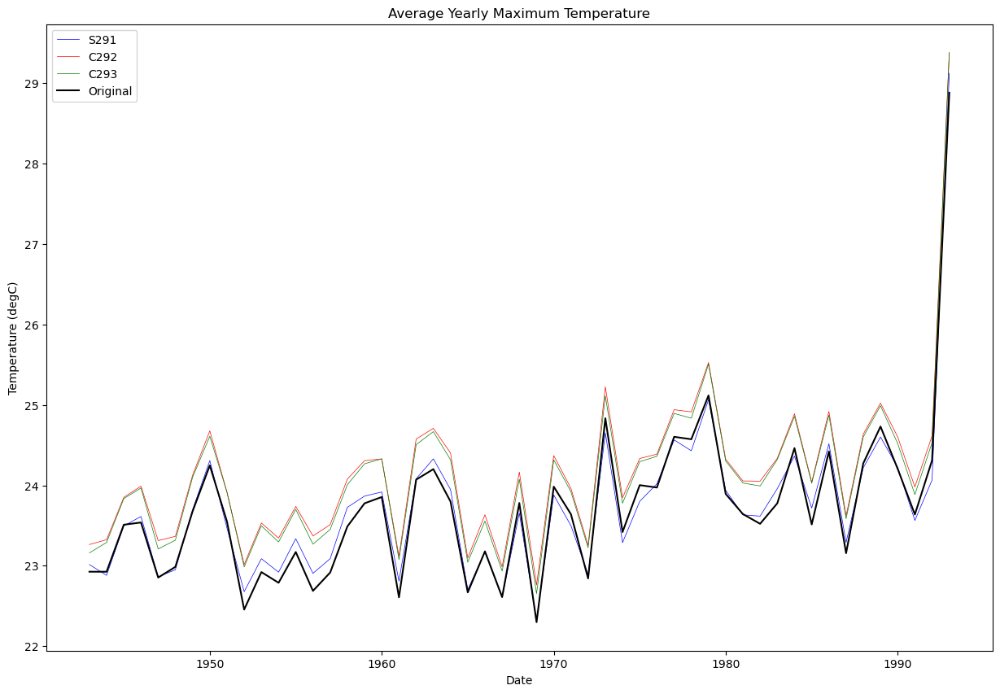

In [102]:
plt.figure(1,figsize= [15,10])
#Historical Estimation

#Plot T
#1830-1875 resample
S291_Y = S291.resample('Y').mean().reset_index()
C292_Y = C292.resample('Y').mean().reset_index()
C293_Y = C293.resample('Y').mean().reset_index()


#PRO DE
Original_Y = Original.resample('Y').mean().reset_index()



#Current Estimation
plt.plot(S291_Y['date'],S291_Y['Max Temp Estimation'],linewidth=0.5,label = 'S291',color = 'blue')

plt.plot(C292_Y['date'],C292_Y['Max Temp Estimation'],linewidth=0.5,label = 'C292',color = 'red')

plt.plot(C293_Y['date'],C293_Y['Max Temp Estimation'],linewidth=0.5,label = 'C293',color = 'green')





#PRO DE
plt.plot(Original_Y['date'],Original_Y['PRO Max'],linewidth=1.5,label = 'Original',color = 'black')

plt.legend()

plt.ylabel('Temperature (degC)')
plt.xlabel('Date')
plt.title('Average Yearly Maximum Temperature')

Text(0.5, 1.0, 'Average Yearly Minimum Temperature')

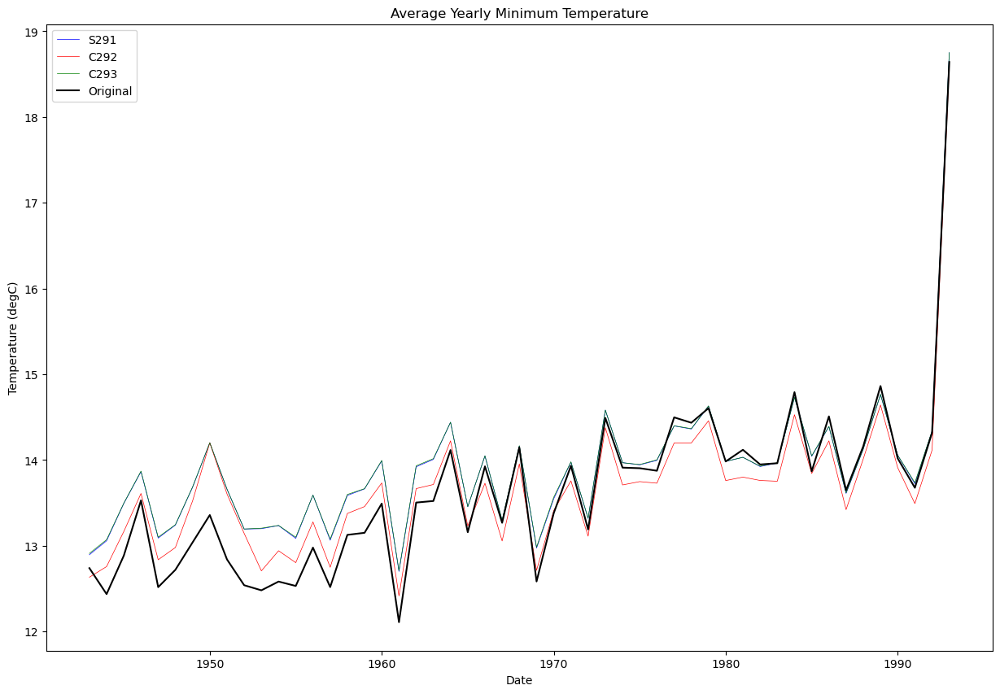

In [103]:
plt.figure(2,figsize= [15,10])
#Historical Estimation



#Current Estimation
plt.plot(S291_Y['date'],S291_Y['Min Temp Estimation'],linewidth=0.5,label = 'S291',color = 'blue')

plt.plot(C292_Y['date'],C292_Y['Min Temp Estimation'],linewidth=0.5,label = 'C292',color = 'red')

plt.plot(C293_Y['date'],C293_Y['Min Temp Estimation'],linewidth=0.5,label = 'C293',color = 'green')







#PRO DE
plt.plot(Original_Y['date'],Original_Y['PRO Min'],linewidth=1.5,label = 'Original',color = 'black')

plt.legend()

plt.ylabel('Temperature (degC)')
plt.xlabel('Date')
plt.title('Average Yearly Minimum Temperature')


In [104]:
def Statiscal_Stats(obs,  obs_col, est, est_col, start_date, end_date):
    '''
    
    
    
    '''
    import math
    actual = obs[obs_col].loc[start_date:end_date]
    estimated = est[est_col].loc[start_date:end_date]
    
    #concatenate onto one dataset
    Dataset = pd.concat([actual,estimated], axis =1).dropna()
    
    #RMSE calculation
    MSE = np.square(np.subtract(actual,estimated)).mean()  
    RMSE = math.sqrt(MSE)
    
    #mean difference
    Difference = (Dataset[obs_col]- Dataset[est_col]).mean()
    
    RMSE_Print = "Root Mean Square Error: {} degC".format(round(RMSE,2))
    Mean_Difference_Print =  "Mean Difference (obs-est): {} degC".format(round(Difference,2))
    
    return(RMSE_Print,Mean_Difference_Print)
print('Max Entire Dataset')
print('S291')
print(Statiscal_Stats(Original,'PRO Max',S291,'Max Temp Estimation',"1942-01-01","1992-01-01"))
print('C292')
print(Statiscal_Stats(Original,'PRO Max',C292,'Max Temp Estimation',"1942-01-01","1992-01-01"))
print('C293')
print(Statiscal_Stats(Original,'PRO Max',C293,'Max Temp Estimation',"1942-01-01","1992-01-01"))



print()

print('Min Entire Dataset')
print('S291')
print(Statiscal_Stats(Original,'PRO Min',S291,'Min Temp Estimation',"1942-01-01","1992-01-01"))
print('C292')
print(Statiscal_Stats(Original,'PRO Min',C292,'Min Temp Estimation',"1942-01-01","1992-01-01"))
print('C293')
print(Statiscal_Stats(Original,'PRO Min',C293,'Min Temp Estimation',"1942-01-01","1992-01-01"))


Max Entire Dataset
S291
('Root Mean Square Error: 1.19 degC', 'Mean Difference (obs-est): -0.02 degC')
C292
('Root Mean Square Error: 1.01 degC', 'Mean Difference (obs-est): -0.44 degC')
C293
('Root Mean Square Error: 0.95 degC', 'Mean Difference (obs-est): -0.39 degC')

Min Entire Dataset
S291
('Root Mean Square Error: 0.99 degC', 'Mean Difference (obs-est): -0.26 degC')
C292
('Root Mean Square Error: 0.96 degC', 'Mean Difference (obs-est): -0.04 degC')
C293
('Root Mean Square Error: 1.0 degC', 'Mean Difference (obs-est): -0.27 degC')


A surprising RMSE we have found is that C293 does better then S291 and C292, which is a positive sign that I am on the right path, I am actually excited and pleased to see these results and to undertsand that my tuition to create the choice model function that was a daughter of S291 and C292. Now we have to look at the extended summer record as this is where the heatwaves are going to lie in, if we noticed this similar pattern, I think we can now go forward and produce the bootstrapping with 50 trials to begin with.

Overall for the minimum temperature all three RMSEs are about the same with a slight overestimation in S291 and C293, however we can adjust for this during the homogenisation phase.

In [105]:
Extended_Summer = [1,2,3,11,12]
Months= ['January', 'February', 'March', 'November', 'December']
Q = 0 

In [106]:
for i in Extended_Summer:
    Months_Obs = pd.concat([Original[Original.index.month==i],], axis = 0)
    Months_Est_S291 = pd.concat([S291[S291.index.month==i],], axis = 0)
    Months_Est_C292 = pd.concat([C292[C292.index.month==i],], axis = 0)
    Months_Est_C293 = pd.concat([C293[C293.index.month==i],], axis = 0)
    
    print('Max Month {}'.format(Months[Q]))
    print('S291')
    print(Statiscal_Stats(Months_Obs,'PRO Max',Months_Est_S291,'Max Temp Estimation',"1942-01-01","1992-01-01"))
    print('C292')
    print(Statiscal_Stats(Months_Obs,'PRO Max',Months_Est_C292,'Max Temp Estimation',"1942-01-01","1992-01-01"))
    print('C293')
    print(Statiscal_Stats(Months_Obs,'PRO Max',Months_Est_C293,'Max Temp Estimation',"1942-01-01","1992-01-01"))
    print()
    print('Min Month {}'.format(Months[Q]))
    print('S291')
    print(Statiscal_Stats(Months_Obs,'PRO Min',Months_Est_S291,'Min Temp Estimation',"1942-01-01","1992-01-01"))
    print('C292')
    print(Statiscal_Stats(Months_Obs,'PRO Min',Months_Est_C292,'Min Temp Estimation',"1942-01-01","1992-01-01"))
    print('C293')
    print(Statiscal_Stats(Months_Obs,'PRO Min',Months_Est_C293,'Min Temp Estimation',"1942-01-01","1992-01-01"))
    print('===================')
    Q = Q+1

Max Month January
S291
('Root Mean Square Error: 1.71 degC', 'Mean Difference (obs-est): -0.1 degC')
C292
('Root Mean Square Error: 1.44 degC', 'Mean Difference (obs-est): -0.6 degC')
C293
('Root Mean Square Error: 1.44 degC', 'Mean Difference (obs-est): -0.55 degC')

Min Month January
S291
('Root Mean Square Error: 0.97 degC', 'Mean Difference (obs-est): -0.27 degC')
C292
('Root Mean Square Error: 0.96 degC', 'Mean Difference (obs-est): -0.09 degC')
C293
('Root Mean Square Error: 0.98 degC', 'Mean Difference (obs-est): -0.28 degC')
Max Month February
S291
('Root Mean Square Error: 1.31 degC', 'Mean Difference (obs-est): -0.14 degC')
C292
('Root Mean Square Error: 1.15 degC', 'Mean Difference (obs-est): -0.57 degC')
C293
('Root Mean Square Error: 1.09 degC', 'Mean Difference (obs-est): -0.54 degC')

Min Month February
S291
('Root Mean Square Error: 0.85 degC', 'Mean Difference (obs-est): -0.22 degC')
C292
('Root Mean Square Error: 0.83 degC', 'Mean Difference (obs-est): -0.07 degC')
C2

Now we need to check what is going in in January thats the RMSE so much hgiher then any other region because it odues not seem right

In [107]:
'''
FIND OUT WHY JANURARY IS SOO MUCH MORE ERRORNOUS
HERE


'''

'\nFIND OUT WHY JANURARY IS SOO MUCH MORE ERRORNOUS\nHERE\n\n\n'

In [108]:
C292

,Max Temp Estimation,Correlation Max T,Min Temp Estimation,Correlation Min T
date,,,,
1942-01-01,28.326931,0.964819,18.329612,0.853338
1942-01-02,27.524850,0.964819,19.122063,0.853338
1942-01-03,25.218868,0.964819,15.736138,0.853338
1942-01-04,28.627711,0.964819,16.384506,0.853338
1942-01-05,35.345138,0.964819,16.770708,0.815771
...,...,...,...,...
1992-04-25,30.157555,0.959920,15.856144,0.872926
1992-04-26,26.082022,0.959920,18.844474,0.872926
1992-04-27,22.685745,0.959920,16.218366,0.872926


In [109]:
C293

,Max Temp Estimation,Correlation Max T,Min Temp Estimation,Correlation Min T
date,,,,
1942-01-01,28.326931,0.964819,18.329612,0.853338
1942-01-02,27.524850,0.964819,19.122063,0.853338
1942-01-03,25.218868,0.964819,15.736138,0.853338
1942-01-04,28.627711,0.964819,16.384506,0.853338
1942-01-05,35.345138,0.964819,21.355333,0.853338
...,...,...,...,...
1992-04-25,30.157555,0.959920,15.856144,0.872926
1992-04-26,26.082022,0.959920,18.844474,0.872926
1992-04-27,22.685745,0.959920,16.218366,0.872926


The greatest uncertainty in the RMSE comes from the month of January with an RMSE of 1.4deC in the Max temperature whereas all the other RMSEs from the Max and Mins of the other extended months all ranges from around 0.85 to 1.11 degC in the C293 case. In C292 seems to overall estimate the Minimum better with a noticable smaller mean difference and RMSE in November and December. However we have to choose one and only one choice method going forward. Despite C292 fairing well in the minimum temperature, it does not have that same authority in the maximum temperature. C292 has a higher mean difference in the Maximum temperature and overall a higher RMSE then the other two choice models. S291, due to its simplicity I believe is too simple for this type of estimation therefore there is really no arguement of why we should use this choice model. Based on this, I do beleive monthly adjustments should be applied onto the temperatures instead of a yearly adjustment.

Overall from this discussion, I will use the C293 choice model as the preferred choice as not only does it fair better in the maximum temperautre estimation which is integral to identifyinf heatwaves using the EHF function, but the minimum temperature is only relevent in the first three days of a heatwave event based on my heatwave function therefore a smaller RMSE would provide a better estimate of the temperatures during the extended summer and ultimately will provide less uncertainty when identifying the heatwaves in the historical period. But for now we will begin to focus on the homogenisation so we can have the mean difference for each month set to 0.M

0.	CORE FUNCTION
1.	Sub-Daily Data Hourly Splitter and Shifter
2.	Sub-Daily Data Concatenation with Daily Extreme Training Data
3.	Model Training Data Month Splitter
4.	Sub-Daily for Estimation Closest Hour
4.1 The Inner Function of the Closest Hour Function
5.	Sampling Training Data
6.	Linear Regression
6.1 Polyfit fitting and correlation

7.	Sub-Daily for Estimation Data Shifter
7.1 Maximum Sub-daily Vector
7.2 Minimum Sub-daily Vector

8.	Estimating Daily Extremes for all trained sub-daily linear regressions
8.1 The Daily Extreme Estimator

9.	Final Daily Extreme Estimation Choice Models
9.1 Simple Choice Model (S291)
9.2 Complex Choice Model (C292)
9.3 Complex Choice Model (C293)


## 2.9.5 SORTING IT OUT READY TO BE SAVED

This is a different part of the code, but this is so its completely readable, this is cleansing the datra

In [110]:
#Convert to DataFrame
def Cleansing_Data(data):
    '''
    It is the dictionaries of all the trials and this will be just cleaned up with all relevent information to covnert
    them into 4 dataframes

    
    '''
    
        #DataFrames
    Max_DF = pd.DataFrame()
    Min_DF = pd.DataFrame()
    CorrMax_DF = pd.DataFrame()
    CorrMin_DF = pd.DataFrame()

    for key, df in data.items():
        #Extract the trial number
        trial_number = key.split('_')[1]
        #Change Name of each column to Something Simple with trial Number
        df.columns = ['Max_' + trial_number, 'MaxCorr_' + trial_number,
                      'Min_' + trial_number, 'MinCorr_' + trial_number]

        #Combine the Trials
        Max_DF = pd.concat([Max_DF, df[df.columns[0]]], axis=1)
        Max_DF = Max_DF.reset_index()
        Max_DF = Max_DF.rename(columns = {'index':'date'})
        Max_DF = Max_DF.set_index('date')
        CorrMax_DF = pd.concat([CorrMax_DF, df[df.columns[1]]], axis=1)
        CorrMax_DF = CorrMax_DF.reset_index()
        CorrMax_DF = CorrMax_DF.rename(columns = {'index':'date'})
        CorrMax_DF = CorrMax_DF.set_index('date')
        Min_DF = pd.concat([Min_DF, df[df.columns[2]]], axis=1)
        Min_DF = Min_DF.reset_index()
        Min_DF = Min_DF.rename(columns = {'index':'date'})
        Min_DF = Min_DF.set_index('date')        
        CorrMin_DF = pd.concat([CorrMin_DF, df[df.columns[3]]], axis=1)
        CorrMin_DF = CorrMin_DF.reset_index()
        CorrMin_DF = CorrMin_DF.rename(columns = {'index':'date'})
        CorrMin_DF = CorrMin_DF.set_index('date')      


    #Add Median, Mean, Conf60, Conf90, and Range

    #----------------MAX-----------------------#
    # Calculate the median across Trials
    Data = Max_DF
    median_values = Data.median(axis=1).round(2)
    median_values.name = 'Max Median'
    # Calculate the mean across Trials
    mean_values = Data.mean(axis=1).round(2)
    mean_values.name = 'Max Mean'
    # Calculate the 60% confidence interval
    confidence_60 = Data.quantile(q=[0.2, 0.8], axis=1).T.round(2)
    confidence_60.columns = ['Max Lower CI (60%)', 'Max Upper CI (60%)']
    # Calculate the 90% confidence interval
    confidence_90 = Data.quantile(q=[0.05, 0.95], axis=1).T.round(2)
    confidence_90.columns = ['Max Lower CI (90%)', 'Max Upper CI (90%)']
    # Calculate the full range
    Range = Data.apply(lambda row: np.ptp(row), axis=1).round(2)
    Range.name = 'Max Full Range'

    Max_All = pd.concat([mean_values,median_values,confidence_60,confidence_90,Range,Data.round(2)],axis=1)

    #----------------CORRMAX-----------------------#
    # Calculate the median across Trials
    Data = CorrMax_DF
    median_values = Data.median(axis=1).round(4)
    median_values.name = 'CorrMax Median'
    # Calculate the mean across Trials
    mean_values = Data.mean(axis=1).round(4)
    mean_values.name = 'CorrMax Mean'
    # Calculate the 60% confidence interval
    confidence_60 = Data.quantile(q=[0.2, 0.8], axis=1).T.round(4)
    confidence_60.columns = ['CorrMax Lower CI (60%)', 'CorrMax Upper CI (60%)']
    # Calculate the 90% confidence interval
    confidence_90 = Data.quantile(q=[0.05, 0.95], axis=1).T.round(4)
    confidence_90.columns = ['CorrMax Lower CI (90%)', 'CorrMax Upper CI (90%)']
    # Calculate the full range
    Range = Data.apply(lambda row: np.ptp(row), axis=1).round(4)
    Range.name = 'CorrMax Full Range'

    CorrMax_All = pd.concat([mean_values,median_values,confidence_60,confidence_90,Range,Data.round(4)],axis=1)



    #----------------MIN-----------------------#
    # Calculate the median across Trials
    Data = Min_DF
    median_values = Data.median(axis=1).round(2)
    median_values.name = 'Min Median'
    # Calculate the mean across Trials
    mean_values = Data.mean(axis=1).round(2)
    mean_values.name = 'Min Mean'
    # Calculate the 60% confidence interval
    confidence_60 = Data.quantile(q=[0.2, 0.8], axis=1).T.round(2)
    confidence_60.columns = ['Min Lower CI (60%)', 'Min Upper CI (60%)']
    # Calculate the 90% confidence interval
    confidence_90 = Data.quantile(q=[0.05, 0.95], axis=1).T.round(2)
    confidence_90.columns = ['Min Lower CI (90%)', 'Min Upper CI (90%)']
    # Calculate the full range
    Range = Data.apply(lambda row: np.ptp(row), axis=1).round(2)
    Range.name = 'Min Full Range'

    Min_All = pd.concat([mean_values,median_values,confidence_60,confidence_90,Range,Data.round(2)],axis=1)

    #----------------CORRMAX-----------------------#
    # Calculate the median across Trials
    Data = CorrMin_DF
    median_values = Data.median(axis=1).round(4)
    median_values.name = 'CorrMin Median'
    # Calculate the mean across Trials
    mean_values = Data.mean(axis=1).round(4)
    mean_values.name = 'CorrMin Mean'
    # Calculate the 60% confidence interval
    confidence_60 = Data.quantile(q=[0.2, 0.8], axis=1).T.round(4)
    confidence_60.columns = ['CorrMin Lower CI (60%)', 'CorrMin Upper CI (60%)']
    # Calculate the 90% confidence interval
    confidence_90 = Data.quantile(q=[0.05, 0.95], axis=1).T.round(4)
    confidence_90.columns = ['CorrMin Lower CI (90%)', 'CorrMin Upper CI (90%)']
    # Calculate the full range
    Range = Data.apply(lambda row: np.ptp(row), axis=1).round(4)
    Range.name = 'CorrMin Full Range'

    CorrMin_All = pd.concat([mean_values,median_values,confidence_60,confidence_90,Range,Data.round(4)],axis=1)

    return(Max_All, CorrMax_All, Min_All, CorrMin_All)

In [111]:
#Replicate a trial
C293_Dic= {}
T=1

C293_Dic['Trial'+ "_" + str(T)] = C293.copy()
A,B,C,D = Cleansing_Data(C293_Dic)

In [112]:
A

,Max Mean,Max Median,Max Lower CI (60%),Max Upper CI (60%),Max Lower CI (90%),Max Upper CI (90%),Max Full Range,Max_1
date,,,,,,,,
1942-01-01,28.33,28.33,28.33,28.33,28.33,28.33,0.0,28.33
1942-01-02,27.52,27.52,27.52,27.52,27.52,27.52,0.0,27.52
1942-01-03,25.22,25.22,25.22,25.22,25.22,25.22,0.0,25.22
1942-01-04,28.63,28.63,28.63,28.63,28.63,28.63,0.0,28.63
1942-01-05,35.35,35.35,35.35,35.35,35.35,35.35,0.0,35.35
...,...,...,...,...,...,...,...,...
1992-04-25,30.16,30.16,30.16,30.16,30.16,30.16,0.0,30.16
1992-04-26,26.08,26.08,26.08,26.08,26.08,26.08,0.0,26.08
1992-04-27,22.69,22.69,22.69,22.69,22.69,22.69,0.0,22.69


In [113]:
C293

,Max Temp Estimation,Correlation Max T,Min Temp Estimation,Correlation Min T
date,,,,
1942-01-01,28.326931,0.964819,18.329612,0.853338
1942-01-02,27.524850,0.964819,19.122063,0.853338
1942-01-03,25.218868,0.964819,15.736138,0.853338
1942-01-04,28.627711,0.964819,16.384506,0.853338
1942-01-05,35.345138,0.964819,21.355333,0.853338
...,...,...,...,...
1992-04-25,30.157555,0.959920,15.856144,0.872926
1992-04-26,26.082022,0.959920,18.844474,0.872926
1992-04-27,22.685745,0.959920,16.218366,0.872926


In [114]:
C292

,Max Temp Estimation,Correlation Max T,Min Temp Estimation,Correlation Min T
date,,,,
1942-01-01,28.326931,0.964819,18.329612,0.853338
1942-01-02,27.524850,0.964819,19.122063,0.853338
1942-01-03,25.218868,0.964819,15.736138,0.853338
1942-01-04,28.627711,0.964819,16.384506,0.853338
1942-01-05,35.345138,0.964819,16.770708,0.815771
...,...,...,...,...
1992-04-25,30.157555,0.959920,15.856144,0.872926
1992-04-26,26.082022,0.959920,18.844474,0.872926
1992-04-27,22.685745,0.959920,16.218366,0.872926


## Chapter 2.10 Does Match Better With Hot Days and Heatwave Days in the Ext Summer Season

The goal in this chapter is to see the RMSE and mean of observations that have been defined in the ACORN-SAT that have a positive EHF which indicates hot days and known hetawave days, these are all compared in the extended summer season. This esnure that when i look at hot days in the past is it more likely that heatwaves and hot days are better represented in a environemtn which we know is hotter then normal then an entire dataset idea. Essentially I aim to circle bakc to my idea that we are doing this to find heatwvaes in the historical past, therefore it is my job to ensure that this function ends up doing what it is doing and able to esitmate the chance that a heatwave is occruing in the past. We know that the acorn sat and the perth regional office are not the same but knowing that a extremely hot day aka EHF of +20C^2 wil most lielly be represented in the data on the perth regional office to. The discussion of my heatwave function will be completed in Chapter 3.

In [115]:
#Download the packages and ACORN-SAT Files

#Max Temp, (drop(0) has dropped the 0th index, so it starts at 1)
MaxT_Perth = pd.read_csv(r"C:\Users\jarra\Desktop\Masters Research\Python\Data\tmax.009021.daily.csv").drop(0)
#Min Temp
MinT_Perth = pd.read_csv(r"C:\Users\jarra\Desktop\Masters Research\Python\Data\tmin.009021.daily.csv").drop(0)


Maximum = pd.Series(MaxT_Perth['maximum temperature (degC)'], name="Max")
Minimum = pd.Series(MinT_Perth['minimum temperature (degC)'],name="Min")

#The Daily Max Min Ave Data
ACORN_SAT = pd.concat([MaxT_Perth['date'],Maximum,Minimum],axis=1)
ACORN_SAT['date'] = pd.to_datetime(ACORN_SAT['date'],format="%d/%m/%Y")
ACORN_SAT

#Dates 
#This is used in the concatination process when the CDP is developed and other things 
#that have the data disappear. Since the full 366 days need to be accounted for, 2020 was 
#the year I chose for this
#'''
Dates = pd.read_csv(r"C:\Users\jarra\Desktop\Masters Research\Python\Data\Dates, includes feb 29.csv")
ACORN_SAT.head(50)


,date,Max,Min
1,1910-01-01,26.7,16.4
2,1910-01-02,27.0,13.5
3,1910-01-03,27.5,12.0
4,1910-01-04,24.0,13.5
5,1910-01-05,24.8,9.8
6,1910-01-06,24.4,9.8
7,1910-01-07,25.3,10.4
8,1910-01-08,28.0,14.5
9,1910-01-09,32.6,14.4
10,1910-01-10,35.9,17.8


In [116]:
import Functions_Research as FR
HWs,CDP = FR.Heatwave_Function_v5(ACORN_SAT,
                         Dates,
                         CDP_Matrix = [],
                         Heatwave_Detail= True,
                         Percentile = 85,
                         window = 7,
                         CDP_start_end_years = [1961,1990])

In [117]:
HWs.columns


Index(['date', 'id', 'Rowes Heatwave Categorisation', 'Tmax', 'Tmin',
       'Duration', 'Peak Intensity', 'EHF_Mx', 'HS_Mx', 'EH_Mx', 'EHF_Mn',
       'HS_Mn', 'EH_Mn', 'T_avg', 'EHF_avg', 'HS_avg', 'EH_avg',
       'Tmax HW Mean', 'Tmin HW Mean', 'T_avg HW Mean', 'EHF_Mx HW Mean',
       'HS_Mx HW Mean', 'EH_Mx HW Mean', 'EHF_Mn HW Mean', 'HS_Mn HW Mean',
       'EH_Mn HW Mean', 'EHF_avg HW Mean', 'HS_avg HW Mean', 'EH_avg HW Mean',
       'Total Excess Heat Factor', 'Total Intenisty'],
      dtype='object')

Now lets extract the EHFs during a heatwave with a value greater then 10

In [118]:
EHFs_G10 = HWs[HWs['EHF_avg'] > 10]
EHFs_G10['date'] = pd.to_datetime(EHFs_G10['date'])

In [119]:
Hot_Per = FR.Date_Splitter(EHFs_G10)

#This finds the heatwaves that reside in the extended summer period defined by Novmeber to March
ext_sum_heatwave = Hot_Per[Hot_Per['month']>=11]
ext_sum_heatwave2 =  Hot_Per[Hot_Per['month']<=3]

Extended_Summer_Season = pd.concat([ext_sum_heatwave,ext_sum_heatwave2]).sort_values(by=[Data_Col[0]], ascending=True)
    
    
EHFs_G10 = EHFs_G10.set_index('date')
    

In [120]:
EHFs_G10_Ext_Sum = Extended_Summer_Season.set_index('date')

In [121]:
Heatwaves_Data = HWs.set_index('date')

Now we have the three more core categories to compare to with the estimation functions, the first of with is the EHF of greater then 10C2 for all months, the second is the same but for the extended summer season, and the last is the heatwave days variant which we can overlay and cut down the three models and actually interrogate the validity of the models with the specific heatwvaes in hand, the temperature might not be the exact but there is reason to suggest due to the similar lcoation of Perth we can say that if a hot day occurs at ACORN-SAT a hot day should occur at the Perth Regional Office and in more retrospect the Perth Gardens record

In [122]:
print(S291)
print('OOOOOOOOOOOOOOOOOO0000000000000000000000000000000000OOOOOOO')
print(C292)
print('OOOOOOOOOOOOOOO0000000000000000000000000000000000OOOOOOOOOO')
print(C293)
print('OOOOOOOOOOOOOO--------------------------------OOOOOOOOOOO')
print(Original)
print('OOOOOOOOOOOOOO--------------------------------OOOOOOOOOOO')
print(EHFs_G10)
print('OOOOOOOOOOOOOOO00000000000000000000000000000000000000OOOOOOOOOO')
print(EHFs_G10_Ext_Sum)
print('OOOOOOOOOOOOOOO00000000000000000000000000000000000000OOOOOOOOOO')
print(HWs)


            Max Temp Estimation  Correlation Max T  Min Temp Estimation  \
date                                                                      
1942-01-01            28.326931           0.964819            18.329612   
1942-01-02            27.524850           0.964819            19.122063   
1942-01-03            25.218868           0.964819            15.736138   
1942-01-04            28.627711           0.964819            16.384506   
1942-01-05            35.345138           0.964819            21.355333   
...                         ...                ...                  ...   
1992-04-25            30.157555           0.959920            15.856144   
1992-04-26            26.082022           0.959920            18.844474   
1992-04-27            22.685745           0.959920            16.218366   
1992-04-28            23.947219           0.959920            14.497812   
1992-04-29            24.238329           0.959920            15.946699   

            Correlation 

Now lets merge

Skeleton #df_merged = pd.merge(df_merged[['date', 'Max', 'Min']], Daily_MaxMin[['date', 'Max', 'Min']], on='date', how='left') df_merged = df_merged.set_index('date') P_Gardens_Corr =P_Gardens_Corr.set_index('date') #Fill any missing values with the last known value (forward fill) #df_merged.fillna(method='ffill', inplace=False) df_concat = pd.concat([df_merged,Daily_MaxMin],axis =0) df_concat = pd.concat([df_concat,P_Gardens_Corr],axis =0)

df_concat = df_concat.reset_index() df_concat = df_concat.drop_duplicates(subset=["date"], keep='last') df_concat = df_concat.set_index('date') df_concat.reset_index()

In [123]:
#S291 VS The data
S291 = S291.reset_index()
EHFs_G10_S291 = EHFs_G10.reset_index().copy()
EHFs_G10_Ext_Sum_S291 = EHFs_G10_Ext_Sum.reset_index().copy()
Heatwaves_Data_S291 = Heatwaves_Data.reset_index().copy()


EHFs_G10_S291 = pd.merge(EHFs_G10_S291[['date']], S291[['date', 'Max Temp Estimation', 'Min Temp Estimation']], on='date', how='left').dropna().set_index('date')
EHFs_G10_Ext_Sum_S291 = pd.merge(EHFs_G10_Ext_Sum_S291[['date']], S291[['date', 'Max Temp Estimation', 'Min Temp Estimation']], on='date', how='left').dropna().set_index('date')
Heatwaves_Data_S291 = pd.merge(Heatwaves_Data_S291[['date']], S291[['date', 'Max Temp Estimation', 'Min Temp Estimation']], on='date', how='left').dropna().set_index('date')


In [124]:
C292

,Max Temp Estimation,Correlation Max T,Min Temp Estimation,Correlation Min T
date,,,,
1942-01-01,28.326931,0.964819,18.329612,0.853338
1942-01-02,27.524850,0.964819,19.122063,0.853338
1942-01-03,25.218868,0.964819,15.736138,0.853338
1942-01-04,28.627711,0.964819,16.384506,0.853338
1942-01-05,35.345138,0.964819,16.770708,0.815771
...,...,...,...,...
1992-04-25,30.157555,0.959920,15.856144,0.872926
1992-04-26,26.082022,0.959920,18.844474,0.872926
1992-04-27,22.685745,0.959920,16.218366,0.872926


In [125]:
#C292U VS The data
C292 = C292.reset_index()
EHFs_G10_C292 = EHFs_G10.reset_index().copy()
EHFs_G10_Ext_Sum_C292 = EHFs_G10_Ext_Sum.reset_index().copy()
Heatwaves_Data_C292 = Heatwaves_Data.reset_index().copy()


EHFs_G10_C292 = pd.merge(EHFs_G10_C292[['date']], C292[['date', 'Max Temp Estimation', 'Min Temp Estimation']], on='date', how='left').dropna().set_index('date')
EHFs_G10_Ext_Sum_C292 = pd.merge(EHFs_G10_Ext_Sum_C292[['date']], C292[['date', 'Max Temp Estimation', 'Min Temp Estimation']], on='date', how='left').dropna().set_index('date')
Heatwaves_Data_C292 = pd.merge(Heatwaves_Data_C292[['date']], C292[['date', 'Max Temp Estimation', 'Min Temp Estimation']], on='date', how='left').dropna().set_index('date')


In [126]:
#C293 VS The data
C293 = C293.reset_index()
EHFs_G10_C293 = EHFs_G10.reset_index().copy()
EHFs_G10_Ext_Sum_C293 = EHFs_G10_Ext_Sum.reset_index().copy()
Heatwaves_Data_C293 = Heatwaves_Data.reset_index().copy()


EHFs_G10_C293 = pd.merge(EHFs_G10_C293[['date']], C293[['date', 'Max Temp Estimation', 'Min Temp Estimation']], on='date', how='left').dropna().set_index('date')
EHFs_G10_Ext_Sum_C293 = pd.merge(EHFs_G10_Ext_Sum_C293[['date']], C293[['date', 'Max Temp Estimation', 'Min Temp Estimation']], on='date', how='left').dropna().set_index('date')
Heatwaves_Data_C293 = pd.merge(Heatwaves_Data_C293[['date']], C293[['date', 'Max Temp Estimation', 'Min Temp Estimation']], on='date', how='left').dropna().set_index('date')


In [127]:
#C293 VS The data
Original = Original.reset_index()
EHFs_G10_Original = EHFs_G10.reset_index().copy()
EHFs_G10_Ext_Sum_Original = EHFs_G10_Ext_Sum.reset_index().copy()
Heatwaves_Data_Original = Heatwaves_Data.reset_index().copy()


EHFs_G10_Original = pd.merge(EHFs_G10_Original[['date']], Original[['date', 'PRO Max', 'PRO Min']], on='date', how='left').dropna().set_index('date')
EHFs_G10_Ext_Sum_Original = pd.merge(EHFs_G10_Ext_Sum_Original[['date']], Original[['date','PRO Max', 'PRO Min']], on='date', how='left').dropna().set_index('date')
Heatwaves_Data_Original = pd.merge(Heatwaves_Data_Original[['date']], Original[['date','PRO Max', 'PRO Min']], on='date', how='left').dropna().set_index('date')


In [128]:
#Lets try the  EHF>10
print('EHF>10')
print('MAX')
print(Statiscal_Stats(EHFs_G10_Original,'PRO Max',EHFs_G10_S291,'Max Temp Estimation',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(EHFs_G10_Original,'PRO Max',EHFs_G10_C292,'Max Temp Estimation',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(EHFs_G10_Original,'PRO Max',EHFs_G10_C293,'Max Temp Estimation',"1942-01-01","1992-01-01"))
print('MIN')
print(Statiscal_Stats(EHFs_G10_Original,'PRO Min',EHFs_G10_S291,'Min Temp Estimation',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(EHFs_G10_Original,'PRO Min',EHFs_G10_C292,'Min Temp Estimation',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(EHFs_G10_Original,'PRO Min',EHFs_G10_C293,'Min Temp Estimation',"1942-01-01","1992-01-01"))



#Lets try the EHF>10 EXT SUMMER
print('EXT SUM EHF>10')
print('MAX')
print(Statiscal_Stats(EHFs_G10_Ext_Sum_Original,'PRO Max',EHFs_G10_Ext_Sum_S291,'Max Temp Estimation',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(EHFs_G10_Ext_Sum_Original,'PRO Max',EHFs_G10_Ext_Sum_C292,'Max Temp Estimation',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(EHFs_G10_Ext_Sum_Original,'PRO Max',EHFs_G10_Ext_Sum_C293,'Max Temp Estimation',"1942-01-01","1992-01-01"))
print('MIN')
print(Statiscal_Stats(EHFs_G10_Ext_Sum_Original,'PRO Min',EHFs_G10_Ext_Sum_S291,'Min Temp Estimation',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(EHFs_G10_Ext_Sum_Original,'PRO Min',EHFs_G10_Ext_Sum_C292,'Min Temp Estimation',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(EHFs_G10_Ext_Sum_Original,'PRO Min',EHFs_G10_Ext_Sum_C293,'Min Temp Estimation',"1942-01-01","1992-01-01"))


#Lets try the HEATWAVES
print('Heatwaves')
print('MAX')
print(Statiscal_Stats(Heatwaves_Data_Original,'PRO Max',Heatwaves_Data_S291,'Max Temp Estimation',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Heatwaves_Data_Original,'PRO Max',Heatwaves_Data_C292,'Max Temp Estimation',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Heatwaves_Data_Original,'PRO Max',Heatwaves_Data_C293,'Max Temp Estimation',"1942-01-01","1992-01-01"))
print('MIN')
print(Statiscal_Stats(Heatwaves_Data_Original,'PRO Min',Heatwaves_Data_S291,'Min Temp Estimation',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Heatwaves_Data_Original,'PRO Min',Heatwaves_Data_C292,'Min Temp Estimation',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Heatwaves_Data_Original,'PRO Min',Heatwaves_Data_C293,'Min Temp Estimation',"1942-01-01","1992-01-01"))


print('MAX')
print('S291')
print(Statiscal_Stats(Original,'PRO Max',S291,'Max Temp Estimation',"1942-01-01","1992-01-01"))
print('C293')
print(Statiscal_Stats(Original,'PRO Max',C293,'Max Temp Estimation',"1942-01-01","1992-01-01"))
print('C292')
print(Statiscal_Stats(Original,'PRO Max',C292,'Max Temp Estimation',"1942-01-01","1992-01-01"))
print('MIN')
print('S291')
print(Statiscal_Stats(Original,'PRO Min',S291,'Min Temp Estimation',"1942-01-01","1992-01-01"))
print('C293')
print(Statiscal_Stats(Original,'PRO Min',C293,'Min Temp Estimation',"1942-01-01","1992-01-01"))
print('C292')
print(Statiscal_Stats(Original,'PRO Min',C292,'Min Temp Estimation',"1942-01-01","1992-01-01"))



EHF>10
MAX
('Root Mean Square Error: 2.21 degC', 'Mean Difference (obs-est): 0.53 degC')
('Root Mean Square Error: 1.46 degC', 'Mean Difference (obs-est): -0.62 degC')
('Root Mean Square Error: 1.52 degC', 'Mean Difference (obs-est): -0.43 degC')
MIN
('Root Mean Square Error: 1.06 degC', 'Mean Difference (obs-est): -0.13 degC')
('Root Mean Square Error: 0.93 degC', 'Mean Difference (obs-est): 0.11 degC')
('Root Mean Square Error: 1.06 degC', 'Mean Difference (obs-est): -0.13 degC')
EXT SUM EHF>10
MAX
('Root Mean Square Error: 2.25 degC', 'Mean Difference (obs-est): 0.54 degC')
('Root Mean Square Error: 1.48 degC', 'Mean Difference (obs-est): -0.65 degC')
('Root Mean Square Error: 1.54 degC', 'Mean Difference (obs-est): -0.46 degC')
MIN
('Root Mean Square Error: 1.03 degC', 'Mean Difference (obs-est): -0.09 degC')
('Root Mean Square Error: 0.9 degC', 'Mean Difference (obs-est): 0.15 degC')
('Root Mean Square Error: 1.03 degC', 'Mean Difference (obs-est): -0.09 degC')
Heatwaves
MAX
('Roo

## Chapter 2.11 What is the accuracy when 9pm to 6am or 9am and 3pm only temperatures disappear from the observational dataset?

In [129]:
#Perth Regional Office 1967 to 1992 sub daily dataset
#'''
#Adjusted 1942, 1943 to 2am DST all others fixed
#r"E:\LIBRARY\UNIVERSITY\Masters Research\Python\Data\perthregionaloffice_subdaily_1942-1992_DST.csv"

#Ajdusted all hours from the DST to match back to 3am, adding 1 hour to all times affected by Daylight Saving,
#questions 1942 and 1943 not sure if its 3am or 4am adjusted.
#r"E:\LIBRARY\UNIVERSITY\Masters Research\Python\Data\perthregionaloffice_subdaily_1942-1992_DST_Removed.csv"
#'''
PRO_Sub = PRO_Sub.reset_index()

#Now lets remove 9pm to 6am
PRO_Sub_9am_to_6pm_only = PRO_Sub[(PRO_Sub['date'].dt.hour > 6) & (PRO_Sub['date'].dt.hour < 21)].set_index('date')
PRO_Sub_9am_and_3pm_only = PRO_Sub[(PRO_Sub['date'].dt.hour == 9) | (PRO_Sub['date'].dt.hour == 15)].set_index('date')
PRO_DE6792 = PRO_DE.loc['1967':'1992']


In [130]:
PRO_Sub_9am_and_3pm_only

,temp
date,
1942-01-01 09:00:00,23.0
1942-01-01 15:00:00,26.4
1942-01-02 09:00:00,24.1
1942-01-02 15:00:00,25.6
1942-01-03 09:00:00,19.4
...,...
1992-04-28 09:00:00,18.0
1992-04-28 15:00:00,22.7
1992-04-29 09:00:00,19.6


Above are the different times where we only have the requierment within the bounds of the historical perth region, so when the observations were both between 9am and 6pm and furthermore they had mostly 10am to 4pm, but in our case 9am and 3pm observations, therefore doing what was done in Chapter 2.9.4 and 2.10, we will go through the same methods to develop the RMSE for these period. But since I have already decided to go with the C293, and this looks like it is fairly the same for the Chapter 2.10, we will use this for now and assess the RMSE and Mean compared to the previous chapters for C293.

In [131]:
#Lets get the data for training
PRO_Sub_ES_Trained_9_6  = PRO_Sub_9am_to_6pm_only.loc['1967':'1992']
PRO_Sub_ES_Trained_9_6 = PRO_Sub_ES_Trained_9_6.reset_index()

PRO_Sub_ES_Trained_9_3  = PRO_Sub_9am_and_3pm_only.loc['1967':'1992']
PRO_Sub_ES_Trained_9_3 = PRO_Sub_ES_Trained_9_3.reset_index()
PRO_DE6792 = PRO_DE6792.reset_index()

PRO_Sub_9am_to_6pm_only = PRO_Sub_9am_to_6pm_only.reset_index()
PRO_Sub_9am_and_3pm_only = PRO_Sub_9am_and_3pm_only.reset_index()

In [132]:
Sub_Daily_Training = PRO_Sub_ES6792
Daily_Extreme_Training = PRO_DE6792.reset_index()
Sub_Daily = PRO_Sub.reset_index()

In [133]:
del Daily_Extreme_Training['index']

In [134]:
#a,b,c = Temp_Estimation(PRO_Sub_9am_to_6pm_only, PRO_Sub, PRO_DE6792, 1)
MaxT_9_3,MaxC_9_3,MinT_9_3,MinC_9_3 = FR.Temp_Estimation(PRO_Sub_9am_and_3pm_only, Sub_Daily_Training, Daily_Extreme_Training, 1, 0.85)
MaxT_9_6,MaxC_9_6,MinT_9_6,MinC_9_6 = FR.Temp_Estimation(PRO_Sub_9am_to_6pm_only,  Sub_Daily_Training, Daily_Extreme_Training, 1, 0.85)



DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
DONE P8
1
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
DONE P8
1
DONE P9
DONE P10


In [135]:
def Statiscal_Stats(obs,  obs_col, est, est_col, start_date, end_date):
    '''
    
    
    
    '''
    import math
    actual = obs[obs_col].loc[start_date:end_date]
    estimated = est[est_col].loc[start_date:end_date]
    
    #concatenate onto one dataset
    Dataset = pd.concat([actual,estimated], axis =1).dropna()
    
    #RMSE calculation
    MSE = np.square(np.subtract(actual,estimated)).mean()  
    RMSE = math.sqrt(MSE)
    
    #mean difference
    Difference = (Dataset[obs_col]- Dataset[est_col]).mean()
    
    RMSE_Print = "Root Mean Square Error: {} degC".format(round(RMSE,2))
    Mean_Difference_Print =  "Mean Difference (obs-est): {} degC".format(round(Difference,2))
    
    return(RMSE_Print,Mean_Difference_Print)

In [136]:
MaxT_9_3

,date,Max Mean,Max Median,Max Lower CI (60%),Max Upper CI (60%),Max Lower CI (90%),Max Upper CI (90%),Max Full Range,Max_1
0,1942-01-01,28.24,28.24,28.24,28.24,28.24,28.24,0.0,28.24
1,1942-01-02,27.42,27.42,27.42,27.42,27.42,27.42,0.0,27.42
2,1942-01-03,25.09,25.09,25.09,25.09,25.09,25.09,0.0,25.09
3,1942-01-04,28.54,28.54,28.54,28.54,28.54,28.54,0.0,28.54
4,1942-01-05,35.34,35.34,35.34,35.34,35.34,35.34,0.0,35.34
...,...,...,...,...,...,...,...,...,...
18274,1992-04-26,26.06,26.06,26.06,26.06,26.06,26.06,0.0,26.06
18275,1992-04-27,22.71,22.71,22.71,22.71,22.71,22.71,0.0,22.71
18276,1992-04-28,23.96,23.96,23.96,23.96,23.96,23.96,0.0,23.96
18277,1992-04-29,24.24,24.24,24.24,24.24,24.24,24.24,0.0,24.24


In [137]:
MinT_9_3

,date,Min Mean,Min Median,Min Lower CI (60%),Min Upper CI (60%),Min Lower CI (90%),Min Upper CI (90%),Min Full Range,Min_1
0,1942-01-01,18.27,18.27,18.27,18.27,18.27,18.27,0.0,18.27
1,1942-01-02,19.10,19.10,19.10,19.10,19.10,19.10,0.0,19.10
2,1942-01-03,15.54,15.54,15.54,15.54,15.54,15.54,0.0,15.54
3,1942-01-04,16.23,16.23,16.23,16.23,16.23,16.23,0.0,16.23
4,1942-01-05,21.45,21.45,21.45,21.45,21.45,21.45,0.0,21.45
...,...,...,...,...,...,...,...,...,...
18274,1992-04-26,18.72,18.72,18.72,18.72,18.72,18.72,0.0,18.72
18275,1992-04-27,16.17,16.17,16.17,16.17,16.17,16.17,0.0,16.17
18276,1992-04-28,14.50,14.50,14.50,14.50,14.50,14.50,0.0,14.50
18277,1992-04-29,15.91,15.91,15.91,15.91,15.91,15.91,0.0,15.91


In [138]:

Original =  PRO_DE.loc['1942-01-01':'1992-04-29']
Original

,PRO Max,PRO Min
date,,
1942-01-01,30.3,18.6
1942-01-02,26.8,18.5
1942-01-03,24.7,14.3
1942-01-04,27.9,16.7
1942-01-05,39.3,18.3
...,...,...
1992-04-25,29.6,15.7
1992-04-26,30.0,19.5
1992-04-27,22.4,15.7


In [139]:
#MaxT_9_6 = MaxT_9_6.reset_index()
#MinT_9_6 = MinT_9_6.reset_index()

#MaxT_9_3 = MaxT_9_3.reset_index()
#MinT_9_3 = MinT_9_3.reset_index()






print('Max Entire Dataset')
print('U_96')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_6,'Max_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_3,'Max_1',"1942-01-01","1992-01-01"))

print()

print('Min Entire Dataset')
print('U_96')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_6,'Min_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_3,'Min_1',"1942-01-01","1992-01-01"))


Max Entire Dataset
U_96
('Root Mean Square Error: nan degC', 'Mean Difference (obs-est): nan degC')
U_93
('Root Mean Square Error: nan degC', 'Mean Difference (obs-est): nan degC')

Min Entire Dataset
U_96
('Root Mean Square Error: nan degC', 'Mean Difference (obs-est): nan degC')
U_93
('Root Mean Square Error: nan degC', 'Mean Difference (obs-est): nan degC')


In [140]:
Original = Original.reset_index()
Original

,date,PRO Max,PRO Min
0,1942-01-01,30.3,18.6
1,1942-01-02,26.8,18.5
2,1942-01-03,24.7,14.3
3,1942-01-04,27.9,16.7
4,1942-01-05,39.3,18.3
...,...,...,...
18377,1992-04-25,29.6,15.7
18378,1992-04-26,30.0,19.5
18379,1992-04-27,22.4,15.7
18380,1992-04-28,22.7,15.7


Text(0.5, 1.0, 'Average Yearly Minimum Temperature')

<Figure size 1500x1000 with 0 Axes>

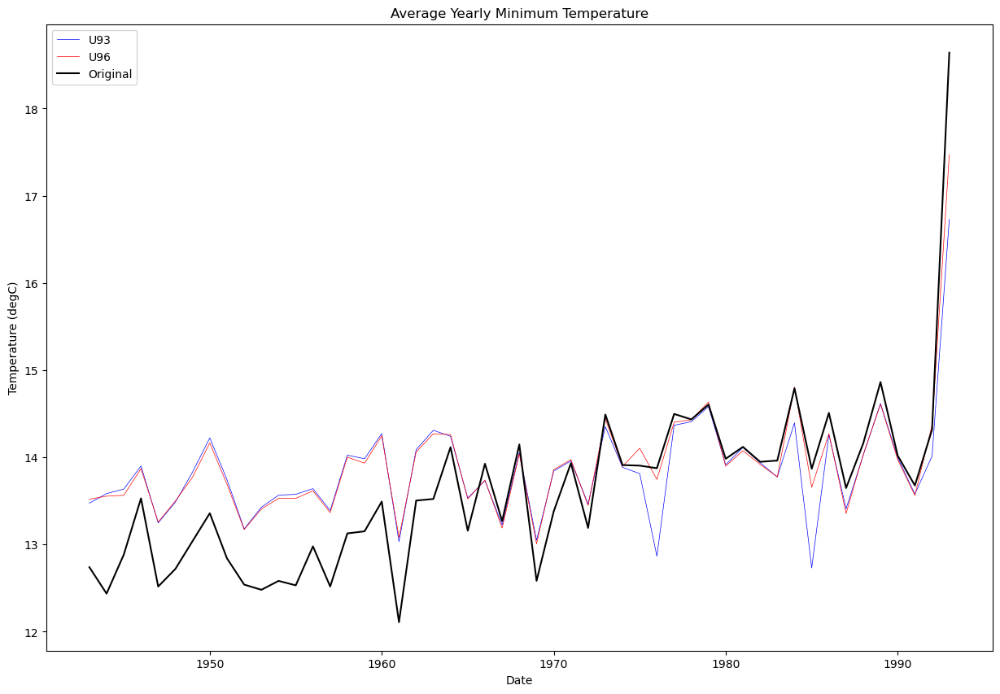

In [141]:
plt.figure(1,figsize= [15,10])
#Historical Estimation

#Plot T
#1830-1875 resample
U93_Y = MinT_9_3.set_index('date').resample('Y').mean().reset_index()
U96_Y = MinT_9_6.set_index('date').resample('Y').mean().reset_index()



plt.figure(2,figsize= [15,10])
#Historical Estimation



#Current Estimation
plt.plot(U93_Y['date'],U93_Y['Min_1'],linewidth=0.5,label = 'U93',color = 'blue')

plt.plot(U96_Y['date'],U96_Y['Min_1'],linewidth=0.5,label = 'U96',color = 'red')





#PRO DE
plt.plot(Original_Y['date'],Original_Y['PRO Min'],linewidth=1.5,label = 'Original',color = 'black')

plt.legend()

plt.ylabel('Temperature (degC)')
plt.xlabel('Date')
plt.title('Average Yearly Minimum Temperature')

Text(0.5, 1.0, 'Average Yearly Maximum Temperature')

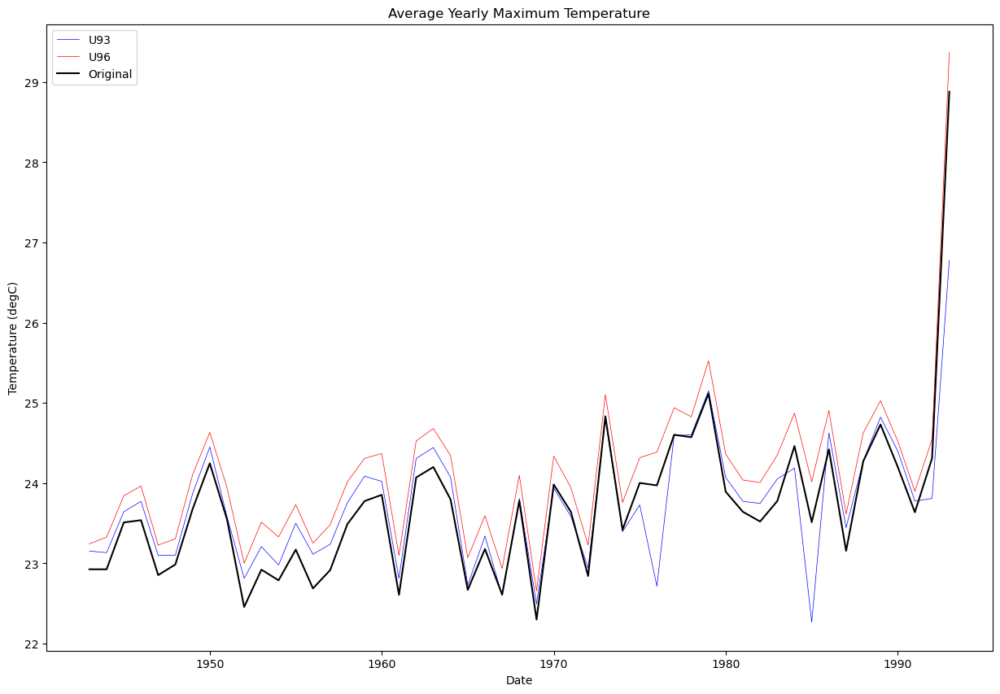

In [142]:
plt.figure(2,figsize= [15,10])
#Historical Estimation
#1830-1875 resample
U93_Y = MaxT_9_3.set_index('date').resample('Y').mean().reset_index()
U96_Y = MaxT_9_6.set_index('date').resample('Y').mean().reset_index()



#Current Estimation
plt.plot(U93_Y['date'],U93_Y['Max_1'],linewidth=0.5,label = 'U93',color = 'blue')

plt.plot(U96_Y['date'],U96_Y['Max_1'],linewidth=0.5,label = 'U96',color = 'red')





#PRO DE
plt.plot(Original_Y['date'],Original_Y['PRO Max'],linewidth=1.5,label = 'Original',color = 'black')

plt.legend()

plt.ylabel('Temperature (degC)')
plt.xlabel('Date')
plt.title('Average Yearly Maximum Temperature')

Text(0.5, 1.0, 'Average Yearly Correlation For Min')

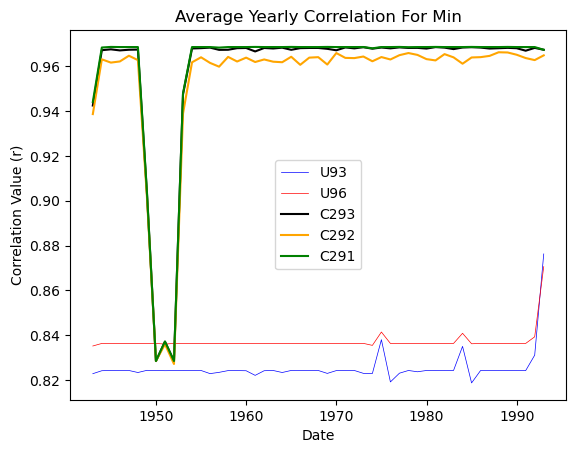

In [143]:

#Historical Estimation

#1830-1875 resample
U93_Y = MinC_9_3.set_index('date').resample('Y').mean().reset_index()
U96_Y = MinC_9_6.set_index('date').resample('Y').mean().reset_index()


#Current Estimation
plt.plot(U93_Y['date'],U93_Y['MinCorr_1'],linewidth=0.5,label = 'U93',color = 'blue')

plt.plot(U96_Y['date'],U96_Y['MinCorr_1'],linewidth=0.5,label = 'U96',color = 'red')





#PRO DE
plt.plot(C293_Y['date'],C293_Y['Correlation Min T'],linewidth=1.5,label = 'C293',color = 'black')

#PRO DE
plt.plot(C292_Y['date'],C292_Y['Correlation Min T'],linewidth=1.5,label = 'C292',color = 'orange')


#PRO DE
plt.plot(S291_Y['date'],S291_Y['Correlation Min T'],linewidth=1.5,label = 'C291',color = 'green')

plt.legend()

plt.ylabel('Correlation Value (r)')
plt.xlabel('Date')
plt.title('Average Yearly Correlation For Min')

Text(0.5, 1.0, 'Average Yearly Correlation For Max')

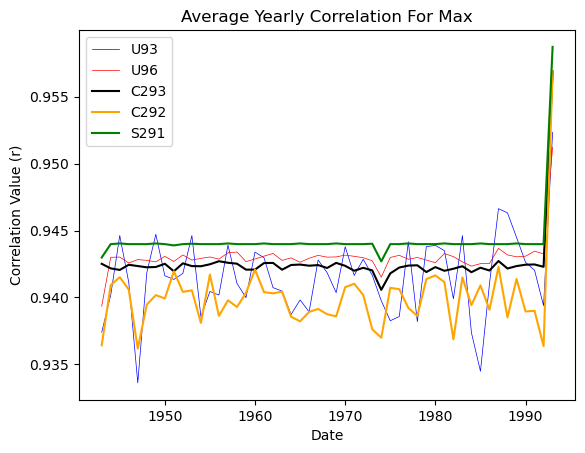

In [144]:
U93_Y = MaxC_9_3.set_index('date').resample('Y').mean().reset_index()
U96_Y = MaxC_9_6.set_index('date').resample('Y').mean().reset_index()
#Current Estimation
plt.plot(U93_Y['date'],U93_Y['MaxCorr_1'],linewidth=0.5,label = 'U93',color = 'blue')

plt.plot(U96_Y['date'],U96_Y['MaxCorr_1'],linewidth=0.5,label = 'U96',color = 'red')





plt.plot(C293_Y['date'],C293_Y['Correlation Max T'],linewidth=1.5,label = 'C293',color = 'black')

#PRO DE
plt.plot(C292_Y['date'],C292_Y['Correlation Max T'],linewidth=1.5,label = 'C292',color = 'orange')


#PRO DE
plt.plot(S291_Y['date'],S291_Y['Correlation Max T'],linewidth=1.5,label = 'S291',color = 'green')

plt.legend()


plt.ylabel('Correlation Value (r)')
plt.xlabel('Date')
plt.title('Average Yearly Correlation For Max')

C292 underperforms in both graphs, C293 befores almmost as well as the S291 if not at the same level of correaltion fo the most part, the simple has a higher RMSE due not enough inputs that may help its case to move away from an outlier aka observation > estimation, therefore the C292 captures this. However, removing the night time temperatures removes the ability to predict minimum temperatures well, therefore the prediciability of the minimum temperature is slaughtered significnatly, from 0.96 avergae to 0.84, aka that 3 hour shift, it over predicts the temperature by 3 degree with a 4 degree RMSE, therefore we can adjust by the mean, but it leasts this 4 degree error within the results More to come...

Therefore I believe the best way to represnet the EHF from this is to use the average Tmax and Tmin in this case.

Now soem exteended summer and monthly statsitics

In [145]:
MaxT_9_3 = MaxT_9_3
MaxT_9_6 = MaxT_9_6
MinT_9_3 = MinT_9_3
MinT_9_6 = MinT_9_6

In [146]:
MaxT_9_3[['date','Max_1']]

,date,Max_1
0,1942-01-01,28.24
1,1942-01-02,27.42
2,1942-01-03,25.09
3,1942-01-04,28.54
4,1942-01-05,35.34
...,...,...
18274,1992-04-26,26.06
18275,1992-04-27,22.71
18276,1992-04-28,23.96
18277,1992-04-29,24.24


In [147]:
#Merge the max and min
U_93= MaxT_9_3[['date','Max_1']].merge(MinT_9_3[['date','Min_1']],on='date',how='right')

U_96= MaxT_9_6[['date','Max_1']].merge(MinT_9_6[['date','Min_1']],on='date',how='right')

U_93_4_e  = U_93.copy()
U_96_4_e = U_96.copy()


Ext_Sum_U93 = pd.merge(Extended_Summer_Season[['date']], U_93_4_e[['date', 'Max_1', 'Min_1']], on='date', how='left').dropna()
Ext_Sum_U96 = pd.merge(Extended_Summer_Season[['date']], U_96_4_e[['date', 'Max_1', 'Min_1']], on='date', how='left').dropna()


In [148]:
Ext_Sum_U93 = pd.merge(Ext_Sum_U93[['date', 'Max_1', 'Min_1']],Original[['date','PRO Max','PRO Min']],  on='date', how='left').dropna().set_index('date')
Ext_Sum_U96 = pd.merge(Ext_Sum_U96[['date', 'Max_1', 'Min_1']],Original[['date','PRO Max','PRO Min']],  on='date', how='left').dropna().set_index('date')


In [149]:

print('Max Entire Dataset')
print('U_93')
print(Statiscal_Stats(Ext_Sum_U93,'PRO Max',Ext_Sum_U93,'Max_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Ext_Sum_U96,'PRO Max',Ext_Sum_U96,'Max_1',"1942-01-01","1992-01-01"))

print()

print('Min Entire Dataset')
print('U_93')
print(Statiscal_Stats(Ext_Sum_U93,'PRO Min',Ext_Sum_U93,'Min_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Ext_Sum_U96,'PRO Min',Ext_Sum_U96,'Min_1',"1942-01-01","1992-01-01"))
    

Max Entire Dataset
U_93
('Root Mean Square Error: 2.11 degC', 'Mean Difference (obs-est): -0.14 degC')
U_96
('Root Mean Square Error: 1.56 degC', 'Mean Difference (obs-est): -0.6 degC')

Min Entire Dataset
U_93
('Root Mean Square Error: 1.89 degC', 'Mean Difference (obs-est): 0.24 degC')
U_96
('Root Mean Square Error: 1.97 degC', 'Mean Difference (obs-est): 0.46 degC')


In [150]:
Ext_Sum_U96

,Max_1,Min_1,PRO Max,PRO Min
date,,,,
1943-11-08,32.06,16.52,32.1,16.0
1943-11-09,35.25,18.42,33.7,17.3
1943-11-10,37.09,20.00,35.9,21.2
1943-11-11,35.57,20.00,36.1,19.7
1943-11-12,35.46,20.15,34.9,19.4
...,...,...,...,...
1991-01-20,39.14,21.80,38.1,23.5
1991-01-30,43.84,26.28,43.2,25.1
1991-01-31,45.04,28.31,45.8,25.5


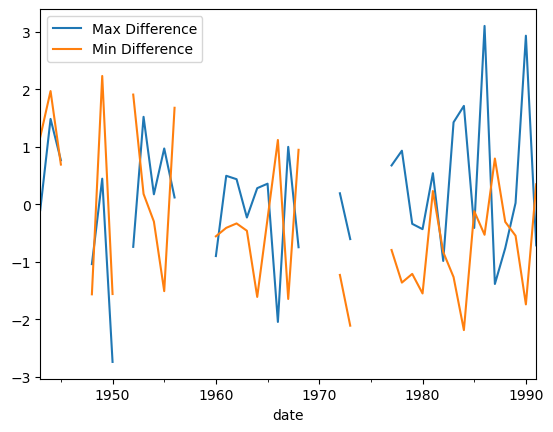

In [151]:
(Ext_Sum_U93['Max_1']-Ext_Sum_U93['PRO Max']).resample('Y').mean().plot(label = 'Max Difference')
(Ext_Sum_U93['Min_1']-Ext_Sum_U93['PRO Min']).resample('Y').mean().plot(label = 'Min Difference')
plt.legend()

## Chapter 2.12, The Full Data Matrix

#So after using the extensive 1000 trial function, we have developed the final tmax and tmin temperatures, which have their intrisic error built within them, therefore if one correlaiton value average is quite week, it is the property of less data used for estimating the tmax and tmin and this will need to be considered.

Lets load the data in , as we wont need anything above

In [152]:
Max_T_Estimation_1830_75 = pd.read_csv(r"C:\Users\jarra\Desktop\Masters Research\Python\Data\FOR HOMOGENISATION\Tmax_Est_1830_1875.csv")
Min_T_Estimation_1830_75 = pd.read_csv(r"C:\Users\jarra\Desktop\Masters Research\Python\Data\FOR HOMOGENISATION\Tmin_Est_1830_1875.csv")

#Change the column name to date
Max_T_Estimation_1830_75= Max_T_Estimation_1830_75.rename(columns={'Unnamed: 0':'date'})
Min_T_Estimation_1830_75= Min_T_Estimation_1830_75.rename(columns={'Unnamed: 0':'date'})

Max_T_Estimation_1830_75['date'] = pd.to_datetime(Max_T_Estimation_1830_75['date'])
Min_T_Estimation_1830_75['date'] = pd.to_datetime(Min_T_Estimation_1830_75['date'])

Max_T_Estimation_1830_75= Max_T_Estimation_1830_75.set_index('date')
Min_T_Estimation_1830_75= Min_T_Estimation_1830_75.set_index('date')


Max_T_Estimation_1830_75

,Max Mean,Max Median,Max Lower CI (60%),Max Upper CI (60%),Max Lower CI (90%),Max Upper CI (90%),Max Full Range,Max_1,Max_2,Max_3,...,Max_991,Max_992,Max_993,Max_994,Max_995,Max_996,Max_997,Max_998,Max_999,Max_1000
date,,,,,,,,,,,,,,,,,,,,,
1830-04-16,27.00,27.00,26.96,27.05,26.92,27.09,0.30,27.06,26.98,27.09,...,27.00,26.99,27.07,26.95,27.07,26.96,27.01,26.97,27.02,27.00
1830-04-17,27.58,27.58,27.53,27.63,27.49,27.68,0.34,27.66,27.57,27.68,...,27.58,27.58,27.65,27.53,27.65,27.53,27.59,27.54,27.59,27.59
1830-04-18,29.63,29.62,29.47,29.79,29.31,29.93,1.15,29.75,29.78,29.98,...,29.44,29.57,29.55,29.69,29.91,29.88,29.71,29.49,29.56,29.65
1830-04-19,28.34,28.34,28.26,28.42,28.18,28.51,0.66,28.58,28.32,28.45,...,28.25,28.52,28.19,28.32,28.25,28.24,28.26,28.41,28.33,28.24
1830-04-20,26.18,26.18,26.15,26.22,26.11,26.26,0.26,26.16,26.12,26.13,...,26.13,26.21,26.15,26.30,26.12,26.24,26.20,26.17,26.20,26.27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1875-12-28,39.08,39.07,38.96,39.21,38.85,39.35,0.97,39.00,39.03,39.15,...,39.21,38.75,39.22,38.97,39.19,39.08,39.31,38.90,38.99,39.15
1875-12-29,36.14,36.13,36.04,36.24,35.95,36.35,0.80,36.07,36.09,36.19,...,36.24,35.89,36.26,36.06,36.23,36.14,36.32,36.01,36.06,36.20
1875-12-30,33.20,33.20,33.12,33.28,33.05,33.36,0.64,33.15,33.15,33.23,...,33.27,33.02,33.30,33.14,33.28,33.20,33.34,33.11,33.13,33.26


In [153]:
Min_T_Estimation_1830_75

,Min Mean,Min Median,Min Lower CI (60%),Min Upper CI (60%),Min Lower CI (90%),Min Upper CI (90%),Min Full Range,Min_1,Min_2,Min_3,...,Min_991,Min_992,Min_993,Min_994,Min_995,Min_996,Min_997,Min_998,Min_999,Min_1000
date,,,,,,,,,,,,,,,,,,,,,
1830-04-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1830-04-17,15.12,15.00,14.93,15.09,14.88,16.11,1.59,15.09,15.07,15.03,...,14.88,14.92,14.98,14.91,14.90,15.02,15.01,15.03,15.05,14.95
1830-04-18,18.18,18.18,18.10,18.26,18.02,18.34,0.61,18.25,18.22,18.18,...,18.06,18.21,18.19,18.21,18.19,18.21,18.22,17.98,18.32,18.15
1830-04-19,19.16,19.16,19.06,19.25,18.96,19.35,0.71,19.24,19.20,19.17,...,18.99,19.21,19.18,19.19,19.19,19.21,19.22,18.93,19.33,19.13
1830-04-20,12.51,12.51,12.45,12.57,12.39,12.63,0.46,12.47,12.54,12.44,...,12.68,12.41,12.41,12.52,12.39,12.42,12.43,12.47,12.46,12.41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1875-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1875-12-29,22.61,22.61,22.41,22.80,22.27,22.97,1.47,22.95,22.22,22.54,...,22.85,22.25,22.58,22.72,22.63,22.52,22.36,22.90,22.58,23.00
1875-12-30,19.72,18.55,18.42,21.29,18.35,21.46,3.51,21.45,18.38,18.42,...,21.42,18.37,21.18,21.32,21.23,18.43,18.54,21.46,18.48,21.52


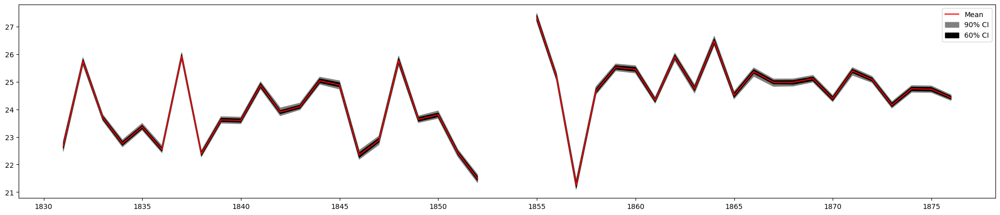

In [154]:
#Lets plot the mean and the percentiles as a resample Y
#Resample first

plt.figure(figsize = [25,5])

Max_30_75_Y = Max_T_Estimation_1830_75.resample('Y').mean().reset_index()
Min_30_75_Y = Min_T_Estimation_1830_75.resample('Y').mean().reset_index()


#fig, (ax1) = plt.subplots(1, 1, sharex=True)
#Mean
plt.plot(Max_30_75_Y['date'],Max_30_75_Y['Max Mean'],color = 'red',label = 'Mean')
plt.fill_between(Max_30_75_Y['date'],Max_30_75_Y['Max Lower CI (90%)'],Max_30_75_Y['Max Upper CI (90%)'],color = 'gray',label = '90% CI')
plt.fill_between(Max_30_75_Y['date'],Max_30_75_Y['Max Lower CI (60%)'],Max_30_75_Y['Max Upper CI (60%)'],color= 'k',label = '60% CI')
plt.legend()

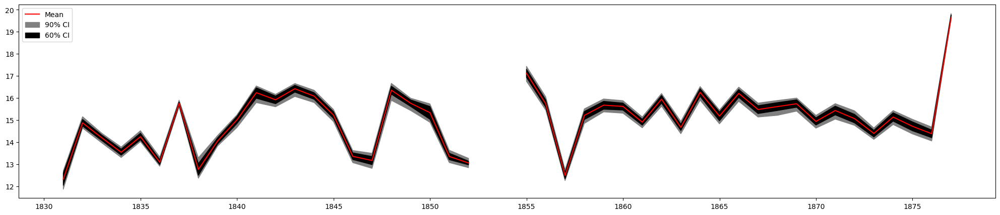

In [155]:
plt.figure(figsize = [25,5])
plt.plot(Min_30_75_Y['date'],Min_30_75_Y['Min Mean'],color = 'red',label = 'Mean')
plt.fill_between(Min_30_75_Y['date'],Min_30_75_Y['Min Lower CI (90%)'],Min_30_75_Y['Min Upper CI (90%)'],color = 'gray',label = '90% CI')
plt.fill_between(Min_30_75_Y['date'],Min_30_75_Y['Min Lower CI (60%)'],Min_30_75_Y['Min Upper CI (60%)'],color= 'k',label = '60% CI')
plt.legend()

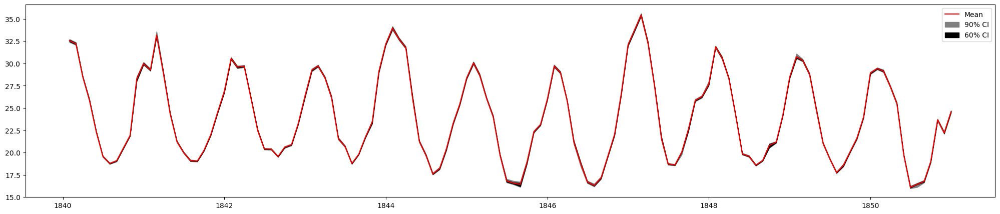

In [156]:
Max_30_75_3year = Max_T_Estimation_1830_75.loc['1840-01-01':'1850-12-31'].resample('m').mean().reset_index()
Min_30_75_3year  = Min_T_Estimation_1830_75.loc['1840-01-01':'1850-12-31'].resample('m').mean().reset_index()
plt.figure(figsize = [25,5])


#fig, (ax1) = plt.subplots(1, 1, sharex=True)
#Mean
plt.plot(Max_30_75_3year['date'],Max_30_75_3year['Max Mean'],color = 'red',label = 'Mean')
plt.fill_between(Max_30_75_3year['date'],Max_30_75_3year['Max Lower CI (90%)'],Max_30_75_3year['Max Upper CI (90%)'],color = 'gray',label = '90% CI')
plt.fill_between(Max_30_75_3year['date'],Max_30_75_3year['Max Lower CI (60%)'],Max_30_75_3year['Max Upper CI (60%)'],color= 'k',label = '60% CI')
plt.legend()

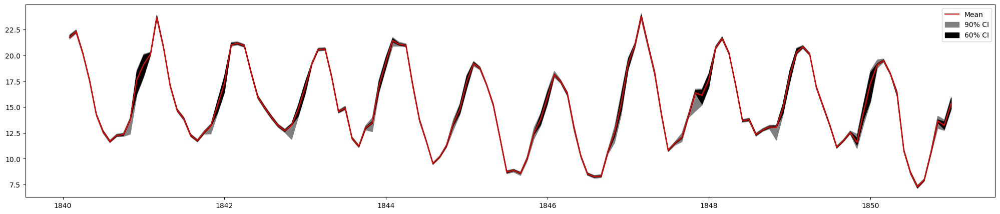

In [157]:
plt.figure(figsize = [25,5])

plt.plot(Min_30_75_3year['date'],Min_30_75_3year['Min Mean'],color = 'red',label = 'Mean')
plt.fill_between(Min_30_75_3year['date'],Min_30_75_3year['Min Lower CI (90%)'],Min_30_75_3year['Min Upper CI (90%)'],color = 'gray',label = '90% CI')
plt.fill_between(Min_30_75_3year['date'],Min_30_75_3year['Min Lower CI (60%)'],Min_30_75_3year['Min Upper CI (60%)'],color= 'k',label = '60% CI')
plt.legend()

So I think overall, I was expecting that the confidence intervals was going to be close in the maximum temperature then the minimum temperature. But for the most part it is super close which I am kind of shocked with, I was expectingmaybe a 0.5C 90th confidence interval maximum temperature and around 1.5C for the minimum temperautre. But this is not the case, thereofre this can be due to being limited with the data we had been gvien, for exmaple we only had mostly 10am and 4pm which in my function would have been changed to 9am and 3pm, this means that for the max it would be represented as the 4pm temperature at that day, and the min as te 9am temperature. What is intriguing though is in certnian section the confidence intervals blow out which interstingly only occurs from the end of winter to the peak of January and even February. Could this be due to the phsycial processes being not as strong in autumn that may produce temperature changes that do not fit the dataset? This is unknown, but attribtuing some statsitcis for the choice model and how it calcualtes the RMSE, we do see a significnatly higher RMSE in November to January compared to March which is much lower, therefore indicating something is affecting the monthly predictability between the subdailies and the max and min much greater then Msrch and even febraury, hwoeevr I cannot confirm nor deny this, it is only just speculation at this point. So with this in miind, we should expect for the most part the confidence we have in predicting the maximum temperature ot be much higher then the minimum temperaturwe and this shows in the estimated DEs, however we cannot just state that this is due to predicitng the DEs but also the confidence intervals in my are just the intrincisc properties. Maybe it might even be a good throught to slap on the RMSE of the choice model in addition with the 90th confidence interval and then predict the heatwaves from:

Mean Lower and Upper 60% CI Lower and Upper 90% CI Lower and Upper 90% CI +- RMSE.

This will then have a better understanding of the probable decadel trends of the heatwaves and see the extreme cases and the mean case.

That RMSE, will have to be developed and averaged by 1000 trails of the trained data as the subject of estimation or does it? these are the last few remaining questions I need answers for befroe I move on, to applying the heatwave function onto all of the data. As this last combo might tackle the intricnisc variabiltiy of my function and some error due to obsevrations being not highly correlated.

#Times of day specific to the strongest relationship to the min, spring season vs other months, relationship between the different times of day and the min and see if it realy swithces between 6 and 9 am.

# 2.13 CORR STOP VALUE FOR THE CHOICE MODEL

For the most part I used a corr_stop value of 0.85 which is where I determined how good my estimation is, now I will ahve to do this again but look at the overall test, the 9 to 6 and the 9 and 3 datasets to decide what Corr_Stop Value I should be taking beyond this chapter, and if the corr_stop value needs to be updated and reapplied for later datasets before I can finalise them

#### 0.6

In [158]:
CORR = 0.6
MaxT_A6, MaxC_A6, MinT_A6, MinC_A6 = FR.Temp_Estimation(PRO_Sub, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_36, MaxC_9_36, MinT_9_36, MinC_9_36 = FR.Temp_Estimation(PRO_Sub_9am_and_3pm_only, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_66, MaxC_9_66, MinT_9_66, MinC_9_66 = FR.Temp_Estimation(PRO_Sub_9am_to_6pm_only,  Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)

print('Max Entire Dataset {}'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Max',MaxT_A6,'Max_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_66,'Max_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_36,'Max_1',"1942-01-01","1992-01-01"))

print()

print('Min Entire Dataset'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Min',MinT_A6,'Min_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_66,'Min_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_36,'Min_1',"1942-01-01","1992-01-01"))

DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
Max Entire Dataset 0.6
U_All
('Root Mean Square Error: 0.88 degC', 'Mean Difference (obs-est): -0.24 degC')
U_96
('Root Mean Square Error: 0.88 degC', 'Mean Difference (obs-est): -0.22 degC')
U_93
('Root Mean Square Error: 1.21 degC', 'Mean Difference (obs-est): 0.15 degC')

Min Entire Dataset
U_All
('Root Mean Square Error: 1.18 degC', 'Mean Difference (obs-est): -0.27 degC')
U_96
('Root Mean Square Error: 1.47 degC', 'Mean Difference (obs-est): -0.37 degC')
U_93
('Root Mean Square Error: 1.72 degC', 'Mean Difference (obs-est): -0.23 degC')


#### 0.65

In [159]:
CORR = 0.65
MaxT_A65, MaxC_A65, MinT_A65, MinC_A65 = FR.Temp_Estimation(PRO_Sub, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_365, MaxC_9_365, MinT_9_365, MinC_9_365 = FR.Temp_Estimation(PRO_Sub_9am_and_3pm_only, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_665, MaxC_9_665, MinT_9_665, MinC_9_665 = FR.Temp_Estimation(PRO_Sub_9am_to_6pm_only,  Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)


print('Max Entire Dataset {}'.format(CORR))


print('U_All')
print(Statiscal_Stats(Original,'PRO Max',MaxT_A65,'Max_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_665,'Max_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_365,'Max_1',"1942-01-01","1992-01-01"))

print()

print('Min Entire Dataset'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Min',MinT_A65,'Min_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_665,'Min_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_365,'Min_1',"1942-01-01","1992-01-01"))

DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
Max Entire Dataset 0.65
U_All
('Root Mean Square Error: 0.88 degC', 'Mean Difference (obs-est): -0.2 degC')
U_96
('Root Mean Square Error: 0.87 degC', 'Mean Difference (obs-est): -0.18 degC')
U_93
('Root Mean Square Error: 1.22 degC', 'Mean Difference (obs-est): 0.11 degC')

Min Entire Dataset
U_All
('Root Mean Square Error: 1.19 degC', 'Mean Difference (obs-est): -0.29 degC')
U_96
('Root Mean Square Error: 1.47 degC', 'Mean Difference (obs-est): -0.37 degC')
U_93
('Root Mean Square Error: 1.68 degC', 'Mean Difference (obs-est): -0.27 degC')


#### 0.7

In [160]:
CORR = 0.7
MaxT_A7, MaxC_A7, MinT_A7, MinC_A7 = FR.Temp_Estimation(PRO_Sub, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_37, MaxC_9_37, MinT_9_37, MinC_9_37 = FR.Temp_Estimation(PRO_Sub_9am_and_3pm_only, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_67, MaxC_9_67, MinT_9_67, MinC_9_67 = FR.Temp_Estimation(PRO_Sub_9am_to_6pm_only,  Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)

print('Max Entire Dataset {}'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Max',MaxT_A7,'Max_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_67,'Max_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_37,'Max_1',"1942-01-01","1992-01-01"))

print()

print('Min Entire Dataset'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Min',MinT_A7,'Min_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_67,'Min_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_37,'Min_1',"1942-01-01","1992-01-01"))

DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
Max Entire Dataset 0.7
U_All
('Root Mean Square Error: 0.88 degC', 'Mean Difference (obs-est): -0.22 degC')
U_96
('Root Mean Square Error: 0.89 degC', 'Mean Difference (obs-est): -0.25 degC')
U_93
('Root Mean Square Error: 1.23 degC', 'Mean Difference (obs-est): 0.1 degC')

Min Entire Dataset
U_All
('Root Mean Square Error: 1.18 degC', 'Mean Difference (obs-est): -0.31 degC')
U_96
('Root Mean Square Error: 1.49 degC', 'Mean Difference (obs-est): -0.37 degC')
U_93
('Root Mean Square Error: 1.68 degC', 'Mean Difference (obs-est): -0.31 degC')


#### 0.75

In [161]:
CORR = 0.75
MaxT_A75, MaxC_A75, MinT_A75, MinC_A75 = FR.Temp_Estimation(PRO_Sub, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_375, MaxC_9_375, MinT_9_375, MinC_9_375 = FR.Temp_Estimation(PRO_Sub_9am_and_3pm_only, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_675, MaxC_9_675, MinT_9_675, MinC_9_675 = FR.Temp_Estimation(PRO_Sub_9am_to_6pm_only,  Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)

print('Max Entire Dataset {}'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Max',MaxT_A75,'Max_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_675,'Max_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_375,'Max_1',"1942-01-01","1992-01-01"))

print()

print('Min Entire Dataset'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Min',MinT_A75,'Min_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_675,'Min_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_375,'Min_1',"1942-01-01","1992-01-01"))

DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
Max Entire Dataset 0.75
U_All
('Root Mean Square Error: 0.87 degC', 'Mean Difference (obs-est): -0.18 degC')
U_96
('Root Mean Square Error: 0.88 degC', 'Mean Difference (obs-est): -0.33 degC')
U_93
('Root Mean Square Error: 1.23 degC', 'Mean Difference (obs-est): 0.17 degC')

Min Entire Dataset
U_All
('Root Mean Square Error: 1.19 degC', 'Mean Difference (obs-est): -0.29 degC')
U_96
('Root Mean Square Error: 1.45 degC', 'Mean Difference (obs-est): -0.32 degC')
U_93
('Root Mean Square Error: 1.73 degC', 'Mean Difference (obs-est): -0.34 degC')


#### 0.8

In [162]:
CORR = 0.8
MaxT_A8, MaxC_A8, MinT_A8, MinC_A8 = FR.Temp_Estimation(PRO_Sub, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_38, MaxC_9_38, MinT_9_38, MinC_9_38 = FR.Temp_Estimation(PRO_Sub_9am_and_3pm_only, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_68, MaxC_9_68, MinT_9_68, MinC_9_68 = FR.Temp_Estimation(PRO_Sub_9am_to_6pm_only,  Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)

print('Max Entire Dataset {}'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Max',MaxT_A8,'Max_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_68,'Max_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_38,'Max_1',"1942-01-01","1992-01-01"))

print()

print('Min Entire Dataset'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Min',MinT_A8,'Min_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_68,'Min_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_38,'Min_1',"1942-01-01","1992-01-01"))

DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
Max Entire Dataset 0.8
U_All
('Root Mean Square Error: 0.85 degC', 'Mean Difference (obs-est): -0.25 degC')
U_96
('Root Mean Square Error: 0.86 degC', 'Mean Difference (obs-est): -0.38 degC')
U_93
('Root Mean Square Error: 1.26 degC', 'Mean Difference (obs-est): 0.18 degC')

Min Entire Dataset
U_All
('Root Mean Square Error: 1.18 degC', 'Mean Difference (obs-est): -0.31 degC')
U_96
('Root Mean Square Error: 1.48 degC', 'Mean Difference (obs-est): -0.34 degC')
U_93
('Root Mean Square Error: 1.7 degC', 'Mean Difference (obs-est): -0.24 degC')


#### 0.85

In [163]:
CORR = 0.85
MaxT_A85, MaxC_A85, MinT_A85, MinC_A85 = FR.Temp_Estimation(PRO_Sub, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_385, MaxC_9_385, MinT_9_385, MinC_9_385 = FR.Temp_Estimation(PRO_Sub_9am_and_3pm_only, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_685, MaxC_9_685, MinT_9_685, MinC_9_685 = FR.Temp_Estimation(PRO_Sub_9am_to_6pm_only,  Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)


print('Max Entire Dataset {}'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Max',MaxT_A85,'Max_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_685,'Max_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_385,'Max_1',"1942-01-01","1992-01-01"))

print()

print('Min Entire Dataset'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Min',MinT_A85,'Min_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_685,'Min_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_385,'Min_1',"1942-01-01","1992-01-01"))

DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
Max Entire Dataset 0.85
U_All
('Root Mean Square Error: 0.87 degC', 'Mean Difference (obs-est): -0.21 degC')
U_96
('Root Mean Square Error: 0.88 degC', 'Mean Difference (obs-est): -0.3 degC')
U_93
('Root Mean Square Error: 1.23 degC', 'Mean Difference (obs-est): 0.17 degC')

Min Entire Dataset
U_All
('Root Mean Square Error: 1.19 degC', 'Mean Difference (obs-est): -0.32 degC')
U_96
('Root Mean Square Error: 1.43 degC', 'Mean Difference (obs-est): -0.34 degC')
U_93
('Root Mean Square Error: 1.71 degC', 'Mean Difference (obs-est): -0.27 degC')


#### 0.9

In [164]:
CORR = 0.9
MaxT_A9, MaxC_A9, MinT_A9, MinC_A9 = FR.Temp_Estimation(PRO_Sub, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_39, MaxC_9_39, MinT_9_39, MinC_9_39 = FR.Temp_Estimation(PRO_Sub_9am_and_3pm_only, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_69, MaxC_9_69, MinT_9_69, MinC_9_69 = FR.Temp_Estimation(PRO_Sub_9am_to_6pm_only,  Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)

print('Max Entire Dataset {}'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Max',MaxT_A9,'Max_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_69,'Max_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_39,'Max_1',"1942-01-01","1992-01-01"))

print()

print('Min Entire Dataset'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Min',MinT_A9,'Min_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_69,'Min_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_39,'Min_1',"1942-01-01","1992-01-01"))

DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
Max Entire Dataset 0.9
U_All
('Root Mean Square Error: 0.87 degC', 'Mean Difference (obs-est): -0.4 degC')
U_96
('Root Mean Square Error: 1.09 degC', 'Mean Difference (obs-est): -0.06 degC')
U_93
('Root Mean Square Error: 1.22 degC', 'Mean Difference (obs-est): 0.18 degC')

Min Entire Dataset
U_All
('Root Mean Square Error: 1.34 degC', 'Mean Difference (obs-est): -0.39 degC')
U_96
('Root Mean Square Error: 1.46 degC', 'Mean Difference (obs-est): -0.34 degC')
U_93
('Root Mean Square Error: 1.71 degC', 'Mean Difference (obs-est): -0.29 degC')


#### 0.925

In [165]:
CORR = 0.925
MaxT_A95, MaxC_A95, MinT_A95, MinC_A95 = FR.Temp_Estimation(PRO_Sub, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_395, MaxC_9_395, MinT_9_395, MinC_9_395 = FR.Temp_Estimation(PRO_Sub_9am_and_3pm_only, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_695, MaxC_9_695, MinT_9_695, MinC_9_695 = FR.Temp_Estimation(PRO_Sub_9am_to_6pm_only,  Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)

print('Max Entire Dataset {}'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Max',MaxT_A95,'Max_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_695,'Max_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_395,'Max_1',"1942-01-01","1992-01-01"))

print()

print('Min Entire Dataset'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Min',MinT_A95,'Min_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_695,'Min_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_395,'Min_1',"1942-01-01","1992-01-01"))

DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
Max Entire Dataset 0.925
U_All
('Root Mean Square Error: 0.91 degC', 'Mean Difference (obs-est): -0.38 degC')
U_96
('Root Mean Square Error: 1.11 degC', 'Mean Difference (obs-est): -0.09 degC')
U_93
('Root Mean Square Error: 1.21 degC', 'Mean Difference (obs-est): 0.12 degC')

Min Entire Dataset
U_All
('Root Mean Square Error: 1.19 degC', 'Mean Difference (obs-est): -0.31 degC')
U_96
('Root Mean Square Error: 1.43 degC', 'Mean Difference (obs-est): -0.26 degC')
U_93
('Root Mean Square Error: 1.68 degC', 'Mean Difference (obs-est): -0.27 degC')


#### 0.95

In [166]:
CORR = 0.95
MaxT_A95, MaxC_A95, MinT_A95, MinC_A95 = FR.Temp_Estimation(PRO_Sub, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_395, MaxC_9_395, MinT_9_395, MinC_9_395 = FR.Temp_Estimation(PRO_Sub_9am_and_3pm_only, Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)
MaxT_9_695, MaxC_9_695, MinT_9_695, MinC_9_695 = FR.Temp_Estimation(PRO_Sub_9am_to_6pm_only,  Sub_Daily_Training, Daily_Extreme_Training, 10, CORR)

print('Max Entire Dataset {}'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Max',MaxT_A95,'Max_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_695,'Max_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_395,'Max_1',"1942-01-01","1992-01-01"))

print()

print('Min Entire Dataset'.format(CORR))
print('U_All')
print(Statiscal_Stats(Original,'PRO Min',MinT_A95,'Min_1',"1942-01-01","1992-01-01"))
print('U_96')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_695,'Min_1',"1942-01-01","1992-01-01"))
print('U_93')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_395,'Min_1',"1942-01-01","1992-01-01"))

DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
DONE P1
DONE P2
DONE P3
DONE P4
DONE P5
DONE P6
DONE P7
1
2
3
4
5
6
7
8
9
10
DONE P8
1
2
3
4
5
6
7
8
9
10
DONE P9
DONE P10
Max Entire Dataset 0.95
U_All
('Root Mean Square Error: 1.35 degC', 'Mean Difference (obs-est): 0.3 degC')
U_96
('Root Mean Square Error: 1.37 degC', 'Mean Difference (obs-est): 0.31 degC')
U_93
('Root Mean Square Error: 1.22 degC', 'Mean Difference (obs-est): 0.14 degC')

Min Entire Dataset
U_All
('Root Mean Square Error: 1.13 degC', 'Mean Difference (obs-est): -0.21 degC')
U_96
('Root Mean Square Error: 1.45 degC', 'Mean Difference (obs-est): -0.36 degC')
U_93
('Root Mean Square Error: 1.74 degC', 'Mean Difference (obs-est): -0.27 degC')


### DISCUSSION ON THE ABOVE

So lets collate these all together U_All, then U_96,

I will avoid U_93 because this does not have data with more then 3 values, therefore it is irrelevent to this proposed estimator

In [183]:
MaxT_A6

,date,Max Mean,Max Median,Max Lower CI (60%),Max Upper CI (60%),Max Lower CI (90%),Max Upper CI (90%),Max Full Range,Max_1,Max_2,Max_3,Max_4,Max_5,Max_6,Max_7,Max_8,Max_9,Max_10
0,1942-01-01,28.29,28.30,28.26,28.32,28.24,28.34,0.13,28.26,28.26,28.29,28.26,28.22,28.32,28.30,28.33,28.35,28.32
1,1942-01-02,27.48,27.48,27.45,27.51,27.44,27.53,0.12,27.45,27.45,27.47,27.46,27.43,27.51,27.50,27.51,27.55,27.50
2,1942-01-03,25.15,25.15,25.12,25.18,25.11,25.22,0.14,25.11,25.12,25.11,25.15,25.13,25.19,25.18,25.15,25.25,25.16
3,1942-01-04,28.60,28.60,28.56,28.63,28.54,28.65,0.13,28.57,28.56,28.60,28.56,28.52,28.62,28.60,28.64,28.65,28.63
4,1942-01-05,35.38,35.37,35.34,35.46,35.24,35.50,0.29,35.39,35.35,35.49,35.28,35.21,35.37,35.35,35.50,35.37,35.46
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18378,1992-04-26,26.15,26.14,26.11,26.18,26.09,26.20,0.11,26.09,26.14,26.14,26.19,26.14,26.10,26.20,26.11,26.18,26.17
18379,1992-04-27,22.75,22.76,22.71,22.78,22.69,22.82,0.16,22.72,22.77,22.69,22.85,22.79,22.69,22.77,22.72,22.78,22.75
18380,1992-04-28,24.01,24.02,23.97,24.04,23.96,24.07,0.14,23.97,24.02,23.97,24.09,24.03,23.96,24.04,23.98,24.04,24.02
18381,1992-04-29,24.30,24.31,24.27,24.34,24.25,24.36,0.13,24.26,24.31,24.27,24.38,24.32,24.25,24.34,24.27,24.34,24.31


In [184]:
print('U_All')
print('Max')
print(Statiscal_Stats(Original,'PRO Max',MaxT_A6,'Max Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Max',MaxT_A65,'Max Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Max',MaxT_A7,'Max Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Max',MaxT_A75,'Max Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Max',MaxT_A8,'Max Mean',"1942-01-01","1992-01-01"))      
print(Statiscal_Stats(Original,'PRO Max',MaxT_A85,'Max Mean',"1942-01-01","1992-01-01"))      
print(Statiscal_Stats(Original,'PRO Max',MaxT_A9,'Max Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Max',MaxT_A95,'Max Mean',"1942-01-01","1992-01-01"))
print()
print()
print('Min')
print(Statiscal_Stats(Original,'PRO Min',MinT_A6,'Min Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Min',MinT_A65,'Min Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Min',MinT_A7,'Min Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Min',MinT_A75,'Min Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Min',MinT_A8,'Min Mean',"1942-01-01","1992-01-01"))      
print(Statiscal_Stats(Original,'PRO Min',MinT_A85,'Min Mean',"1942-01-01","1992-01-01"))      
print(Statiscal_Stats(Original,'PRO Min',MinT_A9,'Min Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Min',MinT_A95,'Min Mean',"1942-01-01","1992-01-01"))

U_All
Max
('Root Mean Square Error: 0.86 degC', 'Mean Difference (obs-est): -0.22 degC')
('Root Mean Square Error: 0.85 degC', 'Mean Difference (obs-est): -0.24 degC')
('Root Mean Square Error: 0.84 degC', 'Mean Difference (obs-est): -0.23 degC')
('Root Mean Square Error: 0.84 degC', 'Mean Difference (obs-est): -0.25 degC')
('Root Mean Square Error: 0.86 degC', 'Mean Difference (obs-est): -0.23 degC')
('Root Mean Square Error: 0.86 degC', 'Mean Difference (obs-est): -0.22 degC')
('Root Mean Square Error: 0.87 degC', 'Mean Difference (obs-est): -0.2 degC')
('Root Mean Square Error: 1.03 degC', 'Mean Difference (obs-est): 0.17 degC')


Min
('Root Mean Square Error: 1.17 degC', 'Mean Difference (obs-est): -0.3 degC')
('Root Mean Square Error: 1.18 degC', 'Mean Difference (obs-est): -0.3 degC')
('Root Mean Square Error: 1.18 degC', 'Mean Difference (obs-est): -0.32 degC')
('Root Mean Square Error: 1.19 degC', 'Mean Difference (obs-est): -0.32 degC')
('Root Mean Square Error: 1.18 degC', 'M

The final section of my Estimation Temperature Function was to test how my function competes when choosing a threshold correaltion value for the C293 function or in my choice the choice_model function I am using. From what we can see in the U_All is the corr of 0.6 to 0.95 by incmrenets of 0.5, So this looks at every data value that the data has been trained on.

From what we can see is gthat we observe the RMSE to be quite similar from 0.65 to 0.9 in both tmax and tmin before a sudden change to increasing more error in the tmax and less error in tmin fro the 0.95 correlation value. From this example, that sudden increase in error in the tmax outweights the decrease in tmin therefore I would be sticking to anything udner 0.95 at the moment. 

In [186]:
print('U_9_6')
print('Max')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_66,'Max Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_665,'Max Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_67,'Max Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_675,'Max Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_68,'Max Mean',"1942-01-01","1992-01-01"))      
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_685,'Max Mean',"1942-01-01","1992-01-01"))      
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_69,'Max Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_695,'Max Mean',"1942-01-01","1992-01-01"))
print()
print()
print('Min')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_66,'Min Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Min',MinT_9_665,'Min Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Min',MinT_9_67,'Min Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Min',MinT_9_675,'Min Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Min',MinT_9_68,'Min Mean',"1942-01-01","1992-01-01"))      
print(Statiscal_Stats(Original,'PRO Min',MinT_9_685,'Min Mean',"1942-01-01","1992-01-01"))      
print(Statiscal_Stats(Original,'PRO Min',MinT_9_69,'Min Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Min',MinT_9_695,'Min Mean',"1942-01-01","1992-01-01"))

U_9_6
Max
('Root Mean Square Error: 0.86 degC', 'Mean Difference (obs-est): -0.24 degC')
('Root Mean Square Error: 0.85 degC', 'Mean Difference (obs-est): -0.24 degC')
('Root Mean Square Error: 0.85 degC', 'Mean Difference (obs-est): -0.27 degC')
('Root Mean Square Error: 0.84 degC', 'Mean Difference (obs-est): -0.27 degC')
('Root Mean Square Error: 0.84 degC', 'Mean Difference (obs-est): -0.28 degC')
('Root Mean Square Error: 0.83 degC', 'Mean Difference (obs-est): -0.26 degC')
('Root Mean Square Error: 0.88 degC', 'Mean Difference (obs-est): -0.23 degC')
('Root Mean Square Error: 1.27 degC', 'Mean Difference (obs-est): 0.29 degC')


Min
('Root Mean Square Error: 1.48 degC', 'Mean Difference (obs-est): -0.35 degC')
('Root Mean Square Error: 1.47 degC', 'Mean Difference (obs-est): -0.36 degC')
('Root Mean Square Error: 1.47 degC', 'Mean Difference (obs-est): -0.35 degC')
('Root Mean Square Error: 1.46 degC', 'Mean Difference (obs-est): -0.36 degC')
('Root Mean Square Error: 1.47 degC',

Now comparing to the time where the data is found from data from 9am to 6pm, we see around the same error as the subdaiyl data from 12am to 12am in the max with a sligthly less error but still sdingifincant fpr the corr value of 0.95. While in the minimum temperature this error at the 0.95 correaltion is on par with the rest of the correaltions but in the mean difference it is the largest difference from the observed however it is still noted to be still in the same range as the other errors thereofre we cannot conclude if this causes more difference in the mean.

But what is notiacable is that the mean difference in the tmax is actually positive compared to the other correaltion valus, this isnt goo=d for the model and this should be removed from the calculation overall

In [189]:
MaxC_A6

,date,CorrMax Mean,CorrMax Median,CorrMax Lower CI (60%),CorrMax Upper CI (60%),CorrMax Lower CI (90%),CorrMax Upper CI (90%),CorrMax Full Range,MaxCorr_1,MaxCorr_2,MaxCorr_3,MaxCorr_4,MaxCorr_5,MaxCorr_6,MaxCorr_7,MaxCorr_8,MaxCorr_9,MaxCorr_10
0,1942-01-01,0.9635,0.9636,0.9622,0.9641,0.9618,0.9653,0.0046,0.9642,0.9641,0.9635,0.9637,0.9615,0.9633,0.9620,0.9637,0.9623,0.9661
1,1942-01-02,0.9635,0.9636,0.9622,0.9641,0.9618,0.9653,0.0046,0.9642,0.9641,0.9635,0.9637,0.9615,0.9633,0.9620,0.9637,0.9623,0.9661
2,1942-01-03,0.9635,0.9636,0.9622,0.9641,0.9618,0.9653,0.0046,0.9642,0.9641,0.9635,0.9637,0.9615,0.9633,0.9620,0.9637,0.9623,0.9661
3,1942-01-04,0.9635,0.9636,0.9622,0.9641,0.9618,0.9653,0.0046,0.9642,0.9641,0.9635,0.9637,0.9615,0.9633,0.9620,0.9637,0.9623,0.9661
4,1942-01-05,0.9635,0.9636,0.9622,0.9641,0.9618,0.9653,0.0046,0.9642,0.9641,0.9635,0.9637,0.9615,0.9633,0.9620,0.9637,0.9623,0.9661
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18378,1992-04-26,0.9516,0.9527,0.9455,0.9575,0.9435,0.9589,0.0163,0.9537,0.9593,0.9585,0.9429,0.9461,0.9572,0.9458,0.9567,0.9441,0.9516
18379,1992-04-27,0.9516,0.9527,0.9455,0.9575,0.9435,0.9589,0.0163,0.9537,0.9593,0.9585,0.9429,0.9461,0.9572,0.9458,0.9567,0.9441,0.9516
18380,1992-04-28,0.9516,0.9527,0.9455,0.9575,0.9435,0.9589,0.0163,0.9537,0.9593,0.9585,0.9429,0.9461,0.9572,0.9458,0.9567,0.9441,0.9516
18381,1992-04-29,0.9516,0.9527,0.9455,0.9575,0.9435,0.9589,0.0163,0.9537,0.9593,0.9585,0.9429,0.9461,0.9572,0.9458,0.9567,0.9441,0.9516


In [191]:
print('U_All Corr')
print('Max')
print(MaxC_A6['CorrMax Mean'].mean())
print(MaxC_A65['CorrMax Mean'].mean())
print(MaxC_A7['CorrMax Mean'].mean())
print(MaxC_A75['CorrMax Mean'].mean())
print(MaxC_A8['CorrMax Mean'].mean())
print(MaxC_A85['CorrMax Mean'].mean())
print(MaxC_A9['CorrMax Mean'].mean())
print(MaxC_A95['CorrMax Mean'].mean())
print()
print()

print('Min')
print(MinC_A6['CorrMin Mean'].mean())
print(MinC_A65['CorrMin Mean'].mean())
print(MinC_A7['CorrMin Mean'].mean())
print(MinC_A75['CorrMin Mean'].mean())
print(MinC_A8['CorrMin Mean'].mean())
print(MinC_A85['CorrMin Mean'].mean())
print(MinC_A9['CorrMin Mean'].mean())
print(MinC_A95['CorrMin Mean'].mean())

U_All Corr
Max
0.9433060925854709
0.9431121362129035
0.9438379481042568
0.9425555622042167
0.9438561061851021
0.9445731599847369
0.9438719958657464
0.9455081270739496


Min
0.9553783223629793
0.9560688135777671
0.9561583963443516
0.9558106946636008
0.9559019637707994
0.9562328292444138
0.9553272262416574
0.9564593102323702


In [192]:
print('U_9_6 Corr')
print('Max')
print(MaxC_9_66['CorrMax Mean'].mean())
print(MaxC_9_665['CorrMax Mean'].mean())
print(MaxC_9_67['CorrMax Mean'].mean())
print(MaxC_9_675['CorrMax Mean'].mean())
print(MaxC_9_68['CorrMax Mean'].mean())
print(MaxC_9_685['CorrMax Mean'].mean())
print(MaxC_9_69['CorrMax Mean'].mean())
print(MaxC_9_695['CorrMax Mean'].mean())
print()
print()

print('Min')
print(MinC_9_66['CorrMin Mean'].mean())
print(MinC_9_665['CorrMin Mean'].mean())
print(MinC_9_67['CorrMin Mean'].mean())
print(MinC_9_675['CorrMin Mean'].mean())
print(MinC_9_68['CorrMin Mean'].mean())
print(MinC_9_685['CorrMin Mean'].mean())
print(MinC_9_69['CorrMin Mean'].mean())
print(MinC_9_695['CorrMin Mean'].mean())

U_9_6 Corr
Max
0.9430702116086378
0.9428324430179332
0.9434338954469264
0.9428632704127863
0.9432294728825747
0.9439261926780764
0.944702817820849
0.9450726704019877


Min
0.8274169286841475
0.8281151770657594
0.8283702388075935
0.8278473045748957
0.8284141435021686
0.8297164717402096
0.8284770004897124
0.826174476418433


In [193]:
print('U_9_3')
print('Max')
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_36,'Max Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_365,'Max Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_37,'Max Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_375,'Max Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_38,'Max Mean',"1942-01-01","1992-01-01"))      
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_385,'Max Mean',"1942-01-01","1992-01-01"))      
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_39,'Max Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Max',MaxT_9_395,'Max Mean',"1942-01-01","1992-01-01"))
print()
print()
print('Min')
print(Statiscal_Stats(Original,'PRO Min',MinT_9_36,'Min Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Min',MinT_9_365,'Min Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Min',MinT_9_37,'Min Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Min',MinT_9_375,'Min Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Min',MinT_9_38,'Min Mean',"1942-01-01","1992-01-01"))      
print(Statiscal_Stats(Original,'PRO Min',MinT_9_385,'Min Mean',"1942-01-01","1992-01-01"))      
print(Statiscal_Stats(Original,'PRO Min',MinT_9_39,'Min Mean',"1942-01-01","1992-01-01"))
print(Statiscal_Stats(Original,'PRO Min',MinT_9_395,'Min Mean',"1942-01-01","1992-01-01"))

print()
print()
print()
print()

print('U_9_3 Corr')
print('Max')
print(MaxC_9_36['CorrMax Mean'].mean())
print(MaxC_9_365['CorrMax Mean'].mean())
print(MaxC_9_37['CorrMax Mean'].mean())
print(MaxC_9_375['CorrMax Mean'].mean())
print(MaxC_9_38['CorrMax Mean'].mean())
print(MaxC_9_385['CorrMax Mean'].mean())
print(MaxC_9_39['CorrMax Mean'].mean())
print(MaxC_9_395['CorrMax Mean'].mean())
print()
print()

print('Min')
print(MinC_9_36['CorrMin Mean'].mean())
print(MinC_9_365['CorrMin Mean'].mean())
print(MinC_9_37['CorrMin Mean'].mean())
print(MinC_9_375['CorrMin Mean'].mean())
print(MinC_9_38['CorrMin Mean'].mean())
print(MinC_9_385['CorrMin Mean'].mean())
print(MinC_9_39['CorrMin Mean'].mean())
print(MinC_9_395['CorrMin Mean'].mean())

U_9_3
Max
('Root Mean Square Error: 1.22 degC', 'Mean Difference (obs-est): 0.14 degC')
('Root Mean Square Error: 1.23 degC', 'Mean Difference (obs-est): 0.13 degC')
('Root Mean Square Error: 1.23 degC', 'Mean Difference (obs-est): 0.14 degC')
('Root Mean Square Error: 1.23 degC', 'Mean Difference (obs-est): 0.14 degC')
('Root Mean Square Error: 1.23 degC', 'Mean Difference (obs-est): 0.15 degC')
('Root Mean Square Error: 1.23 degC', 'Mean Difference (obs-est): 0.14 degC')
('Root Mean Square Error: 1.23 degC', 'Mean Difference (obs-est): 0.15 degC')
('Root Mean Square Error: 1.22 degC', 'Mean Difference (obs-est): 0.14 degC')


Min
('Root Mean Square Error: 1.69 degC', 'Mean Difference (obs-est): -0.25 degC')
('Root Mean Square Error: 1.68 degC', 'Mean Difference (obs-est): -0.26 degC')
('Root Mean Square Error: 1.7 degC', 'Mean Difference (obs-est): -0.26 degC')
('Root Mean Square Error: 1.7 degC', 'Mean Difference (obs-est): -0.26 degC')
('Root Mean Square Error: 1.69 degC', 'Mean Di

Using 9am and 4pm only vlaues is a good indicator what the changes we should expect are, we know that the RMSE in the minimum temperautre is a result of the unceratianty of mainly the 9am temperrature therefore it makes sense why its so out of whack, but what we also see is that with these values the mean difference througjkout all of the correlations is actually positive which is interesitng to know, it would be exoected due to the 3pm temperautre possibly underestimating the max while the 12pm more correalted temperauteewould be overestimating the max temperaturee

In [194]:
CorrAve93Max = [0.9369806102634857,
0.936663156726778,
0.9359809875173598,
0.9370336199722678,
0.936382457697652,
0.9362437558947393,
0.9366528876561692,
0.9377562385574986]
CorrAve93Min = [0.8272302529397868,
0.8254525515863832,
0.8246281617483491,
0.8241899822497151,
0.8262213723098595,
0.8243646993565024,
0.8256160028843377,
0.8256040326159253]

In [195]:
CorrAve96Max = [0.9430702116086378,
0.9428324430179332,
0.9434338954469264,
0.9428632704127863,
0.9432294728825747,
0.9439261926780764,
0.944702817820849,
0.9450726704019877]
CorrAve96Min = [0.8274169286841475,
0.8281151770657594,
0.8283702388075935,
0.8278473045748957,
0.8284141435021686,
0.8297164717402096,
0.8284770004897124,
0.826174476418433]




In [196]:
CorrAveAllMax = [0.9433060925854709,
0.9431121362129035,
0.9438379481042568,
0.9425555622042167,
0.9438561061851021,
0.9445731599847369,
0.9438719958657464,
0.9455081270739496]



CorrAveAllMin = [0.9553783223629793,
0.9560688135777671,
0.9561583963443516,
0.9558106946636008,
0.9559019637707994,
0.9562328292444138,
0.9553272262416574,
0.9564593102323702]

In [197]:
Corr_Lim = [0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95]

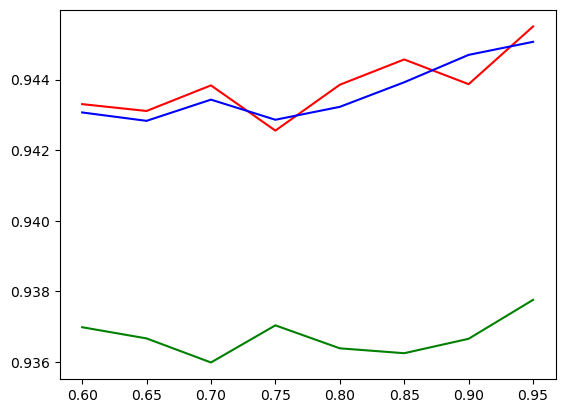

In [201]:
plt.plot(Corr_Lim,CorrAveAllMax, color = 'red')
plt.plot(Corr_Lim,CorrAve96Max, color = 'blue')
plt.plot(Corr_Lim,CorrAve93Max, color = 'green')


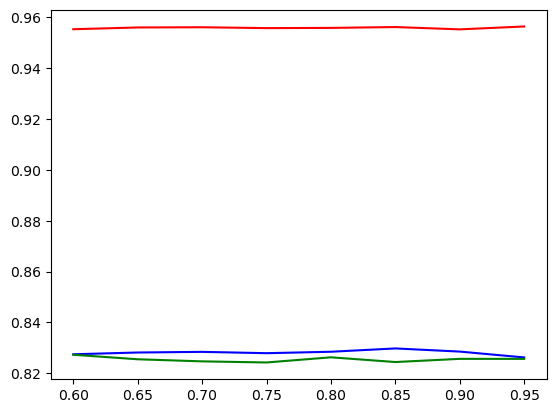

In [202]:
plt.plot(Corr_Lim,CorrAveAllMin, color = 'red')
plt.plot(Corr_Lim,CorrAve96Min, color = 'blue')
plt.plot(Corr_Lim,CorrAve93Min, color = 'green')


Using the average of 10 trails we see a clear improvement of the correaltion value, which would be expected as more values below the threshold have been thrown out resulting in the higher correaltion values when the threshold gets high. We satrt seeign this change around about the 0.75 to 0.8 mark in th all and 96 ones, but this starts later at 0.85 in the 93 chart on max, for the min, there is no real change other then a slight decrease from 0.85 inthe min.
Now from the RMSEs the means show that ther is a increase in the RMSE from 0.9 onwards especially notoicable in the 96 plot, we expected that the 93 plot should have no difference as the choice model by function expects that there is more then 2 which it isnt.

From this we can comprimsie between the two and suggest that the correlation value of 0.85 was a reasonable target to be used going forward with this rsearch>

In [181]:
MaxC_A6,

,date,CorrMax Mean,CorrMax Median,CorrMax Lower CI (60%),CorrMax Upper CI (60%),CorrMax Lower CI (90%),CorrMax Upper CI (90%),CorrMax Full Range,MaxCorr_1,MaxCorr_2,MaxCorr_3,MaxCorr_4,MaxCorr_5,MaxCorr_6,MaxCorr_7,MaxCorr_8,MaxCorr_9,MaxCorr_10
0,1942-01-01,0.9635,0.9636,0.9622,0.9641,0.9618,0.9653,0.0046,0.9642,0.9641,0.9635,0.9637,0.9615,0.9633,0.9620,0.9637,0.9623,0.9661
1,1942-01-02,0.9635,0.9636,0.9622,0.9641,0.9618,0.9653,0.0046,0.9642,0.9641,0.9635,0.9637,0.9615,0.9633,0.9620,0.9637,0.9623,0.9661
2,1942-01-03,0.9635,0.9636,0.9622,0.9641,0.9618,0.9653,0.0046,0.9642,0.9641,0.9635,0.9637,0.9615,0.9633,0.9620,0.9637,0.9623,0.9661
3,1942-01-04,0.9635,0.9636,0.9622,0.9641,0.9618,0.9653,0.0046,0.9642,0.9641,0.9635,0.9637,0.9615,0.9633,0.9620,0.9637,0.9623,0.9661
4,1942-01-05,0.9635,0.9636,0.9622,0.9641,0.9618,0.9653,0.0046,0.9642,0.9641,0.9635,0.9637,0.9615,0.9633,0.9620,0.9637,0.9623,0.9661
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18378,1992-04-26,0.9516,0.9527,0.9455,0.9575,0.9435,0.9589,0.0163,0.9537,0.9593,0.9585,0.9429,0.9461,0.9572,0.9458,0.9567,0.9441,0.9516
18379,1992-04-27,0.9516,0.9527,0.9455,0.9575,0.9435,0.9589,0.0163,0.9537,0.9593,0.9585,0.9429,0.9461,0.9572,0.9458,0.9567,0.9441,0.9516
18380,1992-04-28,0.9516,0.9527,0.9455,0.9575,0.9435,0.9589,0.0163,0.9537,0.9593,0.9585,0.9429,0.9461,0.9572,0.9458,0.9567,0.9441,0.9516
18381,1992-04-29,0.9516,0.9527,0.9455,0.9575,0.9435,0.9589,0.0163,0.9537,0.9593,0.9585,0.9429,0.9461,0.9572,0.9458,0.9567,0.9441,0.9516
